# Setting

## Library

In [1]:
import pandas as pd
import numpy as np
import math

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
import random
import os
from tqdm.notebook import tqdm

In [4]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier

In [5]:
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score # 정확도
from sklearn.metrics import precision_score # 정밀도
from sklearn.metrics import recall_score # 재현율
from sklearn.metrics import f1_score # F1-Score
from sklearn.metrics import confusion_matrix

## Seed

In [6]:
def my_seed_everywhere(seed):
    random.seed(seed) # random
    np.random.seed(seed) # numpy
    os.environ["PYTHONHASHSEED"] = str(seed) # os
    print(f'고정된 Seed : {seed}')

In [7]:
my_seed_everywhere(42)

고정된 Seed : 42


# Data Set

In [8]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [9]:
path_file = '/content/drive/MyDrive/UNIST/AICP/data/dynmom_dat.csv'

df = pd.read_csv(path_file)

# Preprocessing

In [10]:
def preprocessing(data, used=None):
  # 'DATE'를 칼럼 대신 인덱스로 사용
  data.index = data['DATE']
  data = data.drop(columns='DATE')
  print("'DATE'를 칼럼 대신 인덱스로 사용")

  # 결측치 제거 및 모델 학습에 불필요한 칼럼 제거
  data = data.dropna()
  data = data.drop(columns=['winner', 'loser', 'form_date'])
  print("결측치 제거 및 모델 학습에 불필요한 칼럼 제거 ('winner', 'loser', 'form_date')")

  if used != None:
    used += ['wml']
    D = ', '.join(used)
    data = data[used]
    print(f"훈련에 사용되는 변수 들 : {D}")

  return data

In [11]:
df = preprocessing(df,
                   used=['mvol_t_1', 'mvol_t_2', 'mvol_t_3', 'mvol_t_4' , 'mvol_t_5', 'mvol_t_6'])

'DATE'를 칼럼 대신 인덱스로 사용
결측치 제거 및 모델 학습에 불필요한 칼럼 제거 ('winner', 'loser', 'form_date')
훈련에 사용되는 변수 들 : mvol_t_1, mvol_t_2, mvol_t_3, mvol_t_4, mvol_t_5, mvol_t_6, wml


In [12]:
def normal_wml(df):
  print("'wml'이 양수면 1 & 음수면 0")
  print("Output : 'Preprocessed_Data' & 'WML'")
  print()

  cond_wml = (df['wml']>=0)
  df.loc[cond_wml, 'pos_wml'] = 1
  df.loc[~cond_wml, 'pos_wml'] = 0
  WML = df[['wml']]

  df.drop(columns=['wml'], inplace=True)

  POS_WML = df['pos_wml'].value_counts()
  print(f'Ratio : {POS_WML[0]/POS_WML[1]}')
  print(POS_WML)

  return df, WML

In [13]:
dynmom, WML = normal_wml(df)

'wml'이 양수면 1 & 음수면 0
Output : 'Preprocessed_Data' & 'WML'

Ratio : 0.5634379263301501
1.0    733
0.0    413
Name: pos_wml, dtype: int64


# Modeling

In [14]:
def Roling_Windows(data, window_size, method, model, model_name, plot=True, plot_feature=True):

  # 학습 및 테스트 데이터 정보 & 실제값과 예측값 정보 수집
  result_dict = {
    'TRAIN_START_DATE':[],
    'TRAIN_END_DATE':[],
    'TEST_DATE':[],
    'Actual_POS_WML':[],
    f'{model_name}_PRED_POS_WML':[],
    f'{model_name}_PROB_POS_WML':[]
  }

  df_feature = pd.DataFrame()

  # 모델 학습이 종료되는 지점 설정
  end = data.shape[0] - window_size

  print('*'*50)
  print(f'\n{model_name} Model의 Rolling {method} Window를 실행합니다\n')
  print('설정된 Model의 하이퍼파리미터 : \n')
  for p, v in zip(model.get_params(deep=True).keys(), model.get_params(deep=True).values()):
    print(f'   {p} : {v}')
  print()
  print('*'*50)

  for i in tqdm(range(end)):

    # 모델 학습 중지
    if i == end:
      print('Prediction using machine learning has ended.')
      break
    
    # Rolling Fixed Window
    if method == 'Fixed':
      MODEL = model
      train = data.iloc[0+i:window_size+i]

    # Rolling Expanding Window
    elif method == 'Expanding':
      MODEL = model
      train = data.iloc[0:window_size+i]
    
    # 'method' 잘못입력한 경우
    else:
      print("Make sure to set the method to either 'Fixed' or 'Expanding'.")
      break
    
    # 테스트 데이터 설정
    test = data.iloc[[window_size+i]]

    # Features와 Target 구분
    X_train = train.drop(columns=['pos_wml'])
    y_train = train['pos_wml']

    X_test = test.drop(columns=['pos_wml'])
    y_test = test['pos_wml'] 

    # 모델 학습 및 추론
    MODEL.fit(X_train, y_train)
    pred_test = MODEL.predict(X_test)
    prob_test = MODEL.predict_proba(X_test)

    # 학습 및 테스트 데이터 정보 & 실제값과 예측값 정보 수집
    result_dict['TRAIN_START_DATE'].append(train.index[0])
    result_dict['TRAIN_END_DATE'].append(train.index[-1])
    result_dict['TEST_DATE'].append(test.index[0])

    result_dict['Actual_POS_WML'].append(list(y_test)[0])
    result_dict[f'{model_name}_PRED_POS_WML'].append(pred_test[0])
    result_dict[f'{model_name}_PROB_POS_WML'].append(prob_test[0][-1])

    # 트리 기반 모델 (사이킷런)의 Feature Importance 정보 수집
    feature_importances = MODEL.feature_importances_
    df_ft_importance = pd.DataFrame(feature_importances, index = X_train.columns).T
    df_ft_importance.index = y_test.index
    df_feature = pd.concat([df_feature, df_ft_importance])

  result = pd.DataFrame(result_dict)
  result.index = df_feature.index

  result = pd.concat([result, df_feature], axis=1)
  result = result.set_index('TEST_DATE')
  
  # 모델 성능 시각화
  if plot == True:
    plot_result(result, method, model_name)
  
  # 모델의 변수 중요도 시각화
  if plot_feature == True:
    plot_feature_importances(result, model_name)
    print()

  # 학습 및 테스트 데이터 정보, 실제값과 예측값 정보, 변수 중요도 정보
  return result

In [15]:
def plot_result(data, method, model_name):
  print('\nPerformance results of the model\n')

  # Confusion Matrix & etc
  print(classification_report(data['Actual_POS_WML'], data[f'{model_name}_PRED_POS_WML']))

  # Accuracy, Precision, Recall, F1 Score
  accuracy = accuracy_score(data['Actual_POS_WML'], data[f'{model_name}_PRED_POS_WML'])
  precision = precision_score(data['Actual_POS_WML'], data[f'{model_name}_PRED_POS_WML'])
  recall = recall_score(data['Actual_POS_WML'], data[f'{model_name}_PRED_POS_WML'])
  F1_score = f1_score(data['Actual_POS_WML'], data[f'{model_name}_PRED_POS_WML'])

  print(f'\naccuracy : {accuracy}')
  print(f'\nprecision : {precision}')
  print(f'\nrecall : {recall}')
  print(f'\nF1-Score : {F1_score}\n')
  
  # Visualization Confusion Matrix
  confusion = confusion_matrix(data['Actual_POS_WML'], data[f'{model_name}_PRED_POS_WML'])
  sns.heatmap(confusion, annot=True, fmt='g')
  plt.title(f'Performance results {method} of the {model_name} model')
  
  plt.show()

In [16]:
def plot_feature_importances(data, model_name):

  data = data.drop(columns=['TRAIN_START_DATE', 'TRAIN_END_DATE', 'Actual_POS_WML',
                           f'{model_name}_PRED_POS_WML', f'{model_name}_PROB_POS_WML'])

  print('\nFeature Importance of the model\n')

  # 날짜 별 Feature Importance 변화 추이
  plt.figure(figsize=(15, 5))
  for col in data.columns:

    sns.lineplot(data=data,
                x=data.index,
                y=col,
                label=col,
                alpha=0.3)
    
    plt.title('Feature importances using MDI')
    plt.xlabel('DATE')
    plt.ylabel('Mean decrease in impurity')
    plt.xticks([data.index[i] for i in range(0,len(data.index), 12)])
    plt.tick_params(axis='x',
                      direction='out',
                      labelrotation=45,
                      length=1,
                      pad=10,
                      labelsize=5,
                      width=0.1)
  plt.show()

  # 각 변수 별 Feature Importance 통계값
  MEAN = display_feature_importance(data, method='mean')
  MAX = display_feature_importance(data, method='max')
  MIN = display_feature_importance(data, method='min')

  plt.figure(figsize=(15, 5))
  sns.barplot(data=MEAN,
              y=MEAN.index,
              x='mean_Feature_Importance')

  plt.show()
  print()

  FEATURE_IMPORTANCE = pd.concat([MEAN, MAX, MIN], axis=1)
  display(FEATURE_IMPORTANCE)

In [17]:
def display_feature_importance(data, method):
       
    feature_dict = {}
    for col in data.columns:
      if method=='mean':
        feature_dict[col]=[]
        feature_dict[col].append(data[col].mean())

      if method=='max':
        feature_dict[col]=[]
        feature_dict[col].append(data[col].max())
      
      if method=='min':
        feature_dict[col]=[]
        feature_dict[col].append(data[col].min())
    
    feature_df = pd.DataFrame(feature_dict).T
    feature_df.columns = [method+'_'+'Feature_Importance']
    feature_df=feature_df.sort_values(by=method+'_'+'Feature_Importance', ascending=False)

    return feature_df

In [18]:
def slice_feature_importance(data, num, method, model_name):

  if type(num) != bool:
    division = int(data.shape[0]/num)
    
    for i in range(num):

      if i == num-1:
        sliced_data = data.iloc[i*division:]

      else:
        sliced_data = data.iloc[i*division:(i+1)*division]

      start = sliced_data.index[0]
      end = sliced_data.index[-1]

      print()
      print('*'*50)
      print(f'\nDATE : {start} ~ {end}\n')
      print('*'*50)
      print()
      
      plot_result(sliced_data, method, model_name)
      plot_feature_importances(sliced_data, model_name)
  
  else:
    start = input('Start Date (ex: 20200131): ')
    end = input('Start Date (ex: 20221230): ')
    print('*'*50)
    print(f'\nDate : {start} ~ {end}\n')
    print('*'*50)
    print()

    sliced_data = data.loc[start:end]
    plot_result(sliced_data, method, model_name)
    plot_feature_importances(sliced_data)

In [19]:
def cumm_return_by_dynamic(data, wml, weight, A0_P1, A1_P0,  plot=True):

  start_index = data.index[0]
  wml = wml.loc[start_index:]

  df = pd.DataFrame(wml['wml'] * data[weight])
  df.columns = ['cum_return']
  df['cum_return'] = (1 + df.cum_return).cumprod() - 1 
  
  S = df['cum_return'].mean()/df['cum_return'].std()

  print('Sharpe Ratio : {:0.5f}\n'.format(S))

  print('최근 누적 수익률\n')
  latly_10 = df.sort_index(ascending=False).head(5)
  for i, r in zip(latly_10.index, latly_10['cum_return']):
    i = str(i)
    print('  {}년-{}월 -> {:0.2f}'.format(i[:4], i[4:6], r))

  print('\n누적 수익률 가장 높았던 순간 Top 10\n')
  top_10 = df.sort_values(by='cum_return', ascending=False).head(10)
  rank = 1
  for i, r in zip(top_10.index, top_10['cum_return']):
    i = str(i)
    print('  {}등 : {}년-{}월 -> {:0.2f}'.format(rank, i[:4], i[4:6], r))
    rank += 1
  print()

  TEST_WML = wml.copy()
  TEST_WML['wml'] = (1 + TEST_WML.wml).cumprod() - 1
  TEST_WML.columns = ['cum_return'] 

  if plot == True:

    plt.figure(figsize=(13, 6))
    sns.lineplot(data=df, x=df.index, y=df['cum_return'], label='With_ML')
    sns.lineplot(data=TEST_WML, x=TEST_WML.index, y=TEST_WML['cum_return'], label='Original')
    plt.xticks([df.index[i] for i in range(0,len(df.index), 12)])
    plt.tick_params(axis='x',
                    direction='out',
                    labelrotation=45,
                    length=1,
                    pad=10,
                    labelsize=5,
                    width=5)
    for i in A0_P1:
      plt.vlines(i, -80000, 0, color='pink', linewidth=0.4, alpha=1)

    for i in A1_P0:
      plt.vlines(i, 80000, 0, color='pink', linewidth=0.4, alpha=1)

    plt.legend(fontsize=10)
    plt.show() 

  return df

In [20]:
def What_Pred(data, WML, model_name):

  start_index = data.index[0]
  WML = WML.loc[start_index:]
  WML.index.name = 'TEST_DATE'

  Q1 = WML.quantile(0.25)
  Q3 = WML.quantile(0.75)
  IQR = Q3 - Q1

  Upper = Q3 + (1.5*IQR)
  Lower = Q1 - (1.5*IQR)

  print('\nIQR 기준 WML 이상치 (Maximum 미만) 개수\n')

  cond_U = (WML['wml']>Upper[0])  
  WML_U = WML.loc[cond_U]
  
  print(f'Number of Outlier by IQR (Maximum) : {WML_U.shape[0]}')
  print(f'Maximum by IQR : {Upper[0]}')
  print(f"Max Outlier : {WML_U['wml'].max()}")
  print(f"Min Outlier : {WML_U['wml'].min()}")

  Result = pd.concat([data, WML],axis=1)
  Result = Result[['Actual_POS_WML', f'{model_name}_PRED_POS_WML', 'wml']]

  cond_1 = (Result['Actual_POS_WML'] == 1) & (Result[f'{model_name}_PRED_POS_WML'] == 1)
  R_1 = Result.loc[cond_1]
  print('\nACTUAL = PRED = 1\n')
  sns.boxplot(data=R_1, x='wml')
  plt.show()
  display(R_1[['wml']].describe().T)

  print()
  print('-'*80)
  print()

  print('\nIQR 기준 WML 이상치 (Minimum 미만) 개수\n')

  cond_L = (WML['wml']<Lower[0])  
  WML_L = WML.loc[cond_L]
  
  print(f'Number of Outlier by IQR (Minimum) : {WML_L.shape[0]}')
  print(f'Minimun by IQR : {Lower[0]}')
  print(f"Max Outlier : {WML_L['wml'].max()}")
  print(f"Min Outlier : {WML_L['wml'].min()}")

  Result = pd.concat([data, WML],axis=1)
  Result = Result[['Actual_POS_WML', f'{model_name}_PRED_POS_WML', 'wml']]

  cond_0 = (Result['Actual_POS_WML'] == 0) & (Result[f'{model_name}_PRED_POS_WML'] == 0)
  R_0 = Result.loc[cond_0]
  print('\nACTUAL = PRED = 0\n')
  sns.boxplot(data=R_0, x='wml')
  plt.show()
  display(R_0[['wml']].describe().T)

  print()
  print('-'*80)
  print()

  cond_0_1 = (Result['Actual_POS_WML'] == 0) & (Result[f'{model_name}_PRED_POS_WML'] == 1)
  R_0_1 = Result.loc[cond_0_1]
  print('\nACTUAL = 0 &  PRED = 1\n')
  sns.boxplot(data=R_0_1, x='wml')
  plt.show()
  sns.barplot(data=R_0_1.sort_values(by='wml', ascending=True), x=R_0_1.index, y='wml')
  plt.tick_params(
    axis='x',          
    which='both',      
    bottom=False,      
    top=False,        
    labelbottom=False)
  plt.show()
  display(R_0_1[['wml']].describe().T)

  print()
  print('-'*80)
  print()

  cond_1_0 = (Result['Actual_POS_WML'] == 1) & (Result[f'{model_name}_PRED_POS_WML'] == 0)
  R_1_0 = Result.loc[cond_1_0]
  print('\nACTUAL = 1 &  PRED = 0\n')
  sns.boxplot(data=R_1_0, x='wml')
  plt.show()
  sns.barplot(data=R_1_0.sort_values(by='wml', ascending=True), x=R_1_0.index, y='wml')
  plt.tick_params(
    axis='x',          
    which='both',      
    bottom=False,      
    top=False,        
    labelbottom=False)
  plt.show()
  display(R_1_0[['wml']].describe().T)

  return list(R_0_1.index), list(R_1_0.index)

## Rolling Fixed Windows

### Random Forest

In [21]:
RDF_Param={} 
RDF = RandomForestClassifier(**RDF_Param, random_state=42)

**************************************************

RDF Model의 Rolling Fixed Window를 실행합니다

설정된 Model의 하이퍼파리미터 : 

   bootstrap : True
   ccp_alpha : 0.0
   class_weight : None
   criterion : gini
   max_depth : None
   max_features : sqrt
   max_leaf_nodes : None
   max_samples : None
   min_impurity_decrease : 0.0
   min_samples_leaf : 1
   min_samples_split : 2
   min_weight_fraction_leaf : 0.0
   n_estimators : 100
   n_jobs : None
   oob_score : False
   random_state : 42
   verbose : 0
   warm_start : False

**************************************************


  0%|          | 0/906 [00:00<?, ?it/s]


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.43      0.31      0.36       316
         1.0       0.68      0.78      0.73       590

    accuracy                           0.62       906
   macro avg       0.56      0.55      0.54       906
weighted avg       0.59      0.62      0.60       906


accuracy : 0.6169977924944813

precision : 0.678939617083947

recall : 0.7813559322033898

F1-Score : 0.7265563435776201



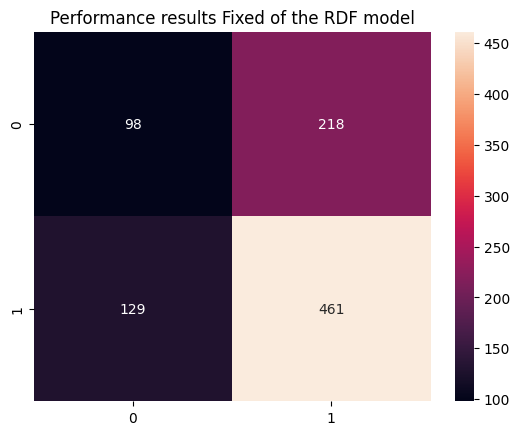


Feature Importance of the model



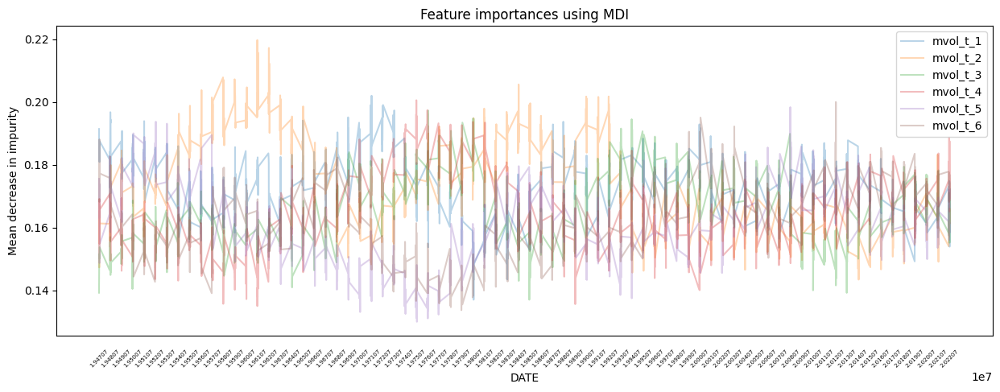

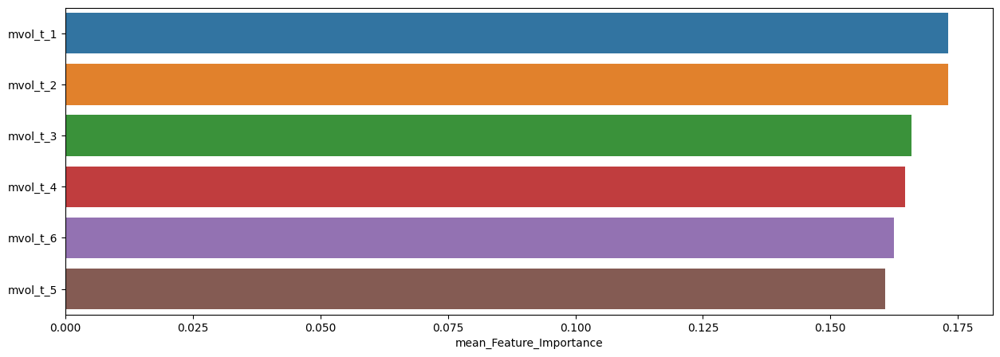

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,0.173165,0.202005,0.136958
mvol_t_2,0.173086,0.219746,0.143371
mvol_t_3,0.165921,0.197243,0.136955
mvol_t_4,0.164717,0.200570,0.134941
mvol_t_6,0.162401,0.200007,0.133638
mvol_t_5,0.160709,0.198354,0.129939


In [22]:
Fixed_RDF_Result = Roling_Windows(data=dynmom, # 사용할 데이터
                                  window_size=240, # window size (훈련 데이터 셋 크기)
                                  method='Fixed', # Rolling Winodw Method (Fixed or Expanding)
                                  model=RDF, # 사용할 모델
                                  model_name='RDF', # 사용한 모델 명
                                  plot=True, # 모델 성능 지표 시각화 여부
                                  plot_feature=True) # 모델의 변수 중요도 시각화 여부


**************************************************

DATE : 19470731 ~ 19660429

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.38      0.28      0.32        75
         1.0       0.68      0.77      0.72       151

    accuracy                           0.61       226
   macro avg       0.53      0.52      0.52       226
weighted avg       0.58      0.61      0.59       226


accuracy : 0.6061946902654868

precision : 0.6823529411764706

recall : 0.7682119205298014

F1-Score : 0.7227414330218068



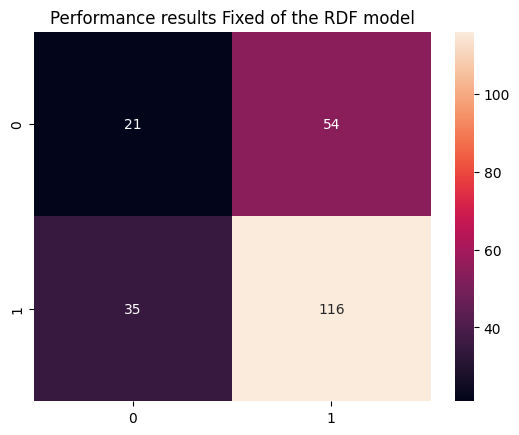


Feature Importance of the model



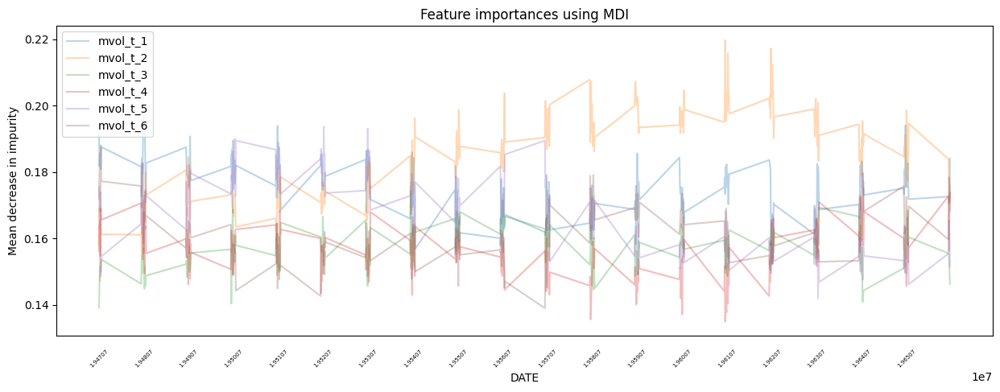

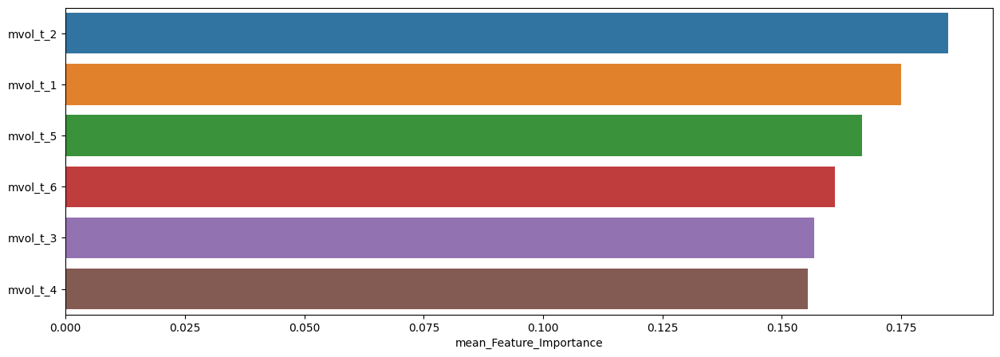

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_2,0.184890,0.219746,0.147257
mvol_t_1,0.174907,0.196753,0.155329
mvol_t_5,0.166804,0.193726,0.141920
mvol_t_6,0.161182,0.188086,0.139036
mvol_t_3,0.156752,0.174243,0.139182
mvol_t_4,0.155466,0.179689,0.134941



**************************************************

DATE : 19660531 ~ 19850228

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.55      0.40      0.46        75
         1.0       0.74      0.83      0.78       151

    accuracy                           0.69       226
   macro avg       0.64      0.62      0.62       226
weighted avg       0.67      0.69      0.68       226


accuracy : 0.6902654867256637

precision : 0.7368421052631579

recall : 0.8344370860927153

F1-Score : 0.7826086956521741



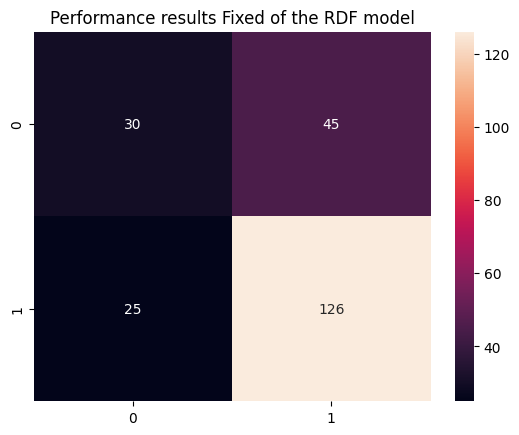


Feature Importance of the model



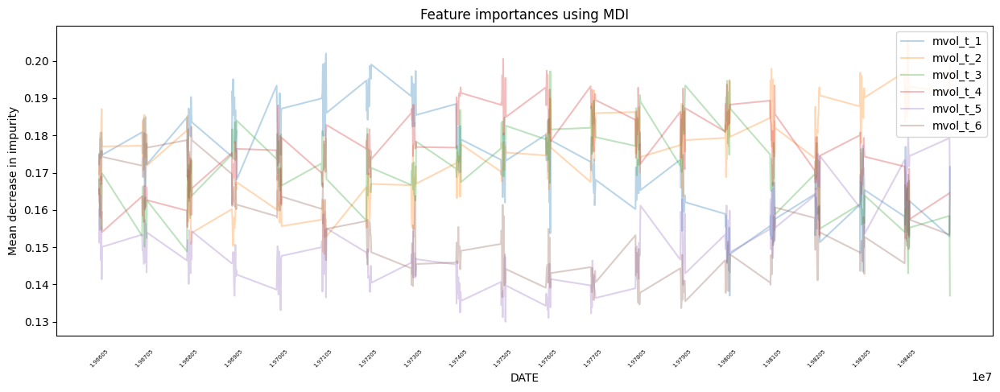

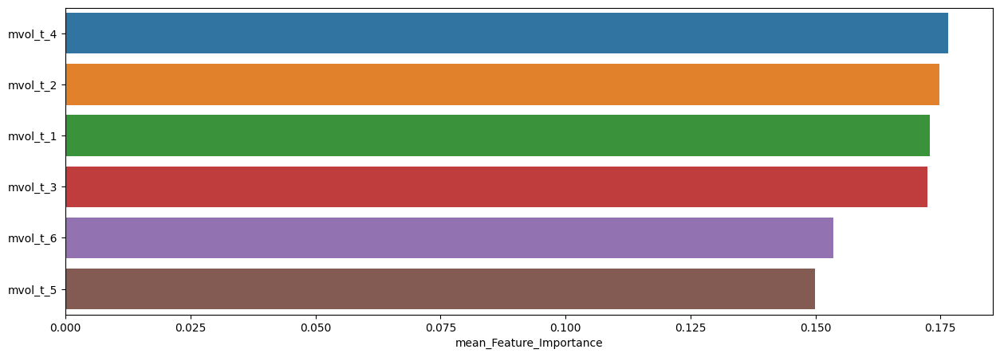

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_4,0.176594,0.200570,0.152308
mvol_t_2,0.174716,0.205596,0.148204
mvol_t_1,0.172875,0.202005,0.136958
mvol_t_3,0.172359,0.197243,0.136955
mvol_t_6,0.153526,0.182306,0.133638
mvol_t_5,0.149930,0.179556,0.129939



**************************************************

DATE : 19850329 ~ 20031231

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.37      0.29      0.32        70
         1.0       0.71      0.78      0.74       156

    accuracy                           0.63       226
   macro avg       0.54      0.53      0.53       226
weighted avg       0.60      0.63      0.61       226


accuracy : 0.6283185840707964

precision : 0.7093023255813954

recall : 0.782051282051282

F1-Score : 0.7439024390243903



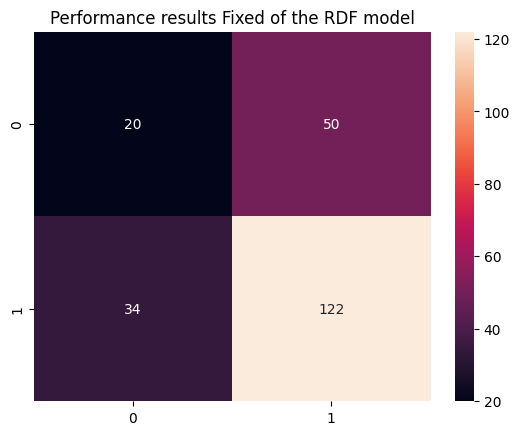


Feature Importance of the model



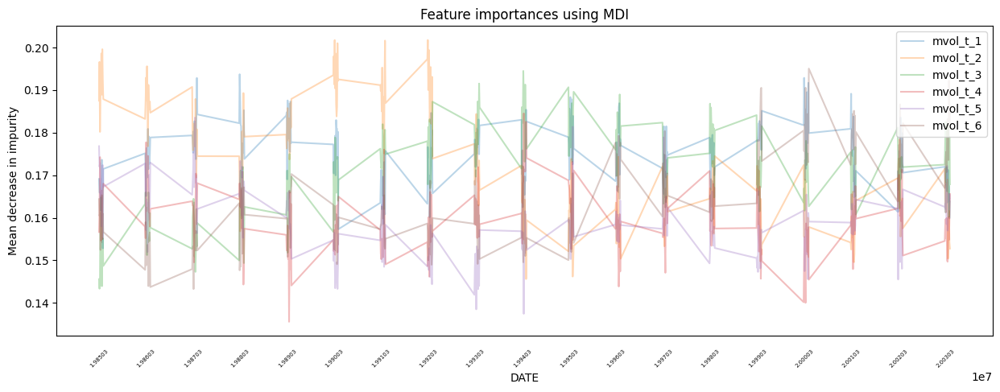

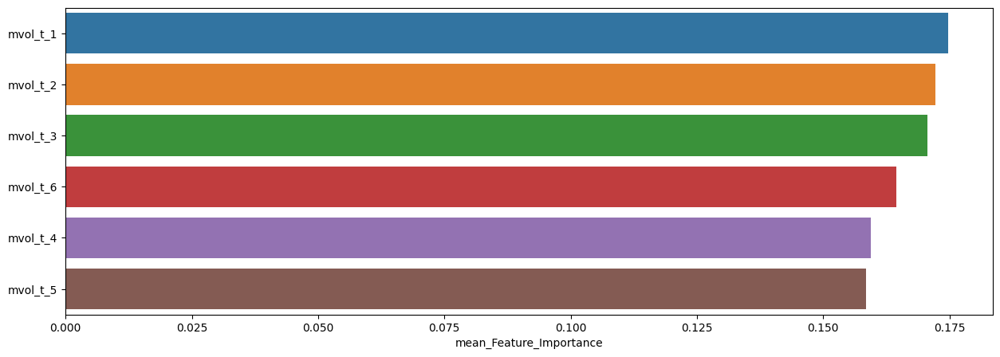

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,0.174790,0.193714,0.152806
mvol_t_2,0.172251,0.201759,0.145598
mvol_t_3,0.170686,0.194500,0.143323
mvol_t_6,0.164468,0.195048,0.143242
mvol_t_4,0.159343,0.184524,0.135553
mvol_t_5,0.158461,0.183537,0.137425



**************************************************

DATE : 20040130 ~ 20221230

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.44      0.28      0.34        96
         1.0       0.58      0.73      0.65       132

    accuracy                           0.54       228
   macro avg       0.51      0.51      0.50       228
weighted avg       0.52      0.54      0.52       228


accuracy : 0.543859649122807

precision : 0.5843373493975904

recall : 0.7348484848484849

F1-Score : 0.6510067114093959



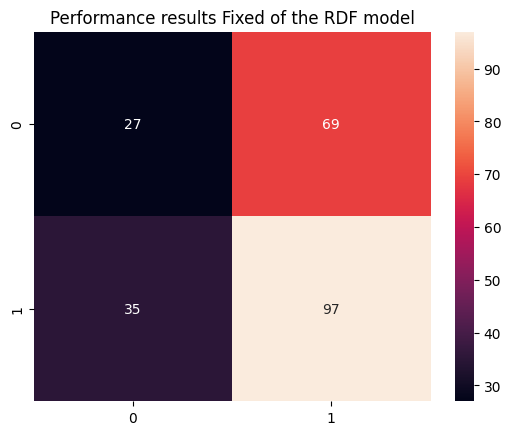


Feature Importance of the model



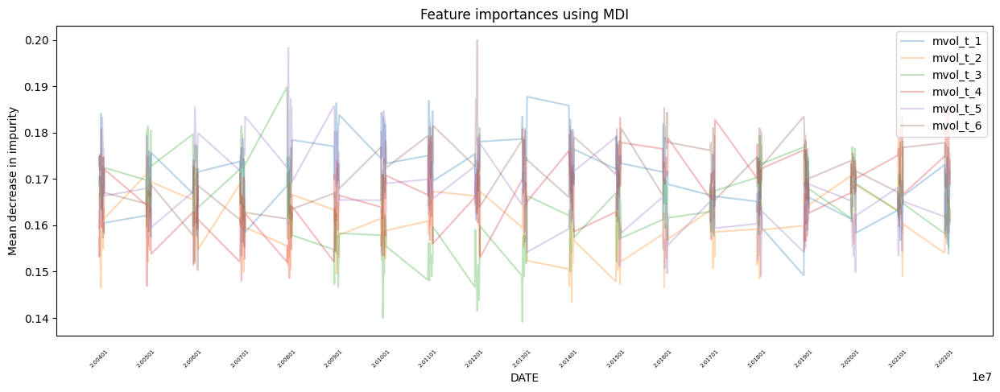

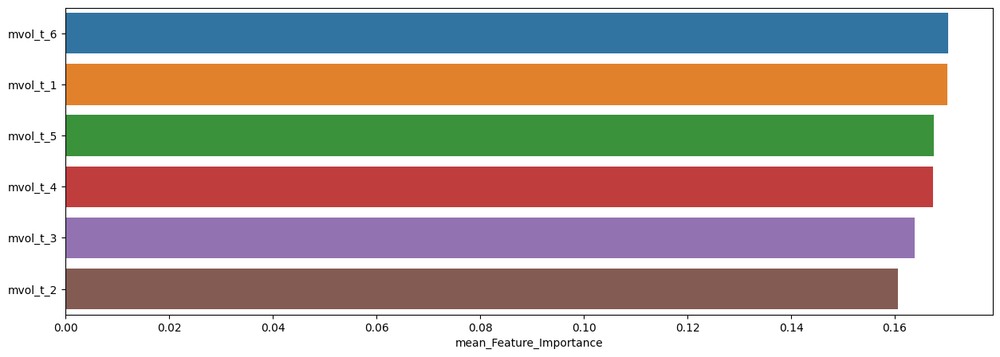

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_6,0.170359,0.200007,0.150303
mvol_t_1,0.170114,0.187790,0.149195
mvol_t_5,0.167582,0.198354,0.149100
mvol_t_4,0.167442,0.188686,0.146921
mvol_t_3,0.163905,0.189843,0.139162
mvol_t_2,0.160599,0.183260,0.143371


In [23]:
slice_feature_importance(Fixed_RDF_Result, # 모델 추론 결과 데이터
                         4, # 나눌 구간 수 (If None : 특정 구간 입력) 
                         'Fixed', # Rolling Windows Method
                         'RDF') # 모델 명


IQR 기준 WML 이상치 (Maximum 미만) 개수

Number of Outlier by IQR (Maximum) : 16
Maximum by IQR : 0.1670798809375
Max Outlier : 0.3301628157
Min Outlier : 0.1709176029

ACTUAL = PRED = 1



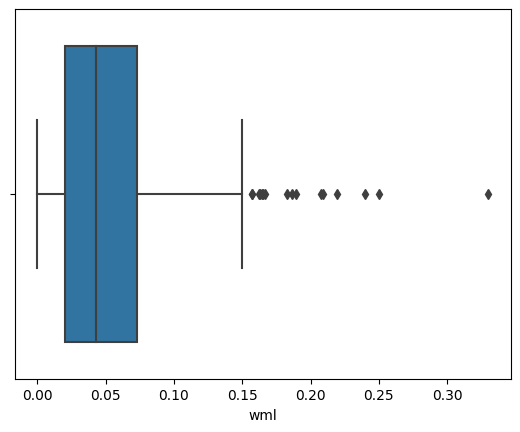

,count,mean,std,min,25%,50%,75%,max
wml,461.0,0.053194,0.044712,0.000007,0.020052,0.042914,0.072663,0.330163



--------------------------------------------------------------------------------


IQR 기준 WML 이상치 (Minimum 미만) 개수

Number of Outlier by IQR (Minimum) : 40
Minimun by IQR : -0.1267517369625
Max Outlier : -0.127277386
Min Outlier : -0.469903035

ACTUAL = PRED = 0



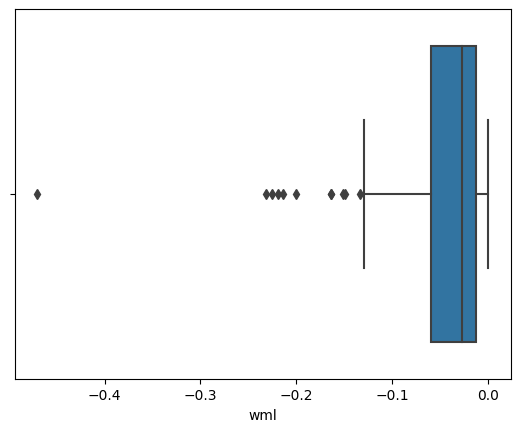

,count,mean,std,min,25%,50%,75%,max
wml,98.0,-0.053466,0.069913,-0.469903,-0.060183,-0.028053,-0.013277,-0.000132



--------------------------------------------------------------------------------


ACTUAL = 0 &  PRED = 1



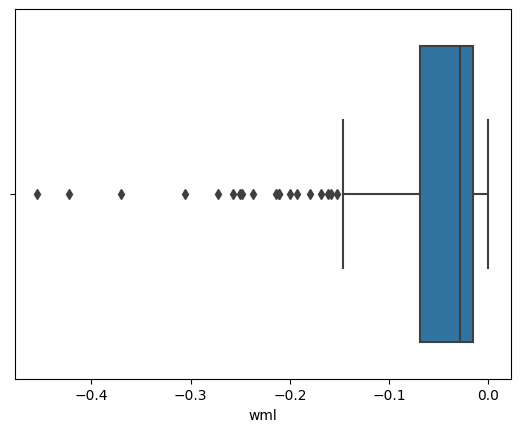

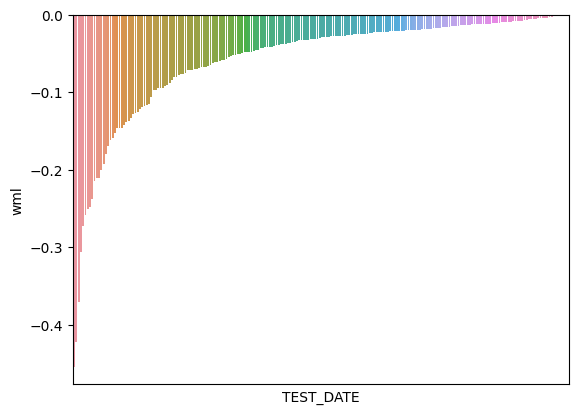

,count,mean,std,min,25%,50%,75%,max
wml,218.0,-0.05759,0.071944,-0.454349,-0.069333,-0.029177,-0.015527,-0.000183



--------------------------------------------------------------------------------


ACTUAL = 1 &  PRED = 0



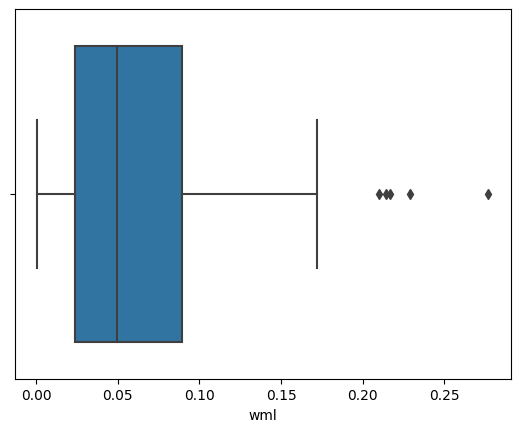

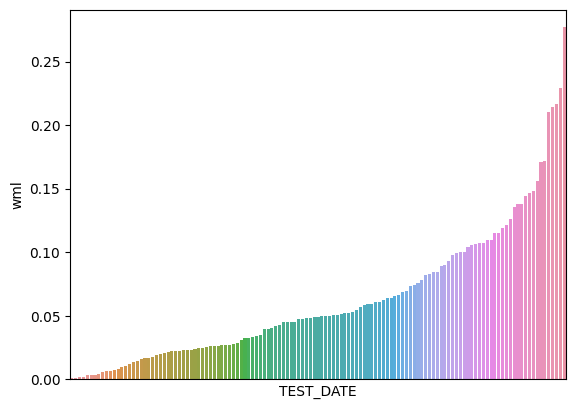

,count,mean,std,min,25%,50%,75%,max
wml,129.0,0.062598,0.05319,0.000805,0.023657,0.049462,0.089275,0.276912


In [24]:
RDF_A0_P1, RDF_A1_P0 = What_Pred(Fixed_RDF_Result, WML, 'RDF')

Sharpe Ratio : 0.66445

최근 누적 수익률

  2022년-12월 -> 18336.06
  2022년-11월 -> 18336.06
  2022년-10월 -> 18336.06
  2022년-09월 -> 16236.23
  2022년-08월 -> 16236.23

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2001년-09월 -> 62585.60
  2등 : 2002년-09월 -> 62448.98
  3등 : 2002년-07월 -> 54379.72
  4등 : 2002년-08월 -> 52804.26
  5등 : 2001년-08월 -> 51836.16
  6등 : 2002년-06월 -> 51559.21
  7등 : 2002년-10월 -> 50386.98
  8등 : 2009년-02월 -> 49690.46
  9등 : 2001년-10월 -> 46891.61
  10등 : 2002년-02월 -> 46255.41



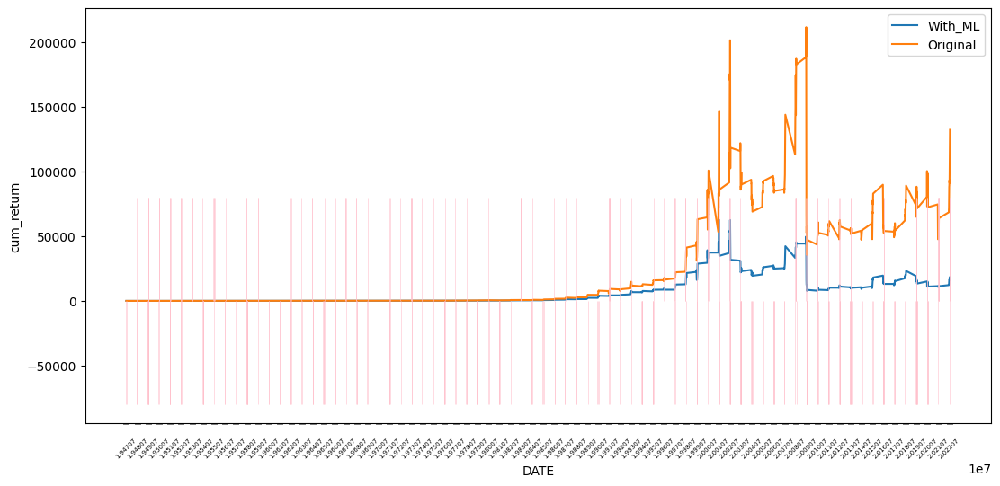

In [25]:
RDF_F_CUM_RETURN_static = cumm_return_by_dynamic(Fixed_RDF_Result,
                                                 WML,
                                                 'RDF_PRED_POS_WML',
                                                 RDF_A0_P1,
                                                 RDF_A1_P0,
                                                 plot=True)

Sharpe Ratio : 0.76052

최근 누적 수익률

  2022년-12월 -> 7260.90
  2022년-11월 -> 6918.69
  2022년-10월 -> 6844.95
  2022년-09월 -> 6336.79
  2022년-08월 -> 6140.40

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2009년-02월 -> 9139.45
  2등 : 2002년-09월 -> 8902.32
  3등 : 2008년-11월 -> 8587.04
  4등 : 2009년-01월 -> 8520.78
  5등 : 2008년-12월 -> 8395.97
  6등 : 2008년-10월 -> 7963.87
  7등 : 2008년-06월 -> 7956.88
  8등 : 2002년-07월 -> 7936.97
  9등 : 2002년-08월 -> 7792.08
  10등 : 2008년-09월 -> 7761.51



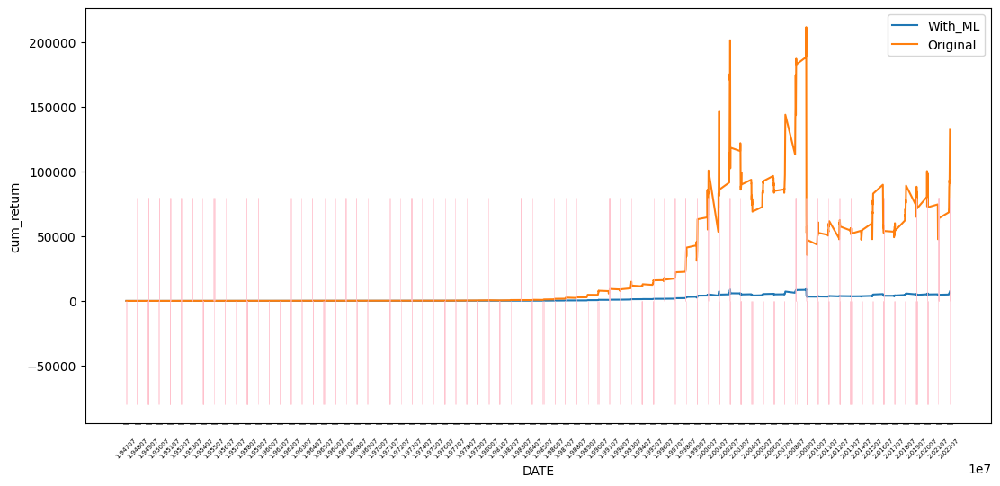

In [26]:
RDF_F_CUM_RETURN_dynamic = cumm_return_by_dynamic(Fixed_RDF_Result,
                                                 WML,
                                                 'RDF_PROB_POS_WML',
                                                 RDF_A0_P1,
                                                 RDF_A1_P0,
                                                 plot=True)

### Grdient Boosting

In [27]:
GBC_Param = {}
GBC = GradientBoostingClassifier(*GBC_Param, random_state=42)

**************************************************

GBC Model의 Rolling Fixed Window를 실행합니다

설정된 Model의 하이퍼파리미터 : 

   ccp_alpha : 0.0
   criterion : friedman_mse
   init : None
   learning_rate : 0.1
   loss : log_loss
   max_depth : 3
   max_features : None
   max_leaf_nodes : None
   min_impurity_decrease : 0.0
   min_samples_leaf : 1
   min_samples_split : 2
   min_weight_fraction_leaf : 0.0
   n_estimators : 100
   n_iter_no_change : None
   random_state : 42
   subsample : 1.0
   tol : 0.0001
   validation_fraction : 0.1
   verbose : 0
   warm_start : False

**************************************************


  0%|          | 0/906 [00:00<?, ?it/s]


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.40      0.34      0.37       316
         1.0       0.67      0.73      0.70       590

    accuracy                           0.59       906
   macro avg       0.54      0.53      0.53       906
weighted avg       0.58      0.59      0.59       906


accuracy : 0.5949227373068433

precision : 0.6734059097978227

recall : 0.7338983050847457

F1-Score : 0.7023519870235198



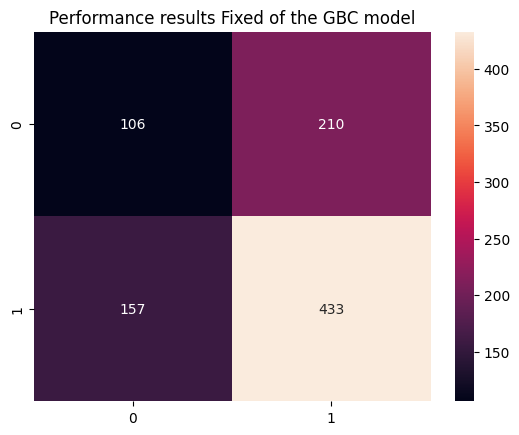


Feature Importance of the model



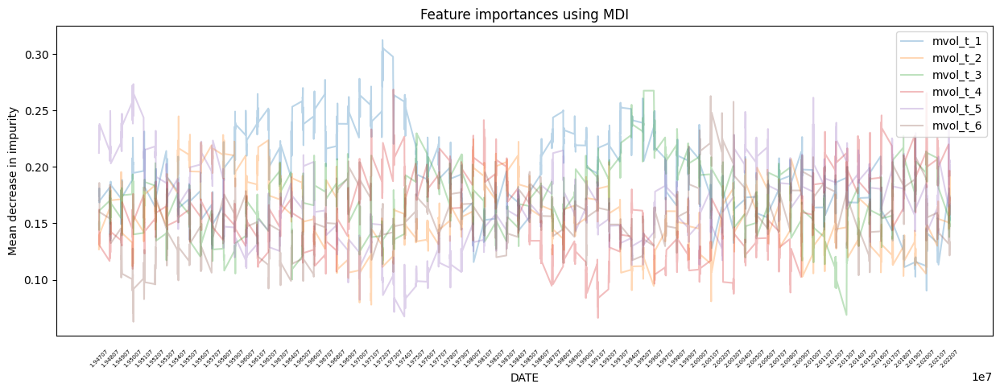

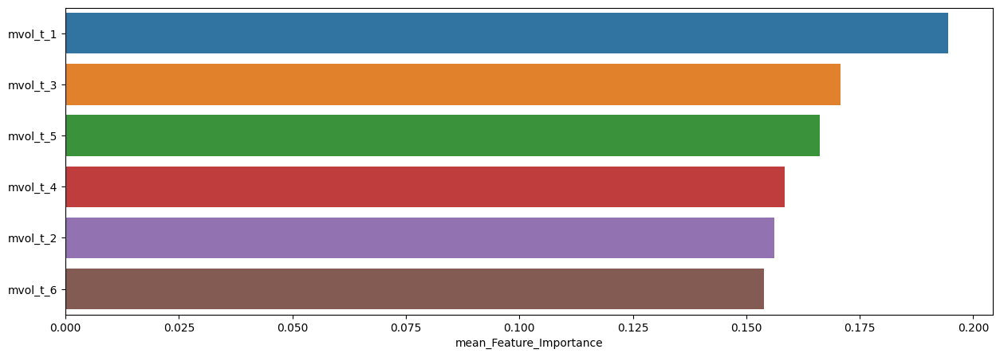

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,0.194547,0.312368,0.090322
mvol_t_3,0.170743,0.267513,0.068794
mvol_t_5,0.166171,0.273351,0.067385
mvol_t_4,0.158374,0.268492,0.066160
mvol_t_2,0.156231,0.244776,0.077857
mvol_t_6,0.153933,0.262758,0.062744


In [28]:
Fixed_GBC_Result = Roling_Windows(data=dynmom, # 사용할 데이터
                                  window_size=240, # window size (훈련 데이터 셋 크기)
                                  method='Fixed', # Rolling Winodw Method (Fixed or Expanding)
                                  model=GBC, # 사용할 모델
                                  model_name='GBC', # 사용한 모델 명
                                  plot=True, # 모델 성능 지표 시각화 여부
                                  plot_feature=True) # 모델의 변수 중요도 시각화 여부


**************************************************

DATE : 19470731 ~ 19660429

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.34      0.29      0.31        75
         1.0       0.67      0.72      0.69       151

    accuracy                           0.58       226
   macro avg       0.50      0.50      0.50       226
weighted avg       0.56      0.58      0.57       226


accuracy : 0.5752212389380531

precision : 0.6708074534161491

recall : 0.7152317880794702

F1-Score : 0.6923076923076923



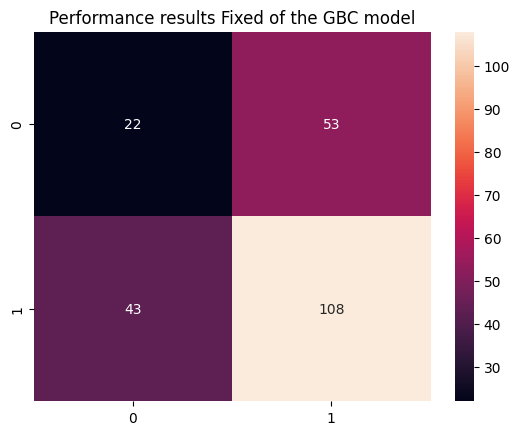


Feature Importance of the model



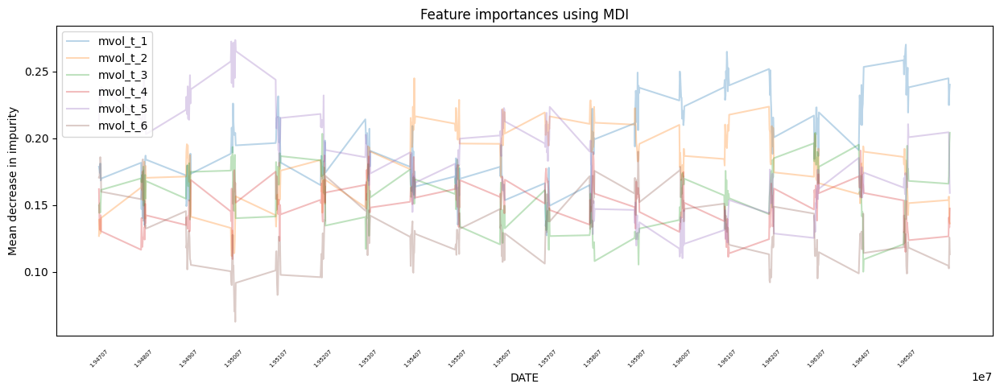

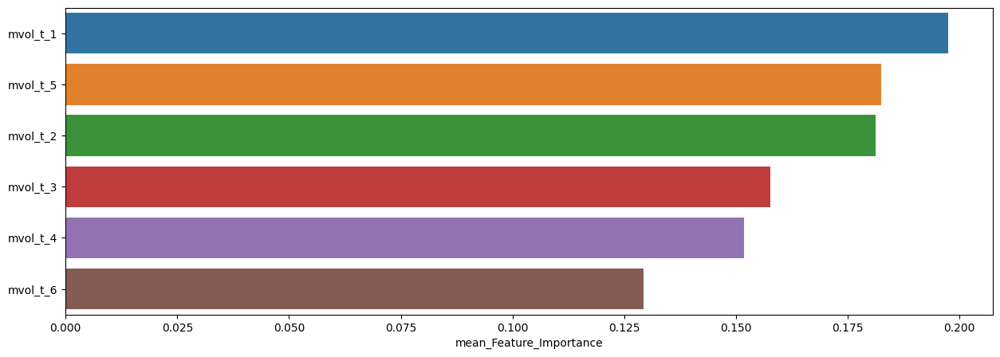

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,0.197560,0.269933,0.127349
mvol_t_5,0.182499,0.273351,0.110262
mvol_t_2,0.181194,0.244776,0.111848
mvol_t_3,0.157654,0.204066,0.100159
mvol_t_4,0.151757,0.190775,0.109617
mvol_t_6,0.129336,0.189937,0.062744



**************************************************

DATE : 19660531 ~ 19850228

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.45      0.45      0.45        75
         1.0       0.73      0.73      0.73       151

    accuracy                           0.64       226
   macro avg       0.59      0.59      0.59       226
weighted avg       0.64      0.64      0.64       226


accuracy : 0.6371681415929203

precision : 0.7284768211920529

recall : 0.7284768211920529

F1-Score : 0.7284768211920529



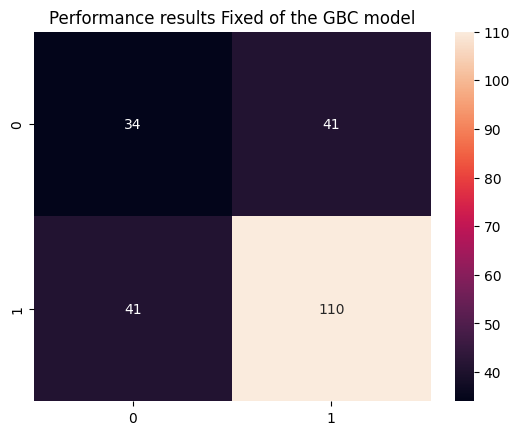


Feature Importance of the model



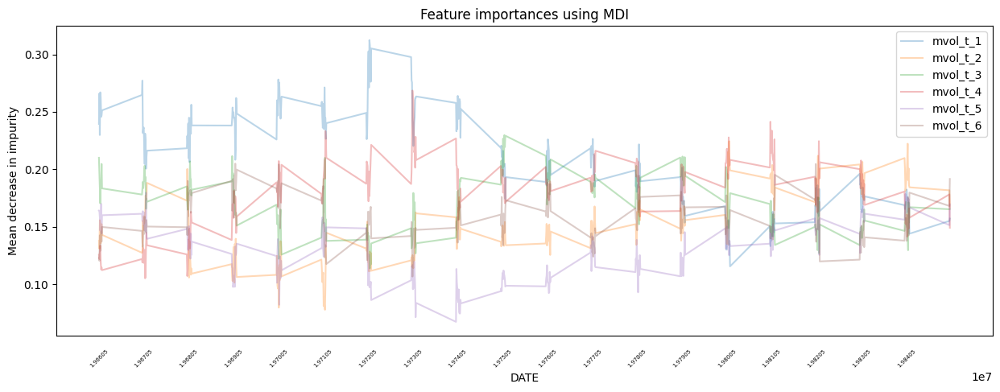

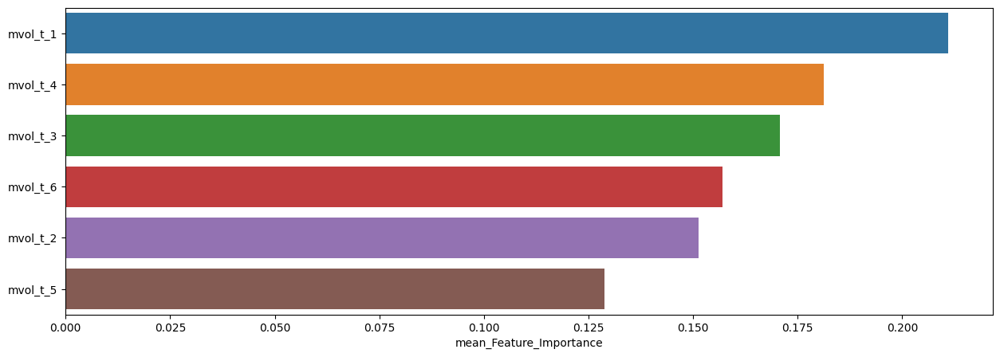

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,0.211031,0.312368,0.115630
mvol_t_4,0.181254,0.268492,0.105266
mvol_t_3,0.170722,0.229788,0.113871
mvol_t_6,0.157001,0.204955,0.106784
mvol_t_2,0.151212,0.224443,0.077857
mvol_t_5,0.128782,0.179759,0.067385



**************************************************

DATE : 19850329 ~ 20031231

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.41      0.34      0.37        70
         1.0       0.72      0.78      0.75       156

    accuracy                           0.64       226
   macro avg       0.57      0.56      0.56       226
weighted avg       0.63      0.64      0.63       226


accuracy : 0.6415929203539823

precision : 0.7245508982035929

recall : 0.7756410256410257

F1-Score : 0.7492260061919503



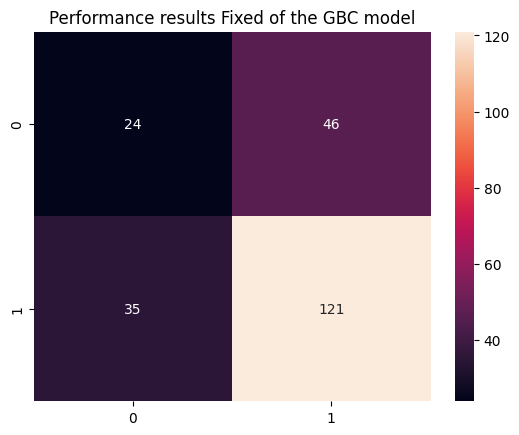


Feature Importance of the model



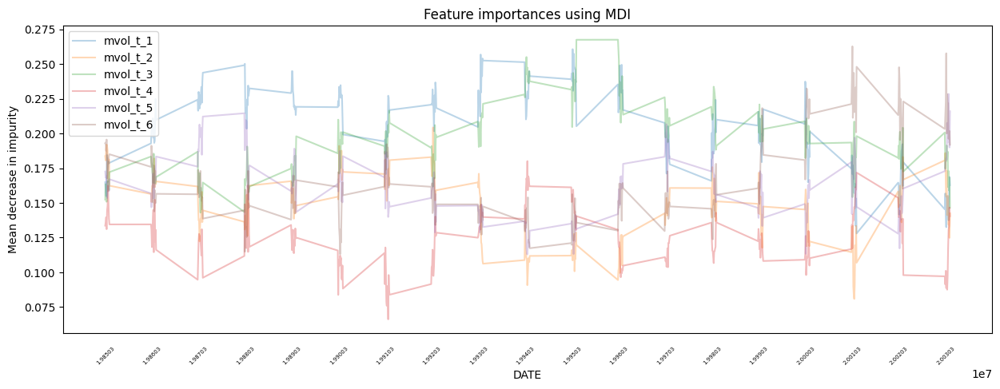

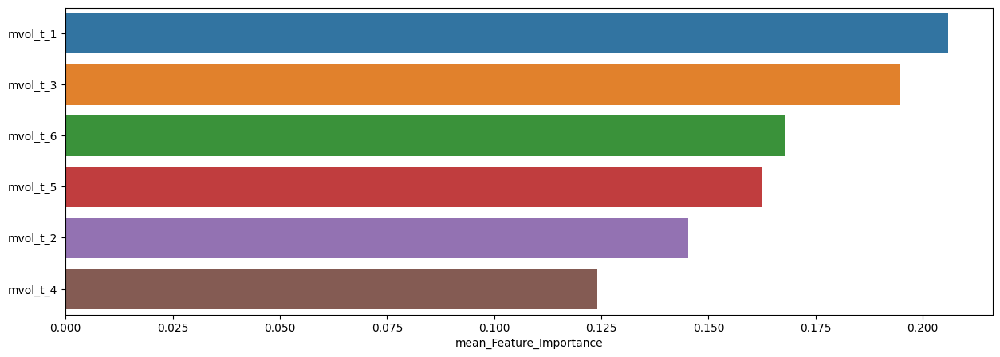

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,0.205978,0.260704,0.127983
mvol_t_3,0.194471,0.267513,0.142982
mvol_t_6,0.167737,0.262758,0.112995
mvol_t_5,0.162427,0.228444,0.112911
mvol_t_2,0.145349,0.204338,0.080848
mvol_t_4,0.124037,0.180092,0.066160



**************************************************

DATE : 20040130 ~ 20221230

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.41      0.27      0.33        96
         1.0       0.57      0.71      0.64       132

    accuracy                           0.53       228
   macro avg       0.49      0.49      0.48       228
weighted avg       0.50      0.53      0.50       228


accuracy : 0.5263157894736842

precision : 0.573170731707317

recall : 0.7121212121212122

F1-Score : 0.6351351351351352



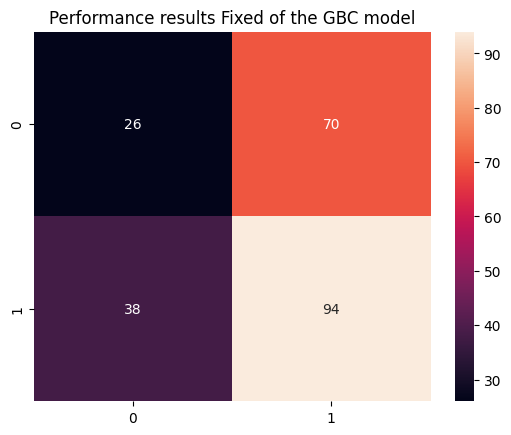


Feature Importance of the model



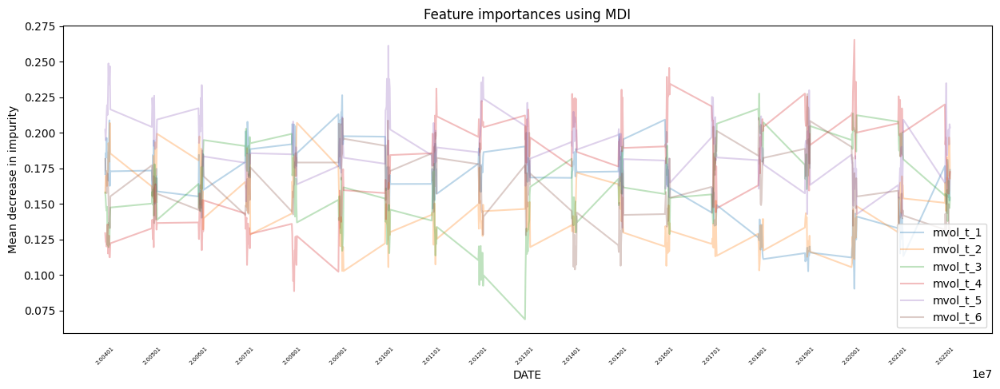

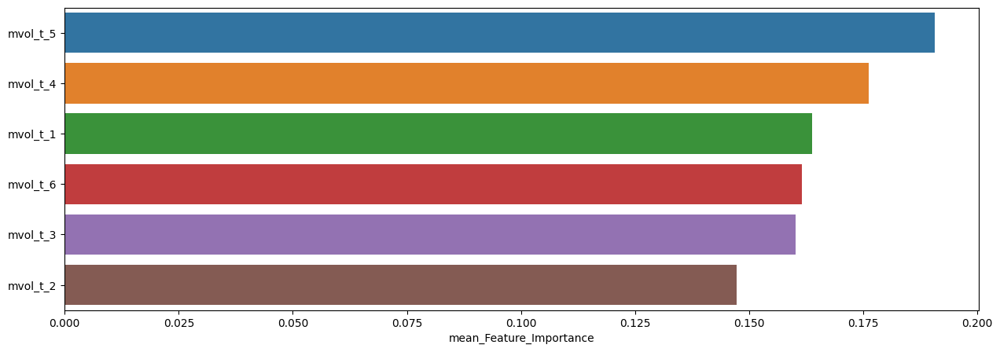

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_5,0.190758,0.261324,0.133207
mvol_t_4,0.176291,0.265405,0.088631
mvol_t_1,0.163891,0.226457,0.090322
mvol_t_6,0.161593,0.227274,0.103902
mvol_t_3,0.160217,0.227616,0.068794
mvol_t_2,0.147250,0.207030,0.102769


In [29]:
slice_feature_importance(Fixed_GBC_Result, # 모델 추론 결과 데이터
                         4, # 나눌 구간 수 (If None : 특정 구간 입력) 
                         'Fixed', # Rolling Windows Method
                         'GBC') # 모델 명


IQR 기준 WML 이상치 (Maximum 미만) 개수

Number of Outlier by IQR (Maximum) : 16
Maximum by IQR : 0.1670798809375
Max Outlier : 0.3301628157
Min Outlier : 0.1709176029

ACTUAL = PRED = 1



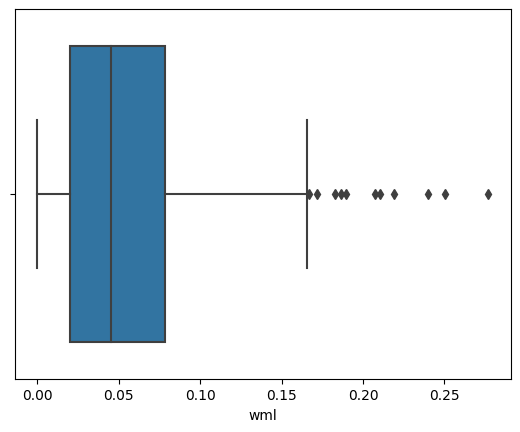

,count,mean,std,min,25%,50%,75%,max
wml,433.0,0.054659,0.045413,0.000007,0.020052,0.044931,0.0782,0.276912



--------------------------------------------------------------------------------


IQR 기준 WML 이상치 (Minimum 미만) 개수

Number of Outlier by IQR (Minimum) : 40
Minimun by IQR : -0.1267517369625
Max Outlier : -0.127277386
Min Outlier : -0.469903035

ACTUAL = PRED = 0



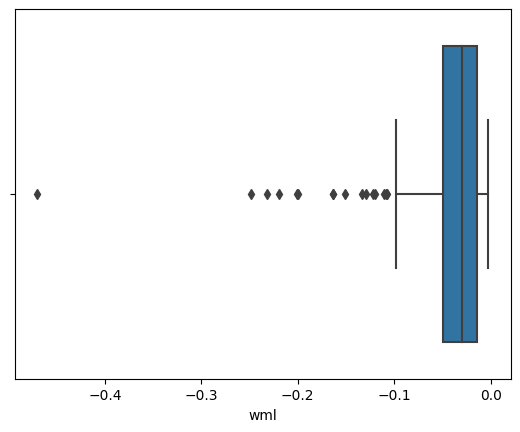

,count,mean,std,min,25%,50%,75%,max
wml,106.0,-0.051226,0.067131,-0.469903,-0.04931,-0.029292,-0.013875,-0.002394



--------------------------------------------------------------------------------


ACTUAL = 0 &  PRED = 1



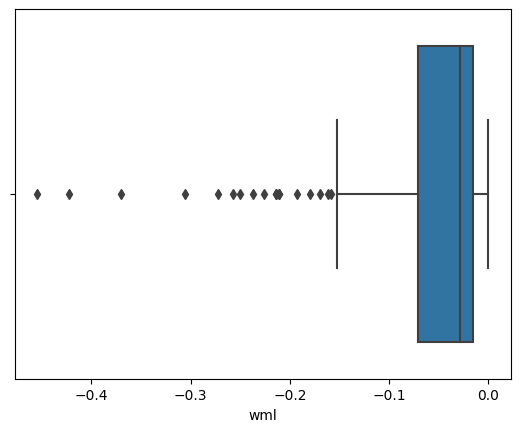

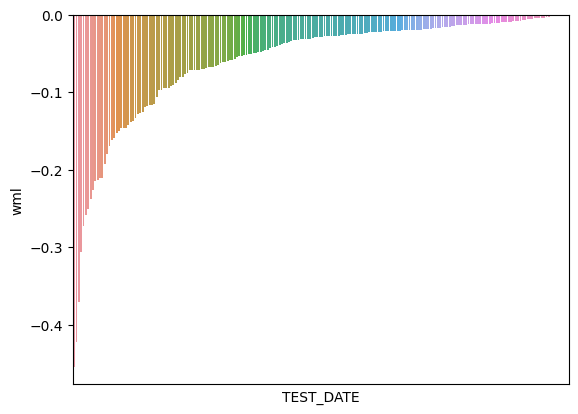

,count,mean,std,min,25%,50%,75%,max
wml,210.0,-0.058878,0.073241,-0.454349,-0.07091,-0.028293,-0.015527,-0.000132



--------------------------------------------------------------------------------


ACTUAL = 1 &  PRED = 0



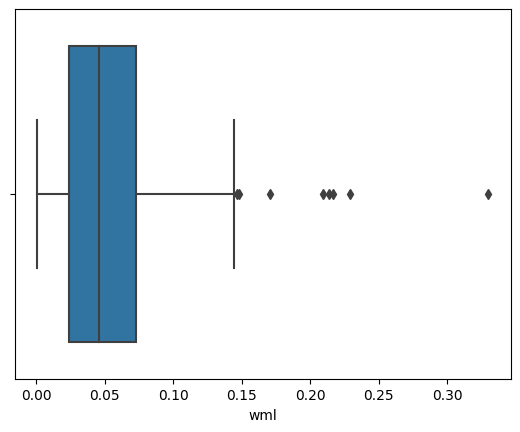

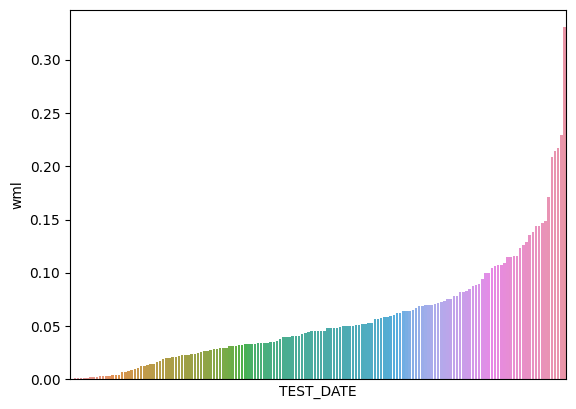

,count,mean,std,min,25%,50%,75%,max
wml,157.0,0.05688,0.050585,0.000692,0.023657,0.045364,0.072439,0.330163


In [30]:
GBC_A0_P1, GBC_A1_P0 = What_Pred(Fixed_GBC_Result, WML, 'GBC')

Sharpe Ratio : 0.66173

최근 누적 수익률

  2022년-12월 -> 9582.61
  2022년-11월 -> 8633.67
  2022년-10월 -> 8633.67
  2022년-09월 -> 7644.89
  2022년-08월 -> 7644.89

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2002년-09월 -> 34954.90
  2등 : 2008년-11월 -> 34299.62
  3등 : 2009년-02월 -> 33487.76
  4등 : 2009년-01월 -> 33487.76
  5등 : 2008년-12월 -> 33487.76
  6등 : 2008년-10월 -> 31278.30
  7등 : 2002년-07월 -> 30438.19
  8등 : 2002년-08월 -> 29556.34
  9등 : 2008년-09월 -> 29528.68
  10등 : 2001년-09월 -> 28946.11



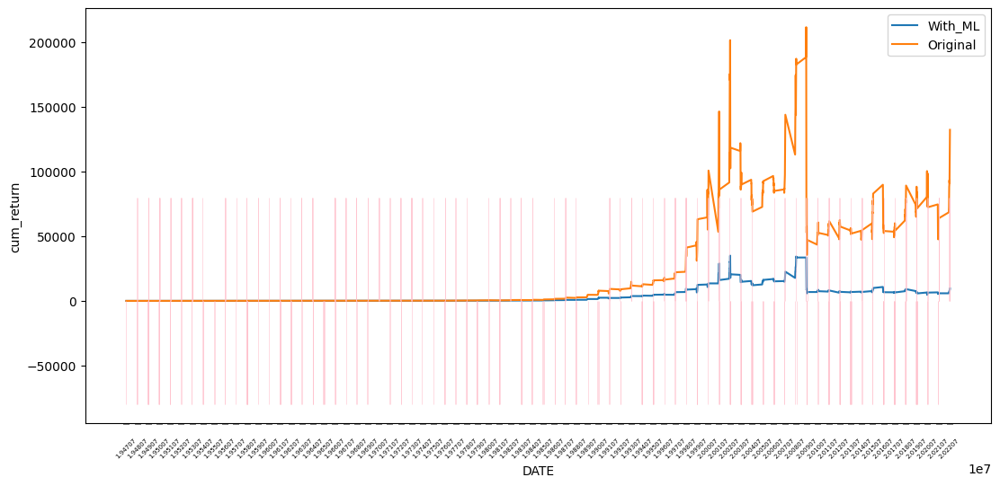

In [31]:
GBC_F_CUM_RETURN_static = cumm_return_by_dynamic(Fixed_GBC_Result,
                                                 WML,
                                                 'GBC_PRED_POS_WML',
                                                 GBC_A0_P1,
                                                 GBC_A1_P0,
                                                 plot=True)

Sharpe Ratio : 0.72183

최근 누적 수익률

  2022년-12월 -> 7746.29
  2022년-11월 -> 7336.01
  2022년-10월 -> 7276.53
  2022년-09월 -> 6631.80
  2022년-08월 -> 6413.66

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2002년-09월 -> 15434.71
  2등 : 2009년-02월 -> 14939.70
  3등 : 2008년-11월 -> 14890.31
  4등 : 2009년-01월 -> 14576.11
  5등 : 2008년-12월 -> 14542.38
  6등 : 2008년-10월 -> 13674.26
  7등 : 2002년-07월 -> 13429.37
  8등 : 2008년-09월 -> 13214.38
  9등 : 2002년-08월 -> 13140.63
  10등 : 2002년-06월 -> 12944.42



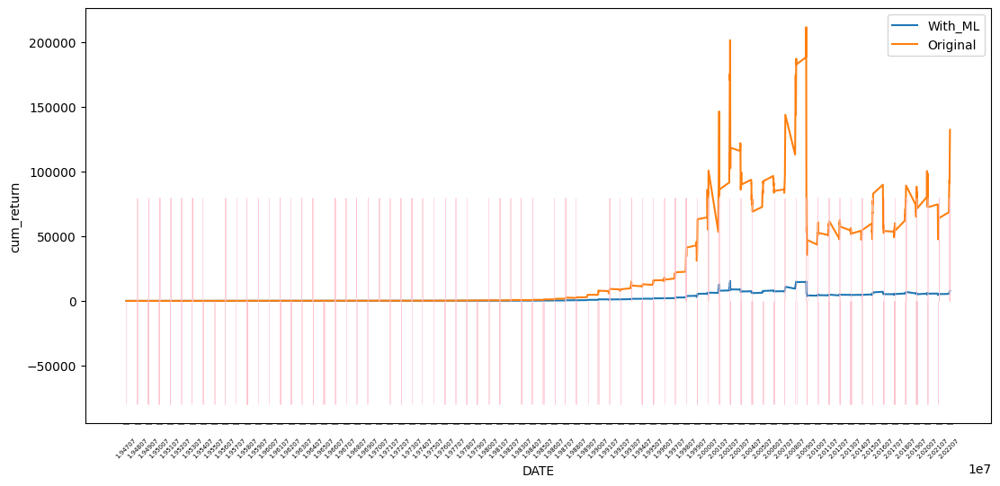

In [32]:
GBC_F_CUM_RETURN_dynamic = cumm_return_by_dynamic(Fixed_GBC_Result,
                                                 WML,
                                                 'GBC_PROB_POS_WML',
                                                 GBC_A0_P1,
                                                 GBC_A1_P0,
                                                 plot=True)

### XGB

In [33]:
XGB_Param = {}
XGB = XGBClassifier(**XGB_Param, random_state=42)

**************************************************

XGB Model의 Rolling Fixed Window를 실행합니다

설정된 Model의 하이퍼파리미터 : 

   objective : binary:logistic
   use_label_encoder : None
   base_score : None
   booster : None
   callbacks : None
   colsample_bylevel : None
   colsample_bynode : None
   colsample_bytree : None
   early_stopping_rounds : None
   enable_categorical : False
   eval_metric : None
   feature_types : None
   gamma : None
   gpu_id : None
   grow_policy : None
   importance_type : None
   interaction_constraints : None
   learning_rate : None
   max_bin : None
   max_cat_threshold : None
   max_cat_to_onehot : None
   max_delta_step : None
   max_depth : None
   max_leaves : None
   min_child_weight : None
   missing : nan
   monotone_constraints : None
   n_estimators : 100
   n_jobs : None
   num_parallel_tree : None
   predictor : None
   random_state : 42
   reg_alpha : None
   reg_lambda : None
   sampling_method : None
   scale_pos_weight : None
   subsample : None
 

  0%|          | 0/906 [00:00<?, ?it/s]


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.42      0.37      0.39       316
         1.0       0.68      0.72      0.70       590

    accuracy                           0.60       906
   macro avg       0.55      0.55      0.55       906
weighted avg       0.59      0.60      0.59       906


accuracy : 0.6004415011037527

precision : 0.6826923076923077

recall : 0.7220338983050848

F1-Score : 0.7018121911037891



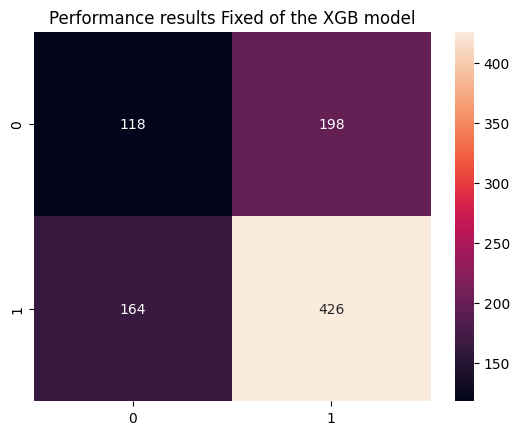


Feature Importance of the model



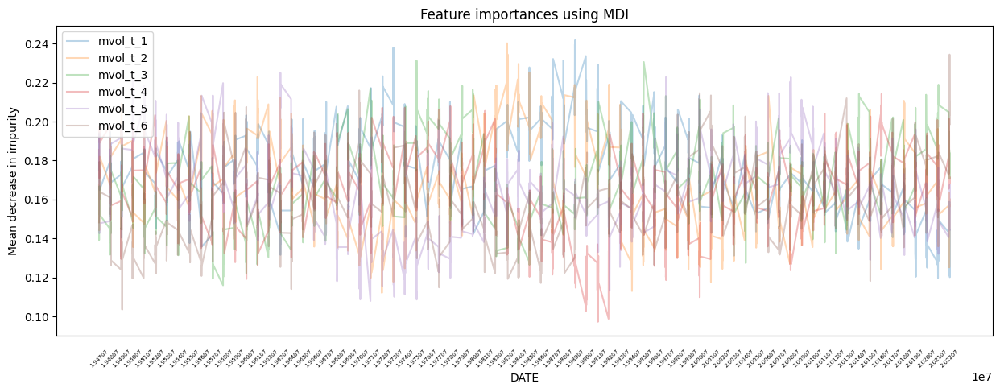

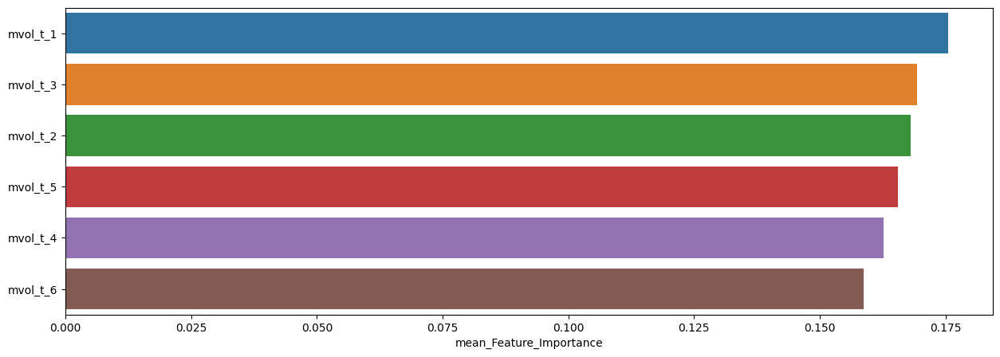

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,0.175610,0.241810,0.119755
mvol_t_3,0.169369,0.231247,0.115960
mvol_t_2,0.168143,0.240176,0.112069
mvol_t_5,0.165483,0.224989,0.107918
mvol_t_4,0.162673,0.214206,0.097268
mvol_t_6,0.158722,0.234370,0.103505


In [34]:
Fixed_XGB_Result = Roling_Windows(data=dynmom, # 사용할 데이터
                                  window_size=240, # window size (훈련 데이터 셋 크기)
                                  method='Fixed', # Rolling Winodw Method (Fixed or Expanding)
                                  model=XGB, # 사용할 모델
                                  model_name='XGB', # 사용한 모델 명
                                  plot=True, # 모델 성능 지표 시각화 여부
                                  plot_feature=True) # 모델의 변수 중요도 시각화 여부


**************************************************

DATE : 19470731 ~ 19660429

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.36      0.32      0.34        75
         1.0       0.68      0.72      0.70       151

    accuracy                           0.59       226
   macro avg       0.52      0.52      0.52       226
weighted avg       0.58      0.59      0.58       226


accuracy : 0.588495575221239

precision : 0.68125

recall : 0.7218543046357616

F1-Score : 0.7009646302250805



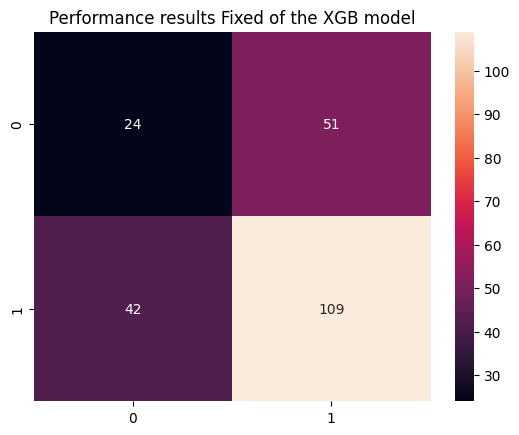


Feature Importance of the model



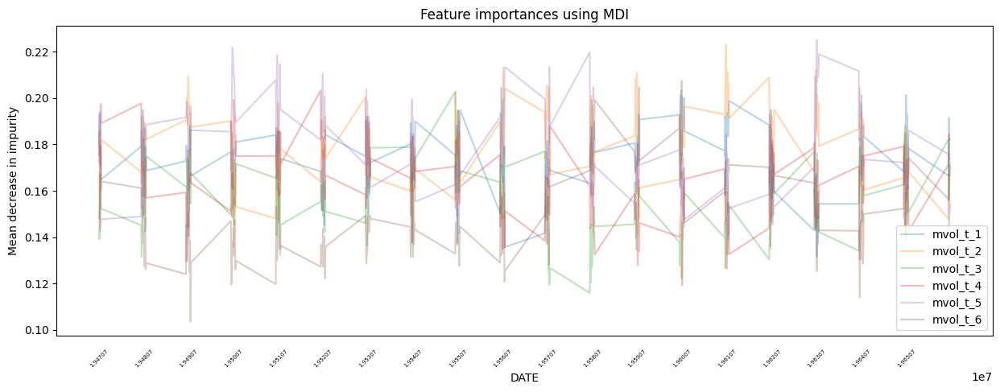

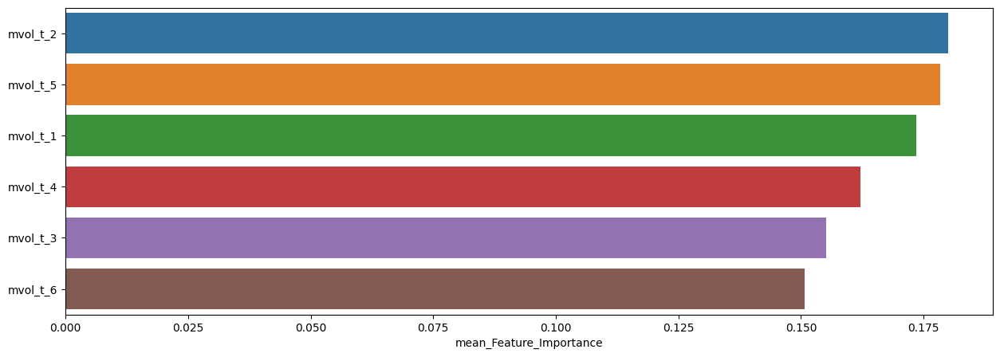

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_2,0.180087,0.222969,0.135566
mvol_t_5,0.178425,0.224989,0.138831
mvol_t_1,0.173561,0.204312,0.131575
mvol_t_4,0.162096,0.203263,0.119184
mvol_t_3,0.155155,0.202664,0.115960
mvol_t_6,0.150676,0.207471,0.103505



**************************************************

DATE : 19660531 ~ 19850228

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.45      0.43      0.44        75
         1.0       0.72      0.74      0.73       151

    accuracy                           0.64       226
   macro avg       0.59      0.58      0.59       226
weighted avg       0.63      0.64      0.63       226


accuracy : 0.6371681415929203

precision : 0.7225806451612903

recall : 0.7417218543046358

F1-Score : 0.7320261437908497



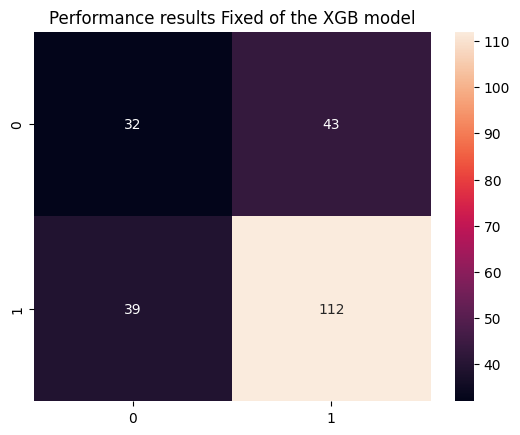


Feature Importance of the model



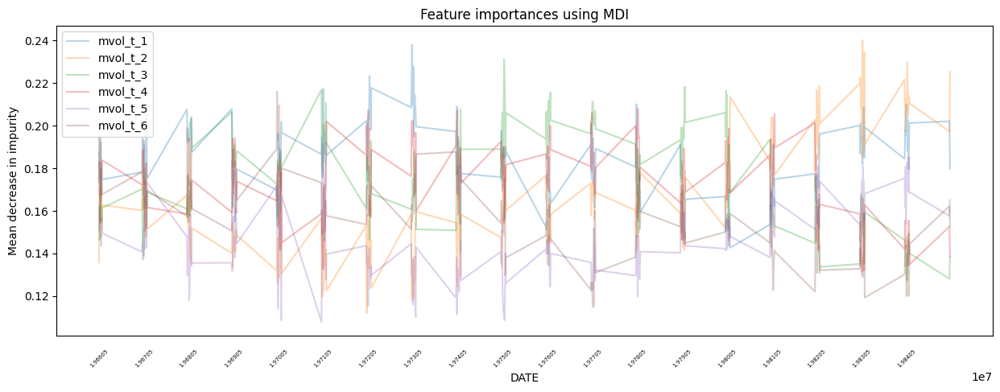

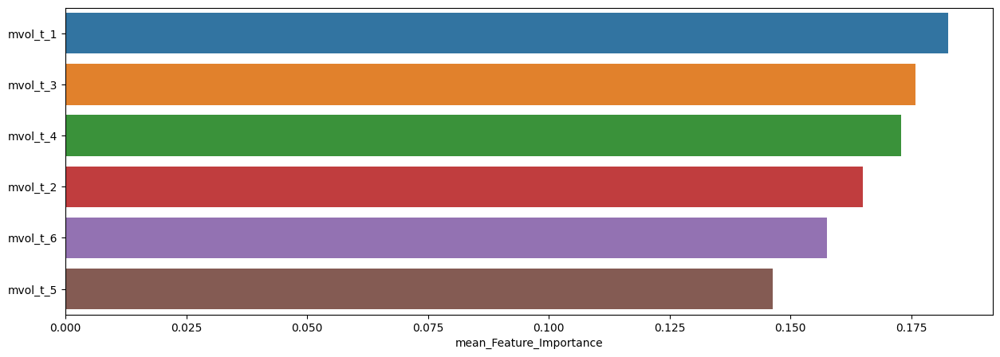

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,0.182681,0.237910,0.140746
mvol_t_3,0.175824,0.231247,0.127396
mvol_t_4,0.172819,0.207939,0.131679
mvol_t_2,0.164945,0.240176,0.112069
mvol_t_6,0.157484,0.215946,0.114871
mvol_t_5,0.146247,0.191804,0.107918



**************************************************

DATE : 19850329 ~ 20031231

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.44      0.40      0.42        70
         1.0       0.74      0.78      0.76       156

    accuracy                           0.66       226
   macro avg       0.59      0.59      0.59       226
weighted avg       0.65      0.66      0.65       226


accuracy : 0.6592920353982301

precision : 0.7423312883435583

recall : 0.7756410256410257

F1-Score : 0.7586206896551725



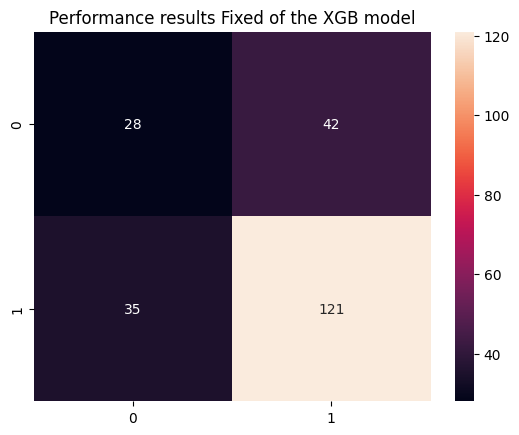


Feature Importance of the model



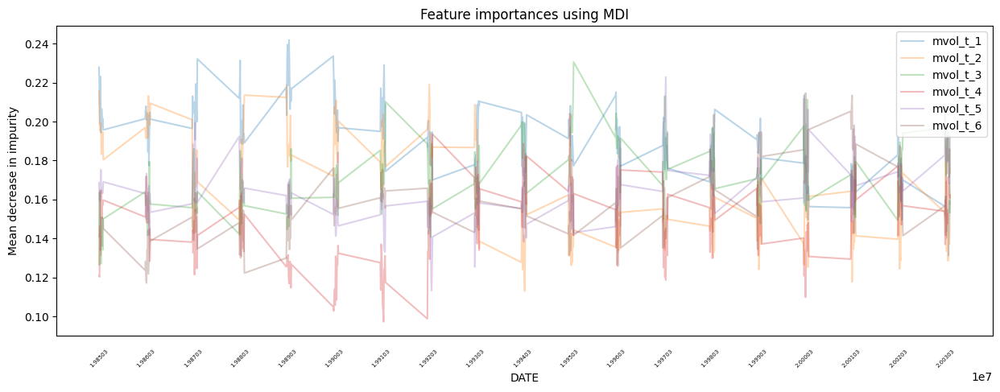

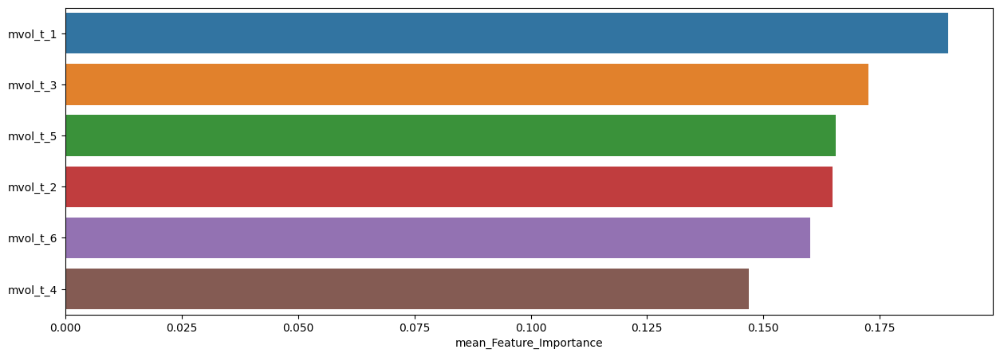

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,0.189814,0.241810,0.131197
mvol_t_3,0.172603,0.230548,0.126455
mvol_t_5,0.165652,0.222792,0.113243
mvol_t_2,0.164850,0.218980,0.113010
mvol_t_6,0.160139,0.214609,0.117141
mvol_t_4,0.146941,0.204033,0.097268



**************************************************

DATE : 20040130 ~ 20221230

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.41      0.35      0.38        96
         1.0       0.58      0.64      0.60       132

    accuracy                           0.52       228
   macro avg       0.49      0.50      0.49       228
weighted avg       0.51      0.52      0.51       228


accuracy : 0.5175438596491229

precision : 0.5753424657534246

recall : 0.6363636363636364

F1-Score : 0.60431654676259



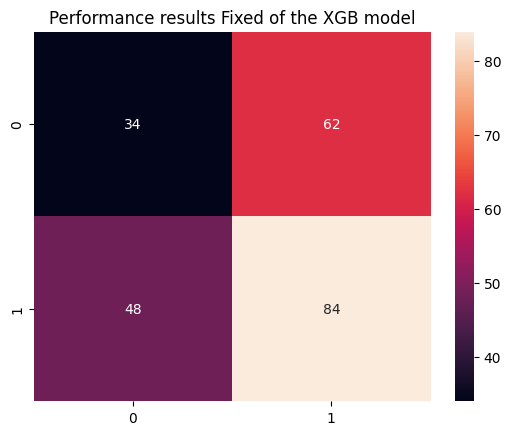


Feature Importance of the model



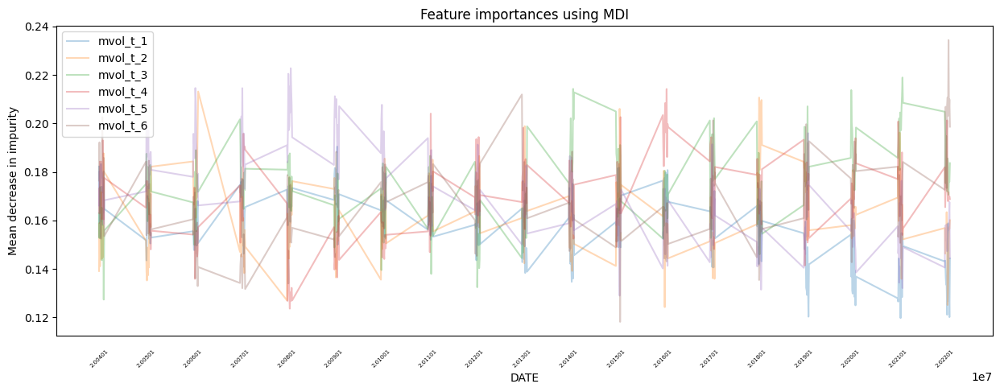

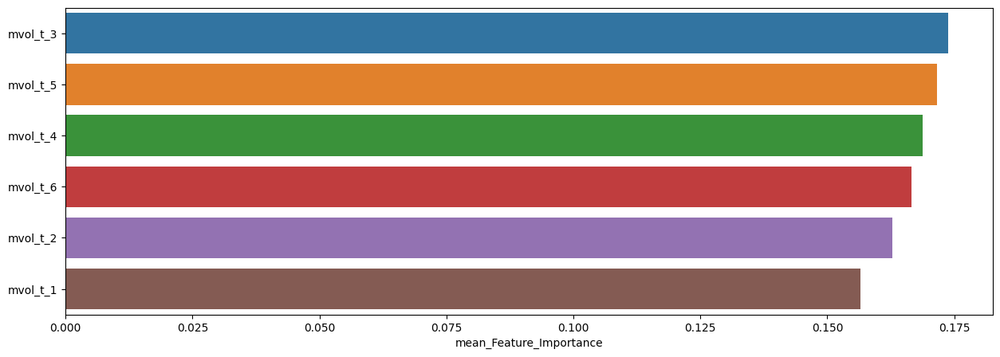

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_3,0.173855,0.218955,0.127368
mvol_t_5,0.171554,0.222757,0.128981
mvol_t_4,0.168780,0.214206,0.123629
mvol_t_6,0.166519,0.234370,0.118198
mvol_t_2,0.162739,0.213170,0.124268
mvol_t_1,0.156553,0.190473,0.119755


In [35]:
slice_feature_importance(Fixed_XGB_Result, # 모델 추론 결과 데이터
                         4, # 나눌 구간 수 (If None : 특정 구간 입력) 
                         'Fixed', # Rolling Windows Method
                         'XGB') # 모델 명


IQR 기준 WML 이상치 (Maximum 미만) 개수

Number of Outlier by IQR (Maximum) : 16
Maximum by IQR : 0.1670798809375
Max Outlier : 0.3301628157
Min Outlier : 0.1709176029

ACTUAL = PRED = 1



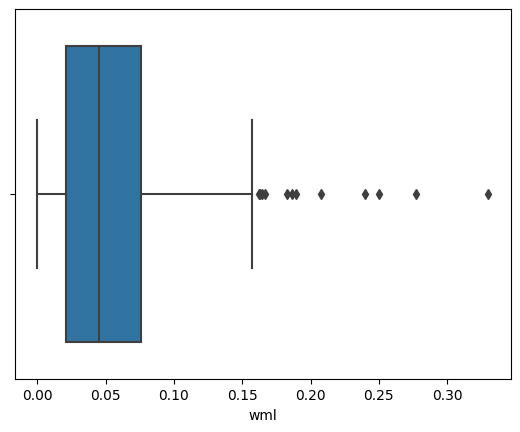

,count,mean,std,min,25%,50%,75%,max
wml,426.0,0.054397,0.045349,0.000007,0.020974,0.044985,0.076077,0.330163



--------------------------------------------------------------------------------


IQR 기준 WML 이상치 (Minimum 미만) 개수

Number of Outlier by IQR (Minimum) : 40
Minimun by IQR : -0.1267517369625
Max Outlier : -0.127277386
Min Outlier : -0.469903035

ACTUAL = PRED = 0



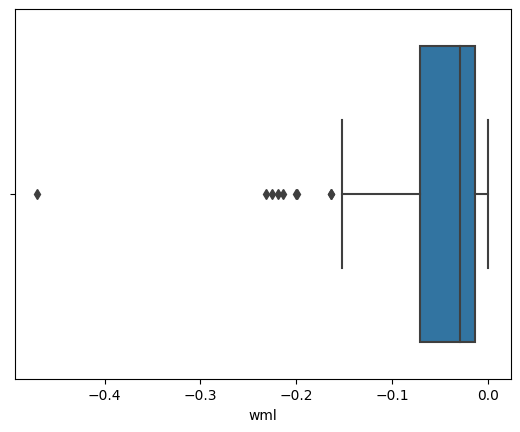

,count,mean,std,min,25%,50%,75%,max
wml,118.0,-0.055439,0.067076,-0.469903,-0.071337,-0.029971,-0.014281,-0.000132



--------------------------------------------------------------------------------


ACTUAL = 0 &  PRED = 1



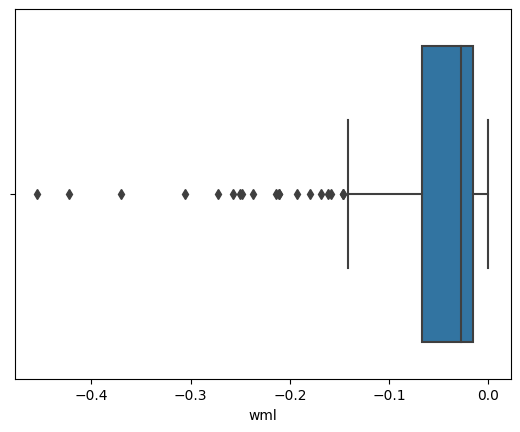

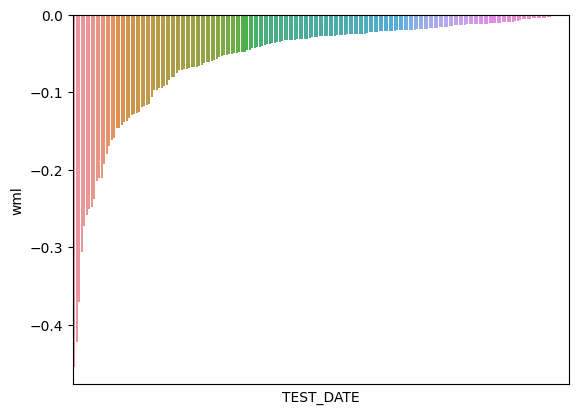

,count,mean,std,min,25%,50%,75%,max
wml,198.0,-0.056831,0.073764,-0.454349,-0.067189,-0.02771,-0.015294,-0.000183



--------------------------------------------------------------------------------


ACTUAL = 1 &  PRED = 0



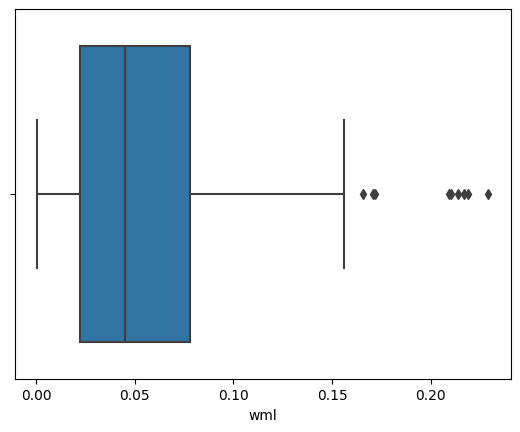

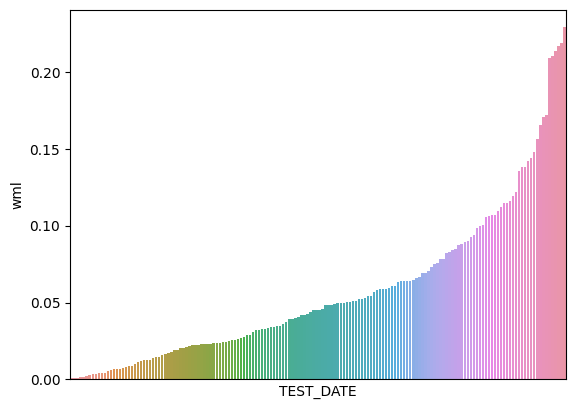

,count,mean,std,min,25%,50%,75%,max
wml,164.0,0.057465,0.050489,0.000692,0.022357,0.045171,0.078213,0.22913


In [36]:
XGB_A0_P1, XGB_A1_P0 = What_Pred(Fixed_XGB_Result, WML, 'XGB')

Sharpe Ratio : 0.64800

최근 누적 수익률

  2022년-12월 -> 19669.61
  2022년-11월 -> 17721.88
  2022년-10월 -> 17721.88
  2022년-09월 -> 15692.38
  2022년-08월 -> 15692.38

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2001년-09월 -> 64519.07
  2등 : 2002년-09월 -> 64378.24
  3등 : 2002년-07월 -> 56059.69
  4등 : 2009년-02월 -> 55900.82
  5등 : 2002년-08월 -> 54435.57
  6등 : 2001년-08월 -> 53437.56
  7등 : 2002년-06월 -> 53152.05
  8등 : 2002년-10월 -> 51943.61
  9등 : 2008년-11월 -> 50982.58
  10등 : 2009년-01월 -> 49775.85



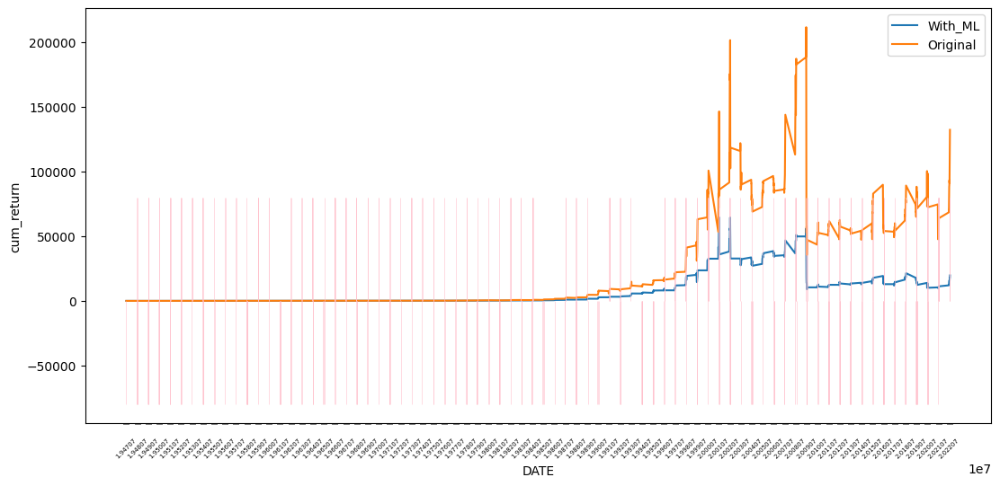

In [37]:
XGB_F_CUM_RETURN_static = cumm_return_by_dynamic(Fixed_XGB_Result,
                                                 WML,
                                                 'XGB_PRED_POS_WML',
                                                 XGB_A0_P1,
                                                 XGB_A1_P0,
                                                 plot=True)

Sharpe Ratio : 0.72070

최근 누적 수익률

  2022년-12월 -> 12838.21
  2022년-11월 -> 11973.52
  2022년-10월 -> 11964.07
  2022년-09월 -> 11023.02
  2022년-08월 -> 10948.34

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2002년-09월 -> 28811.00
  2등 : 2001년-09월 -> 27571.02
  3등 : 2002년-07월 -> 25258.14
  4등 : 2002년-08월 -> 24838.03
  5등 : 2009년-02월 -> 24791.43
  6등 : 2002년-06월 -> 24486.41
  7등 : 2002년-10월 -> 23946.11
  8등 : 2008년-11월 -> 23354.61
  9등 : 2001년-08월 -> 23228.31
  10등 : 2009년-01월 -> 22839.17



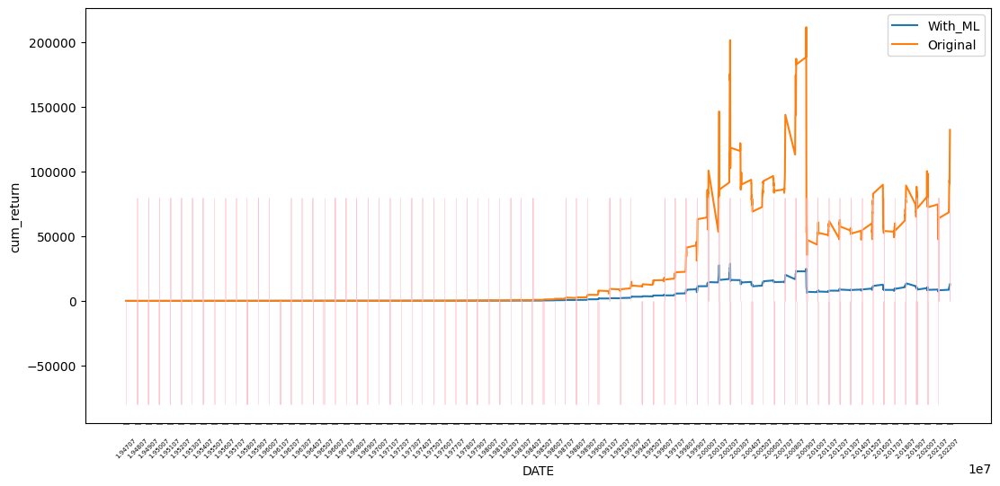

In [38]:
XGB_F_CUM_RETURN_dynamic = cumm_return_by_dynamic(Fixed_XGB_Result,
                                                 WML,
                                                 'XGB_PROB_POS_WML',
                                                 XGB_A0_P1,
                                                 XGB_A1_P0,
                                                 plot=True)

### LGBM

In [39]:
LGBM_param = {}
LGBM = LGBMClassifier(**LGBM_param, random_state=42)

**************************************************

LGBM Model의 Rolling Fixed Window를 실행합니다

설정된 Model의 하이퍼파리미터 : 

   boosting_type : gbdt
   class_weight : None
   colsample_bytree : 1.0
   importance_type : split
   learning_rate : 0.1
   max_depth : -1
   min_child_samples : 20
   min_child_weight : 0.001
   min_split_gain : 0.0
   n_estimators : 100
   n_jobs : -1
   num_leaves : 31
   objective : None
   random_state : 42
   reg_alpha : 0.0
   reg_lambda : 0.0
   silent : warn
   subsample : 1.0
   subsample_for_bin : 200000
   subsample_freq : 0

**************************************************


  0%|          | 0/906 [00:00<?, ?it/s]


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.44      0.37      0.40       316
         1.0       0.69      0.74      0.71       590

    accuracy                           0.61       906
   macro avg       0.56      0.56      0.56       906
weighted avg       0.60      0.61      0.61       906


accuracy : 0.6136865342163356

precision : 0.6880877742946708

recall : 0.7440677966101695

F1-Score : 0.7149837133550488



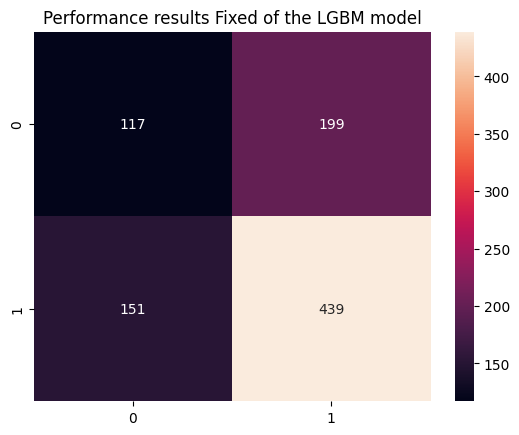


Feature Importance of the model



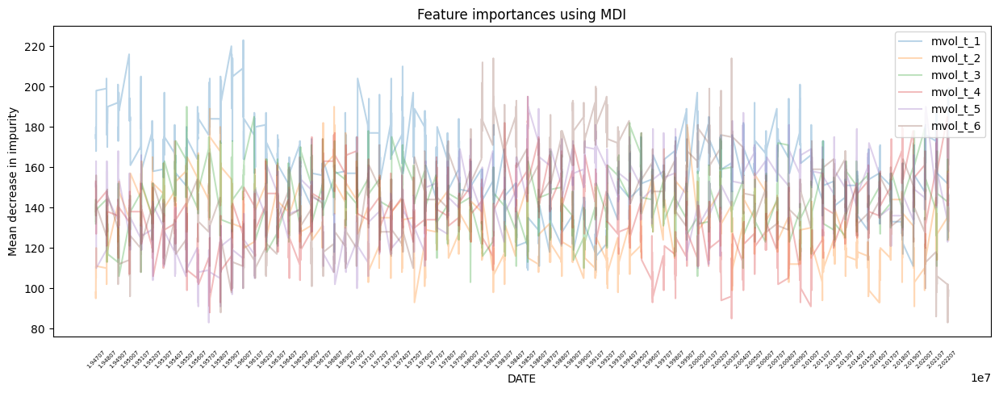

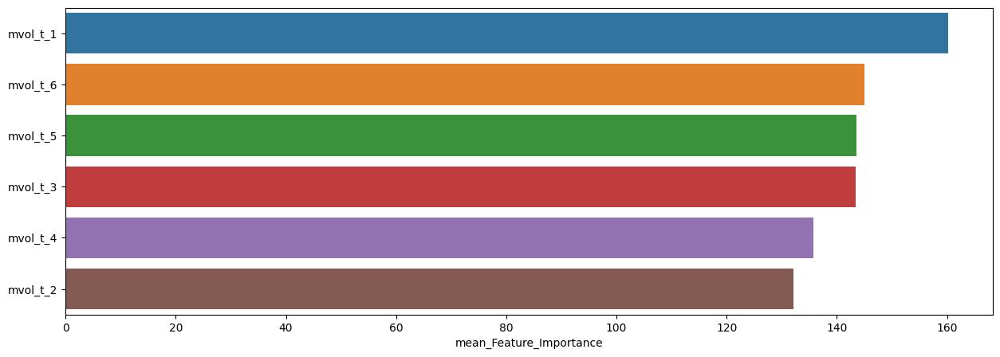

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,160.267108,223,109
mvol_t_6,145.002208,214,83
mvol_t_5,143.609272,195,83
mvol_t_3,143.423841,190,103
mvol_t_4,135.709713,195,85
mvol_t_2,132.132450,190,91


In [40]:
Fixed_LGBM_Result = Roling_Windows(data=dynmom, # 사용할 데이터
                                    window_size=240, # window size (훈련 데이터 셋 크기)
                                    method='Fixed', # Rolling Winodw Method (Fixed or Expanding)
                                    model=LGBM, # 사용할 모델
                                    model_name='LGBM', # 사용한 모델 명
                                    plot=True, # 모델 성능 지표 시각화 여부
                                    plot_feature=True) # 모델의 변수 중요도 시각화 여부


**************************************************

DATE : 19470731 ~ 19660429

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.41      0.39      0.40        75
         1.0       0.70      0.72      0.71       151

    accuracy                           0.61       226
   macro avg       0.56      0.55      0.55       226
weighted avg       0.61      0.61      0.61       226


accuracy : 0.6106194690265486

precision : 0.7032258064516129

recall : 0.7218543046357616

F1-Score : 0.7124183006535947



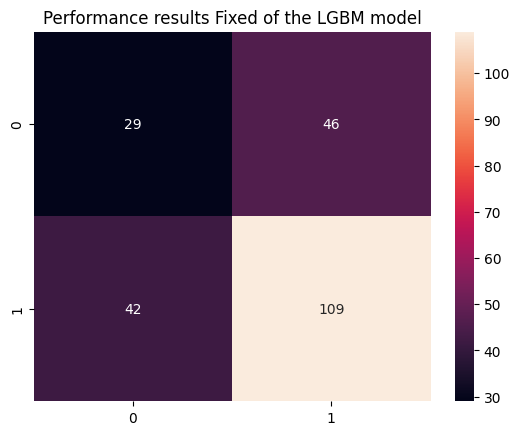


Feature Importance of the model



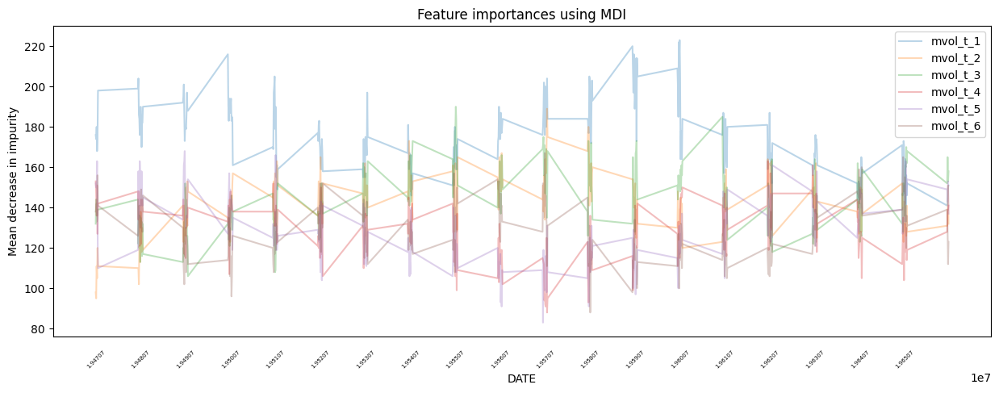

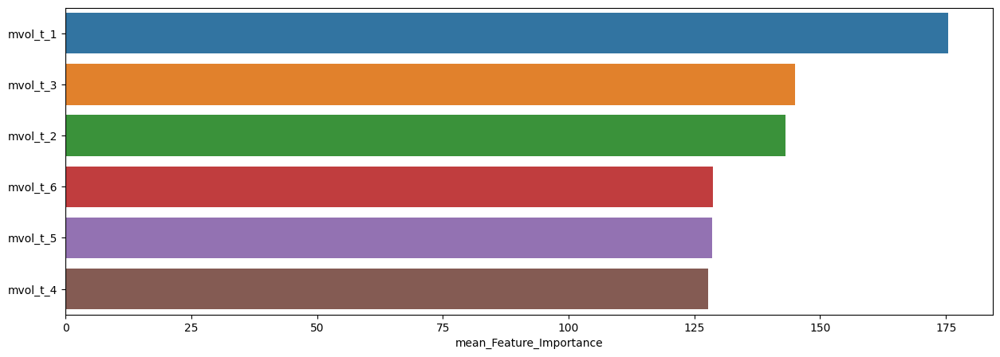

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,175.500000,223,133
mvol_t_3,145.066372,190,106
mvol_t_2,143.035398,189,95
mvol_t_6,128.601770,167,88
mvol_t_5,128.557522,168,83
mvol_t_4,127.769912,163,88



**************************************************

DATE : 19660531 ~ 19850228

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.42      0.37      0.39        75
         1.0       0.70      0.74      0.72       151

    accuracy                           0.62       226
   macro avg       0.56      0.56      0.56       226
weighted avg       0.61      0.62      0.61       226


accuracy : 0.6194690265486725

precision : 0.7044025157232704

recall : 0.7417218543046358

F1-Score : 0.7225806451612902



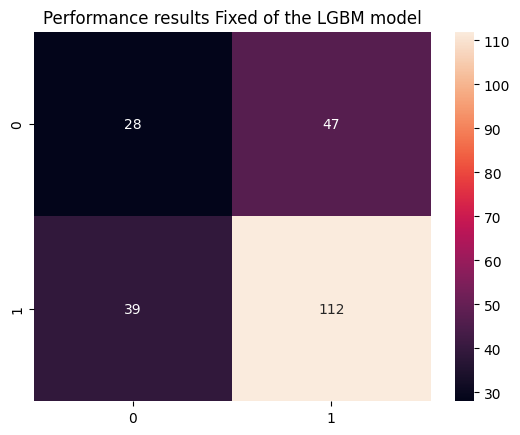


Feature Importance of the model



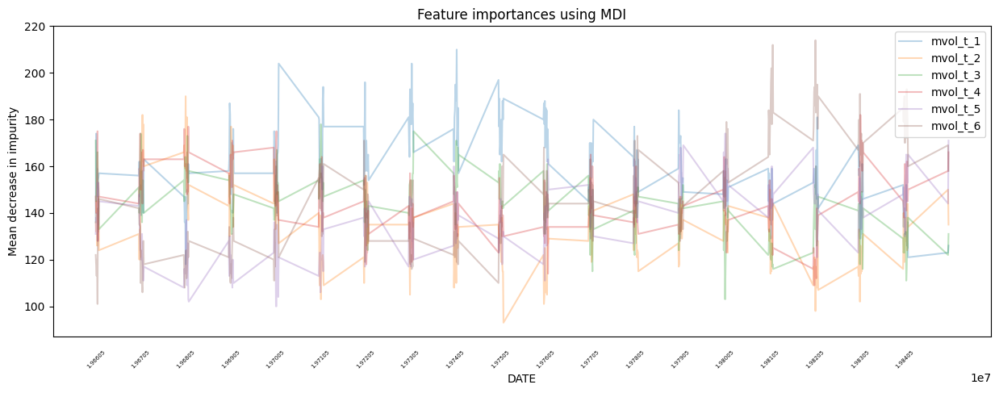

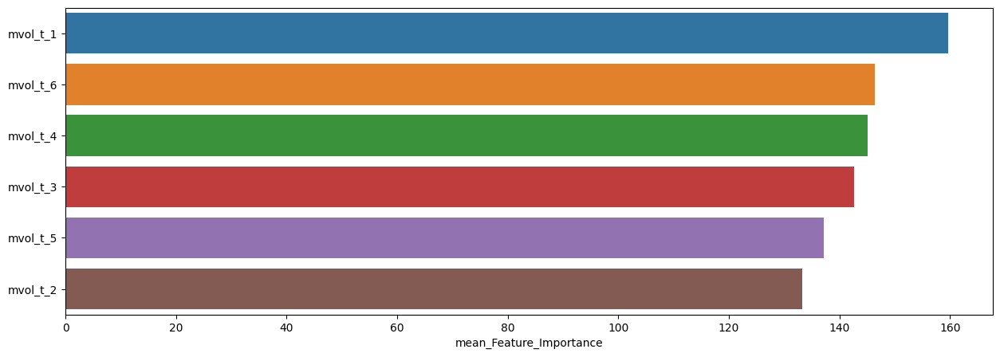

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,159.734513,210,118
mvol_t_6,146.393805,214,101
mvol_t_4,145.084071,182,109
mvol_t_3,142.623894,178,103
mvol_t_5,137.238938,174,100
mvol_t_2,133.216814,190,93



**************************************************

DATE : 19850329 ~ 20031231

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.45      0.37      0.41        70
         1.0       0.74      0.79      0.77       156

    accuracy                           0.66       226
   macro avg       0.59      0.58      0.59       226
weighted avg       0.65      0.66      0.65       226


accuracy : 0.6637168141592921

precision : 0.7380952380952381

recall : 0.7948717948717948

F1-Score : 0.7654320987654322



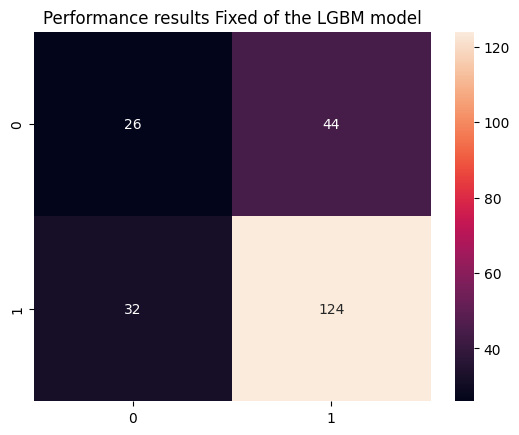


Feature Importance of the model



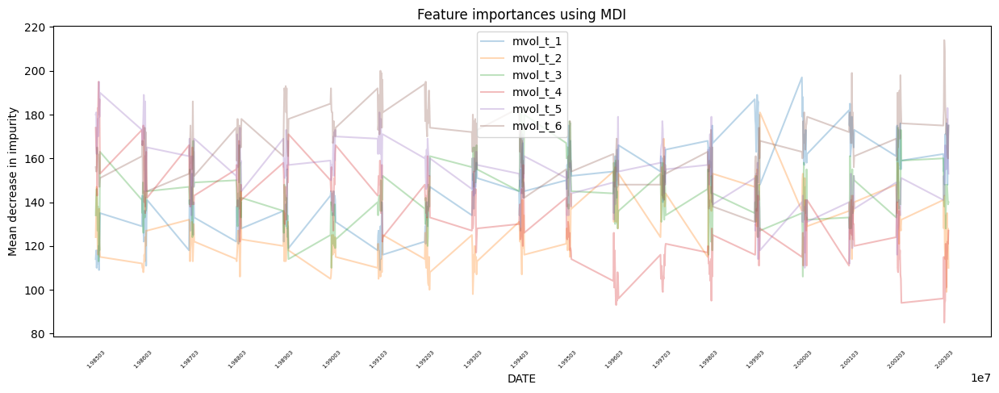

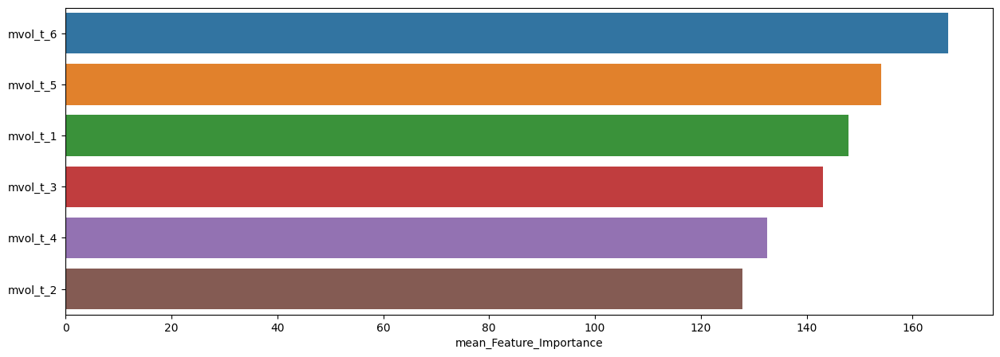

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_6,166.774336,214,131
mvol_t_5,154.048673,195,110
mvol_t_1,147.951327,197,109
mvol_t_3,143.110619,182,106
mvol_t_4,132.513274,195,85
mvol_t_2,127.827434,181,98



**************************************************

DATE : 20040130 ~ 20221230

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.47      0.35      0.40        96
         1.0       0.60      0.71      0.65       132

    accuracy                           0.56       228
   macro avg       0.54      0.53      0.53       228
weighted avg       0.55      0.56      0.55       228


accuracy : 0.5614035087719298

precision : 0.6025641025641025

recall : 0.7121212121212122

F1-Score : 0.6527777777777778



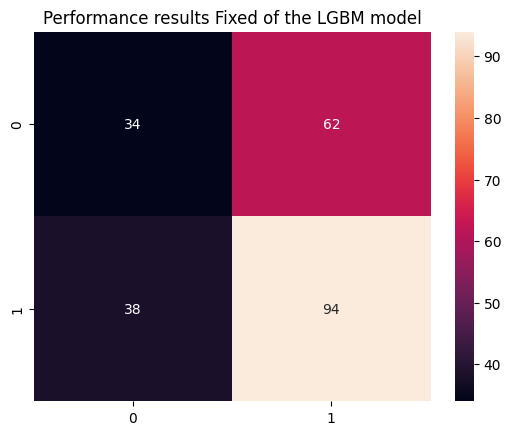


Feature Importance of the model



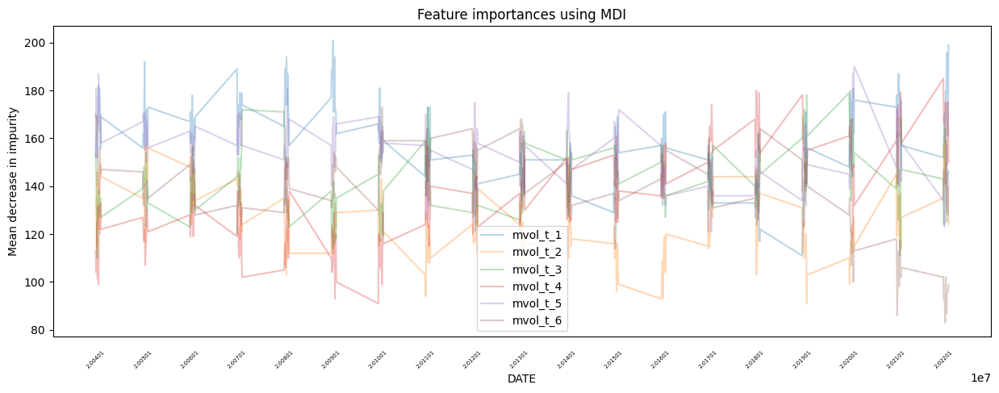

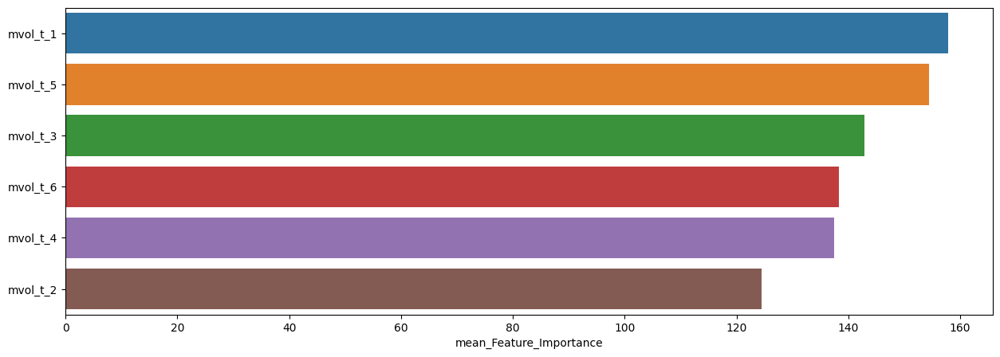

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,157.903509,201,111
mvol_t_5,154.495614,190,121
mvol_t_3,142.899123,179,110
mvol_t_6,138.298246,173,83
mvol_t_4,137.456140,185,91
mvol_t_2,124.517544,158,91


In [41]:
slice_feature_importance(Fixed_LGBM_Result, # 모델 추론 결과 데이터
                        4, # 나눌 구간 수 (If None : 특정 구간 입력) 
                        'Fixed', # Rolling Windows Method
                        'LGBM') # 모델 명


IQR 기준 WML 이상치 (Maximum 미만) 개수

Number of Outlier by IQR (Maximum) : 16
Maximum by IQR : 0.1670798809375
Max Outlier : 0.3301628157
Min Outlier : 0.1709176029

ACTUAL = PRED = 1



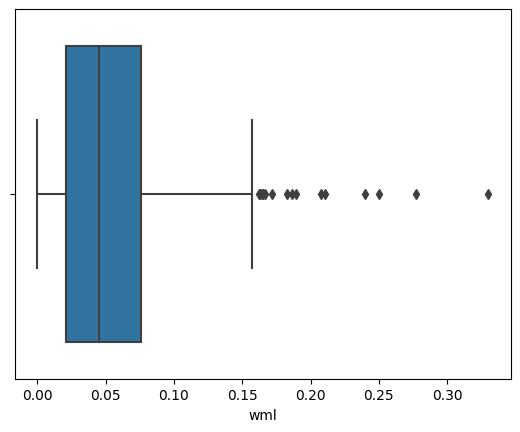

,count,mean,std,min,25%,50%,75%,max
wml,439.0,0.05474,0.046164,0.000007,0.02098,0.044931,0.075519,0.330163



--------------------------------------------------------------------------------


IQR 기준 WML 이상치 (Minimum 미만) 개수

Number of Outlier by IQR (Minimum) : 40
Minimun by IQR : -0.1267517369625
Max Outlier : -0.127277386
Min Outlier : -0.469903035

ACTUAL = PRED = 0



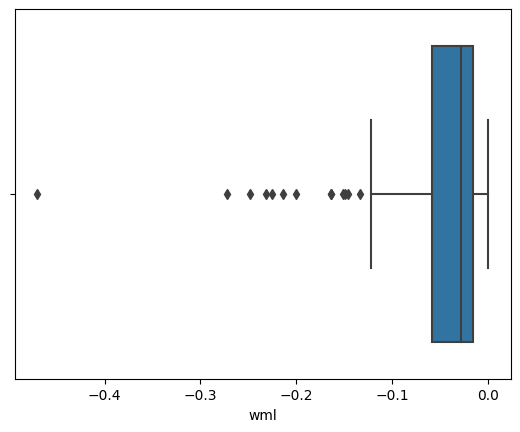

,count,mean,std,min,25%,50%,75%,max
wml,117.0,-0.054374,0.068956,-0.469903,-0.058747,-0.028629,-0.015898,-0.000132



--------------------------------------------------------------------------------


ACTUAL = 0 &  PRED = 1



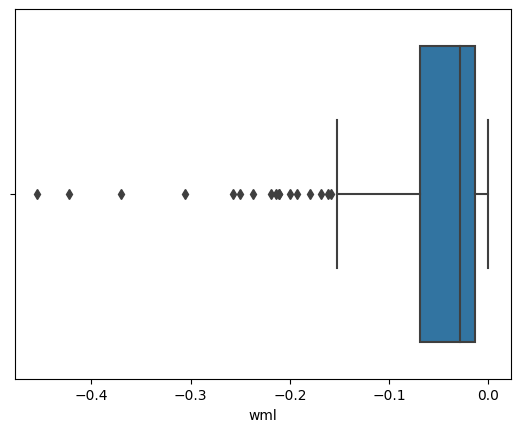

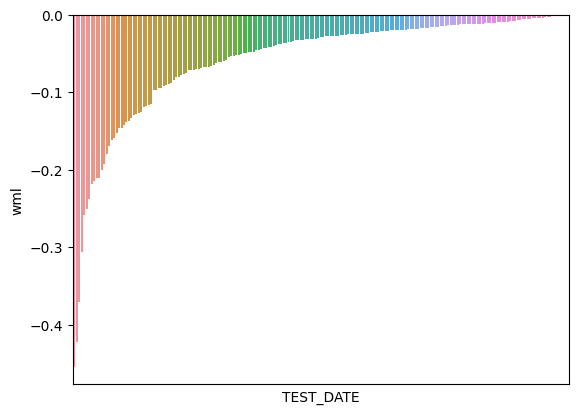

,count,mean,std,min,25%,50%,75%,max
wml,199.0,-0.05745,0.072689,-0.454349,-0.069473,-0.028532,-0.013826,-0.000183



--------------------------------------------------------------------------------


ACTUAL = 1 &  PRED = 0



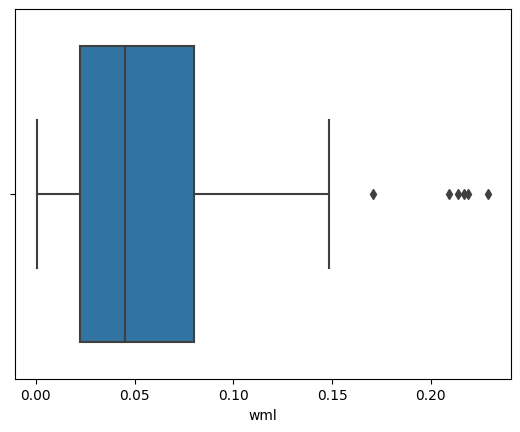

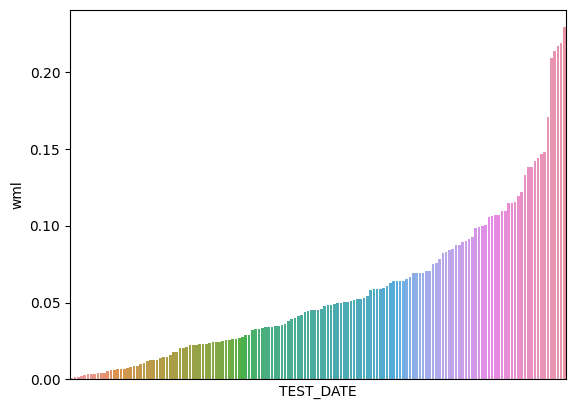

,count,mean,std,min,25%,50%,75%,max
wml,151.0,0.056732,0.048772,0.000805,0.022444,0.045201,0.080281,0.22913


In [42]:
LGBM_A0_P1, LGBM_A1_P0 = What_Pred(Fixed_LGBM_Result,
                                   WML,
                                   'LGBM')

Sharpe Ratio : 0.64610

최근 누적 수익률

  2022년-12월 -> 37160.74
  2022년-11월 -> 37160.74
  2022년-10월 -> 37160.74
  2022년-09월 -> 32905.25
  2022년-08월 -> 32905.25

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2009년-02월 -> 79635.14
  2등 : 2009년-01월 -> 70909.68
  3등 : 2008년-11월 -> 70447.17
  4등 : 2008년-12월 -> 68779.73
  5등 : 2008년-10월 -> 64241.84
  6등 : 2008년-09월 -> 64241.84
  7등 : 2008년-08월 -> 64241.84
  8등 : 2008년-07월 -> 64241.84
  9등 : 2008년-06월 -> 64241.84
  10등 : 2002년-09월 -> 60896.84



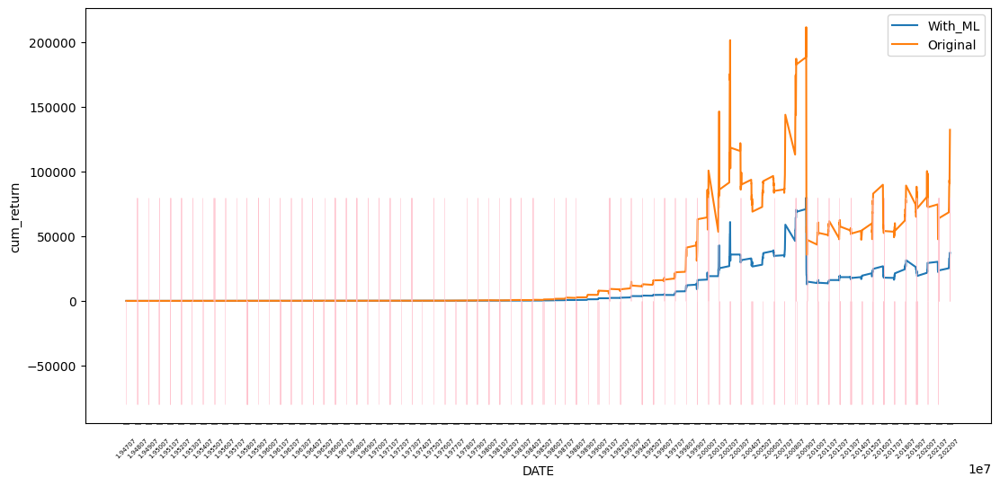

In [43]:
LGBM_F_CUM_RETURN_static = cumm_return_by_dynamic(Fixed_LGBM_Result, # 모델 추론 결과 데이터
                                                   WML, # 원본 데이터의 'wml' 데이터
                                                   'LGBM_PRED_POS_WML', # 모델 추론 결과 칼럼
                                                   LGBM_A0_P1,
                                                   LGBM_A1_P0,
                                                   plot=True) # 시각화 여부

Sharpe Ratio : 0.72488

최근 누적 수익률

  2022년-12월 -> 18334.07
  2022년-11월 -> 17843.08
  2022년-10월 -> 17768.61
  2022년-09월 -> 16146.52
  2022년-08월 -> 15630.48

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2009년-02월 -> 20616.24
  2등 : 2008년-11월 -> 19097.53
  3등 : 2009년-01월 -> 19027.57
  4등 : 2008년-12월 -> 18667.19
  5등 : 2022년-12월 -> 18334.07
  6등 : 2008년-10월 -> 17978.88
  7등 : 2022년-11월 -> 17843.08
  8등 : 2022년-10월 -> 17768.61
  9등 : 2008년-09월 -> 17635.35
  10등 : 2008년-06월 -> 17431.39



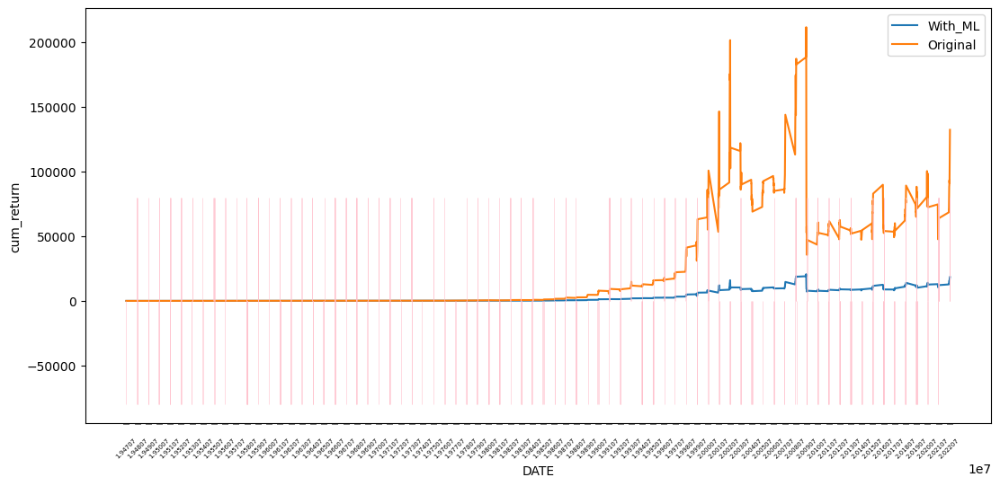

In [44]:
LGBM_F_CUM_RETURN_dynamic = cumm_return_by_dynamic(Fixed_LGBM_Result, # 모델 추론 결과 데이터
                                                   WML, # 원본 데이터의 'wml' 데이터
                                                   'LGBM_PROB_POS_WML', # 모델 추론 결과 칼럼
                                                   LGBM_A0_P1,
                                                   LGBM_A1_P0,
                                                   plot=True) # 시각화 여부

## Rolling Expanding Windows

### Random Forest

In [45]:
RDF_Param={} 
RDF = RandomForestClassifier(**RDF_Param, random_state=42)

**************************************************

RDF Model의 Rolling Expanding Window를 실행합니다

설정된 Model의 하이퍼파리미터 : 

   bootstrap : True
   ccp_alpha : 0.0
   class_weight : None
   criterion : gini
   max_depth : None
   max_features : sqrt
   max_leaf_nodes : None
   max_samples : None
   min_impurity_decrease : 0.0
   min_samples_leaf : 1
   min_samples_split : 2
   min_weight_fraction_leaf : 0.0
   n_estimators : 100
   n_jobs : None
   oob_score : False
   random_state : 42
   verbose : 0
   warm_start : False

**************************************************


  0%|          | 0/906 [00:00<?, ?it/s]


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.39      0.28      0.33       316
         1.0       0.67      0.76      0.71       590

    accuracy                           0.60       906
   macro avg       0.53      0.52      0.52       906
weighted avg       0.57      0.60      0.58       906


accuracy : 0.5960264900662252

precision : 0.665680473372781

recall : 0.7627118644067796

F1-Score : 0.7109004739336493



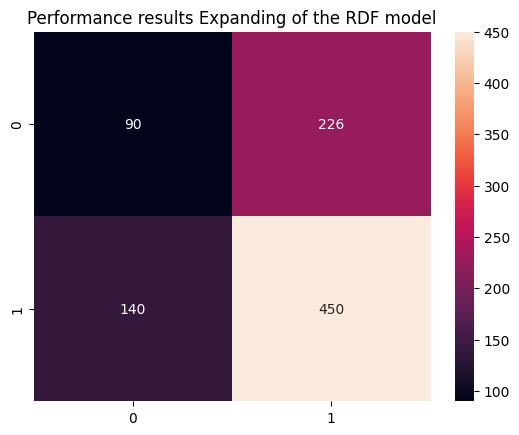


Feature Importance of the model



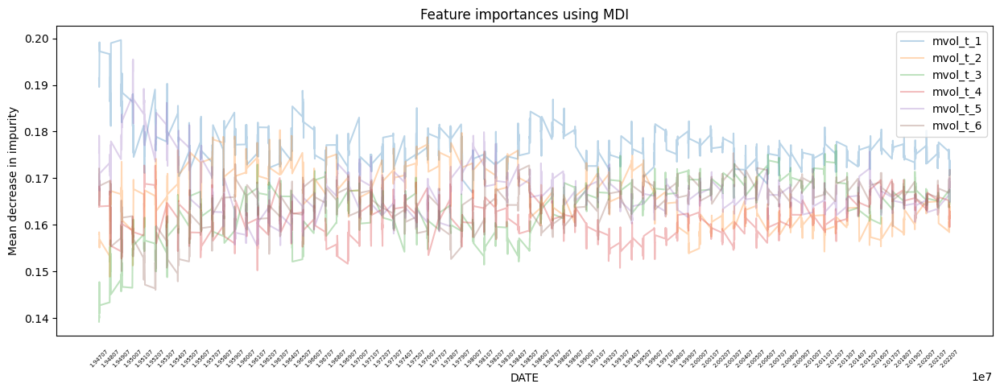

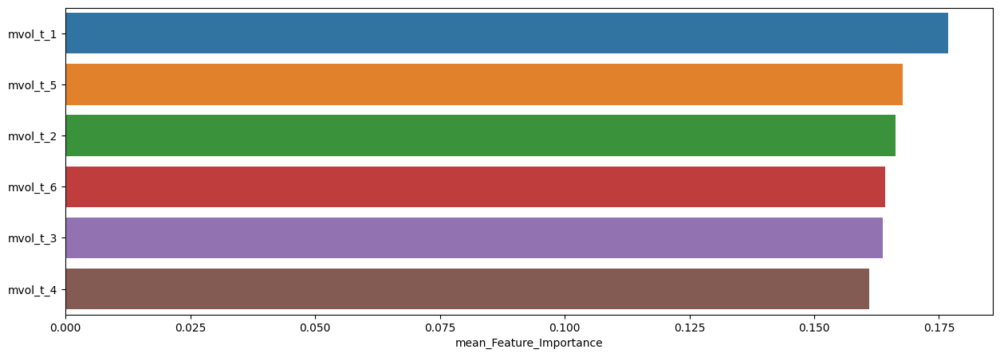

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,0.176898,0.199647,0.163278
mvol_t_5,0.167663,0.195492,0.155513
mvol_t_2,0.166318,0.180314,0.148829
mvol_t_6,0.164274,0.175396,0.146030
mvol_t_3,0.163765,0.177149,0.139182
mvol_t_4,0.161083,0.172732,0.150203


In [46]:
Expanding_RDF_Result = Roling_Windows(data=dynmom, # 사용할 데이터
                                      window_size=240, # window size (훈련 데이터 셋 크기)
                                      method='Expanding', # Rolling Winodw Method (Fixed or Expanding)
                                      model=RDF, # 사용할 모델
                                      model_name='RDF', # 사용한 모델 명
                                      plot=True, # 모델 성능 지표 시각화 여부
                                      plot_feature=True) # 모델의 변수 중요도 시각화 여부


**************************************************

DATE : 19470731 ~ 19660429

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.34      0.27      0.30        75
         1.0       0.67      0.75      0.71       151

    accuracy                           0.59       226
   macro avg       0.51      0.51      0.50       226
weighted avg       0.56      0.59      0.57       226


accuracy : 0.588495575221239

precision : 0.6726190476190477

recall : 0.7483443708609272

F1-Score : 0.7084639498432602



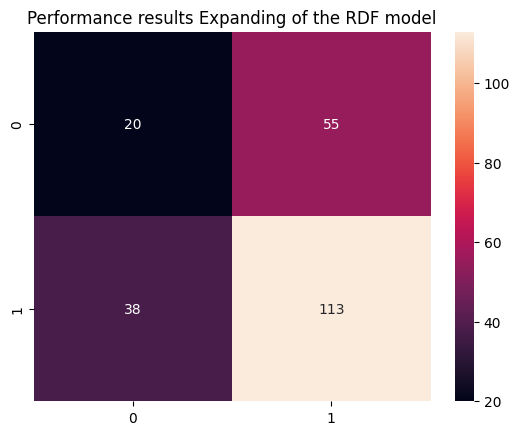


Feature Importance of the model



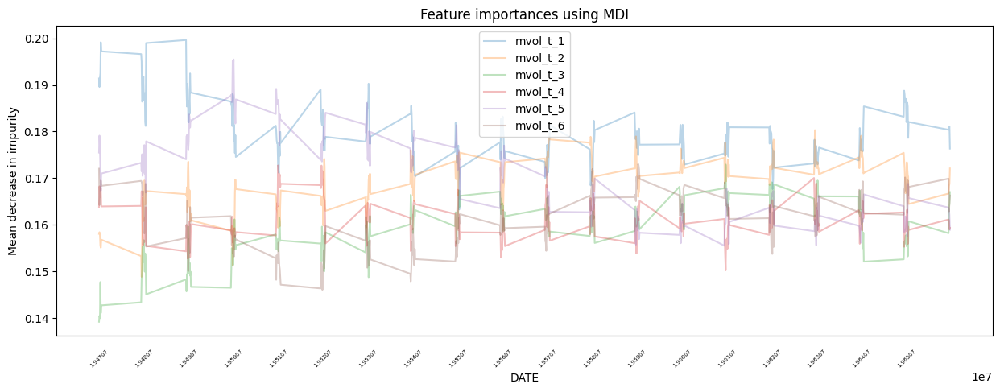

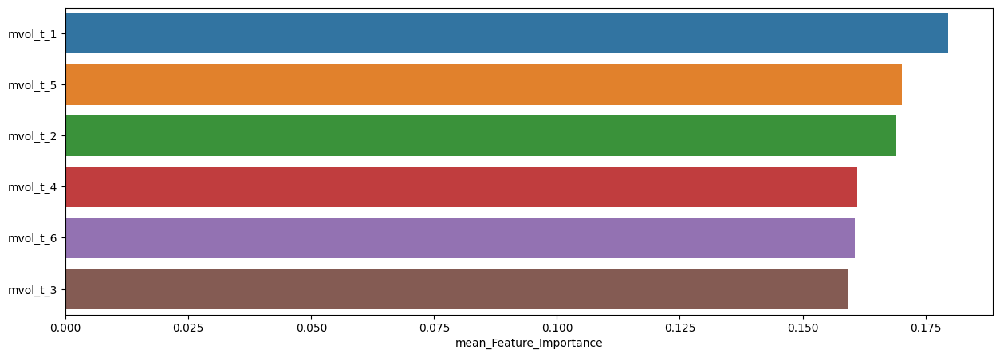

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,0.179675,0.199647,0.163278
mvol_t_5,0.170252,0.195492,0.155513
mvol_t_2,0.169091,0.180314,0.148829
mvol_t_4,0.161067,0.172732,0.150203
mvol_t_6,0.160592,0.173026,0.146030
mvol_t_3,0.159322,0.172924,0.139182



**************************************************

DATE : 19660531 ~ 19850228

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.42      0.32      0.36        75
         1.0       0.70      0.78      0.74       151

    accuracy                           0.63       226
   macro avg       0.56      0.55      0.55       226
weighted avg       0.61      0.63      0.61       226


accuracy : 0.6283185840707964

precision : 0.6982248520710059

recall : 0.7814569536423841

F1-Score : 0.7375



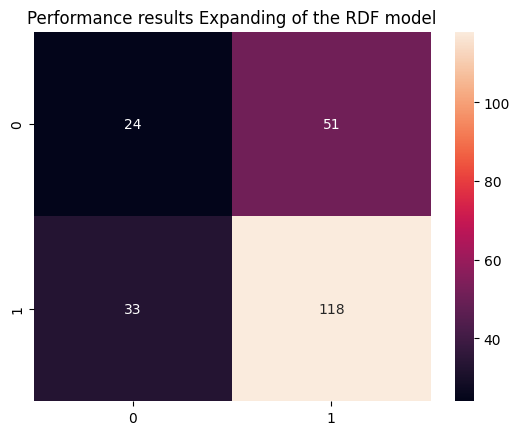


Feature Importance of the model



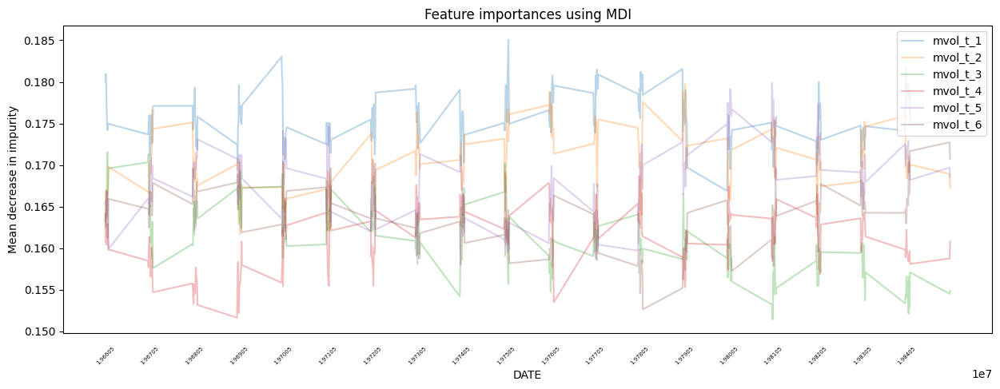

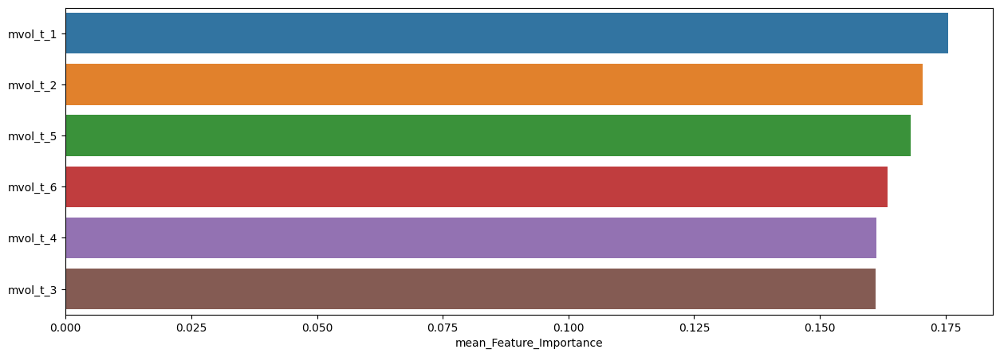

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,0.175570,0.185064,0.166892
mvol_t_2,0.170481,0.179725,0.161679
mvol_t_5,0.168108,0.179883,0.158109
mvol_t_6,0.163451,0.172739,0.152641
mvol_t_4,0.161257,0.169102,0.151632
mvol_t_3,0.161132,0.171546,0.151436



**************************************************

DATE : 19850329 ~ 20031231

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.42      0.33      0.37        70
         1.0       0.73      0.79      0.76       156

    accuracy                           0.65       226
   macro avg       0.57      0.56      0.56       226
weighted avg       0.63      0.65      0.64       226


accuracy : 0.6504424778761062

precision : 0.7251461988304093

recall : 0.7948717948717948

F1-Score : 0.7584097859327216



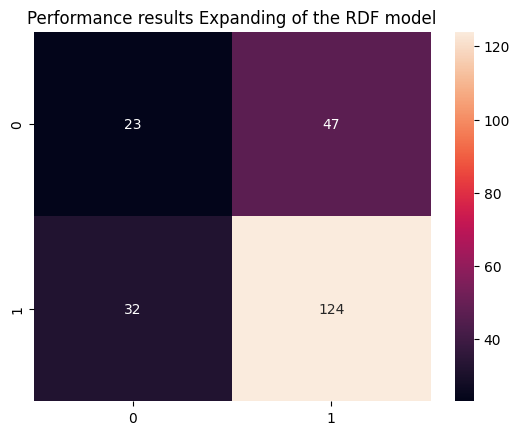


Feature Importance of the model



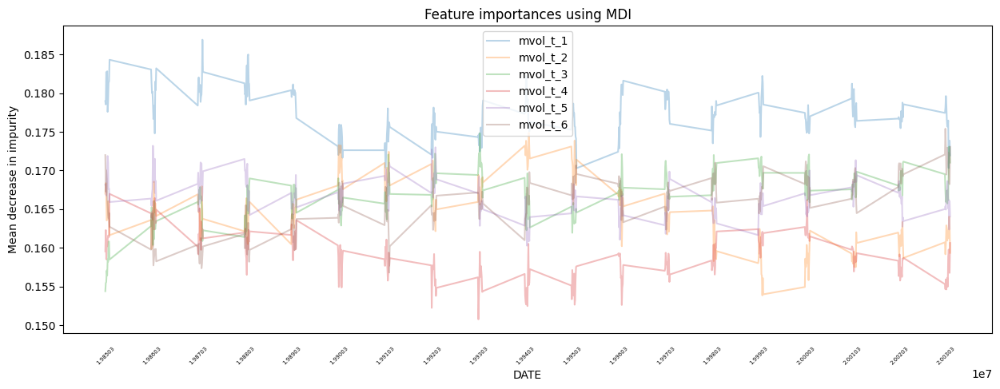

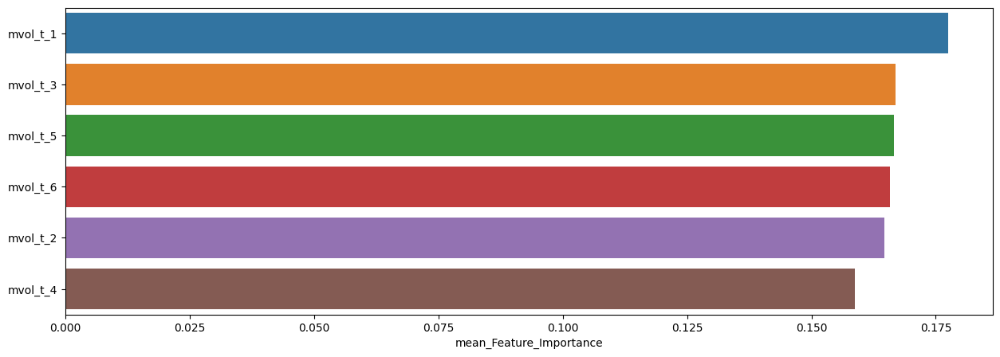

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,0.177546,0.186899,0.170281
mvol_t_3,0.166844,0.174819,0.154378
mvol_t_5,0.166516,0.173186,0.160268
mvol_t_6,0.165712,0.175396,0.156788
mvol_t_2,0.164584,0.174866,0.153839
mvol_t_4,0.158798,0.166970,0.150746



**************************************************

DATE : 20040130 ~ 20221230

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.38      0.24      0.29        96
         1.0       0.57      0.72      0.63       132

    accuracy                           0.52       228
   macro avg       0.47      0.48      0.46       228
weighted avg       0.49      0.52      0.49       228


accuracy : 0.5175438596491229

precision : 0.5654761904761905

recall : 0.7196969696969697

F1-Score : 0.6333333333333333



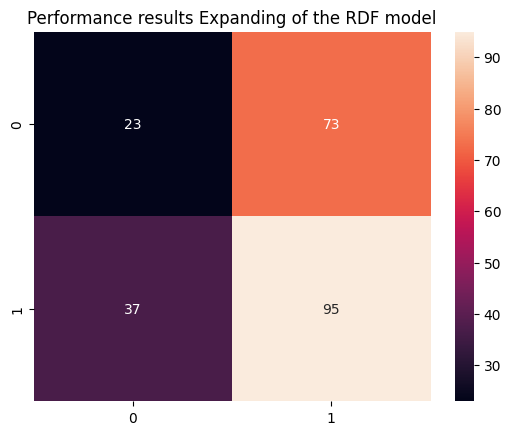


Feature Importance of the model



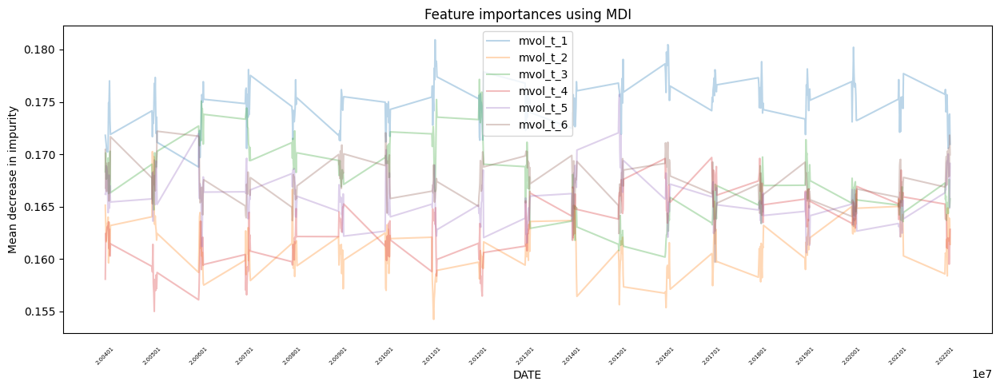

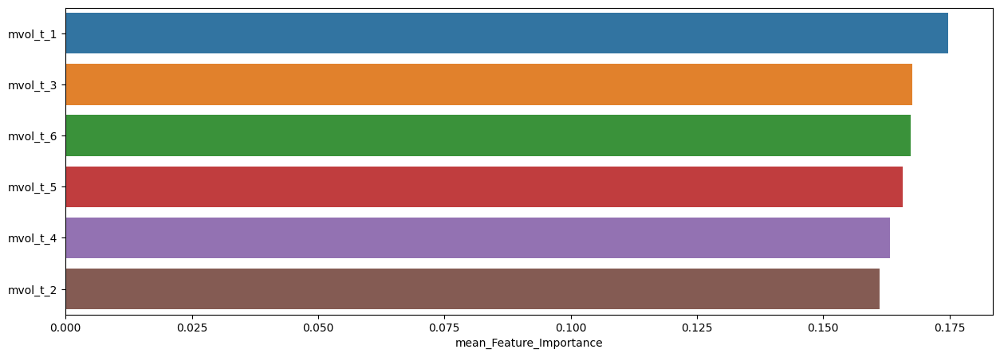

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,0.174820,0.180927,0.168779
mvol_t_3,0.167726,0.177149,0.160186
mvol_t_6,0.167312,0.172198,0.159700
mvol_t_5,0.165792,0.175711,0.160602
mvol_t_4,0.163191,0.169691,0.154994
mvol_t_2,0.161159,0.170252,0.154239


In [47]:
slice_feature_importance(Expanding_RDF_Result, # 모델 추론 결과 데이터
                         4, # 나눌 구간 수 (If None : 특정 구간 입력) 
                         'Expanding', # Rolling Windows Method
                         'RDF') # 모델 명


IQR 기준 WML 이상치 (Maximum 미만) 개수

Number of Outlier by IQR (Maximum) : 16
Maximum by IQR : 0.1670798809375
Max Outlier : 0.3301628157
Min Outlier : 0.1709176029

ACTUAL = PRED = 1



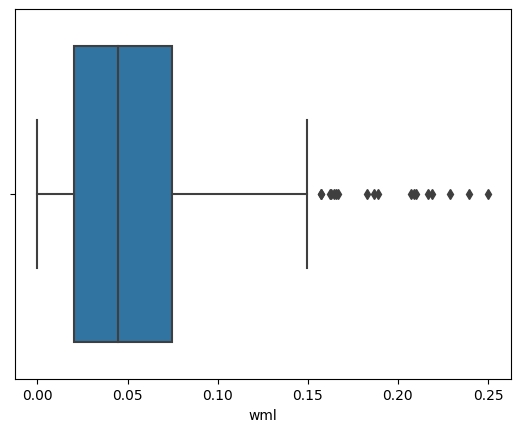

,count,mean,std,min,25%,50%,75%,max
wml,450.0,0.054557,0.045475,0.000007,0.020572,0.044955,0.074883,0.250175



--------------------------------------------------------------------------------


IQR 기준 WML 이상치 (Minimum 미만) 개수

Number of Outlier by IQR (Minimum) : 40
Minimun by IQR : -0.1267517369625
Max Outlier : -0.127277386
Min Outlier : -0.469903035

ACTUAL = PRED = 0



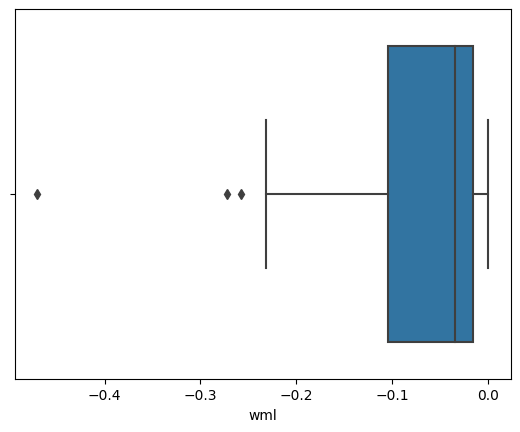

,count,mean,std,min,25%,50%,75%,max
wml,90.0,-0.065516,0.076509,-0.469903,-0.104266,-0.03502,-0.015809,-0.000132



--------------------------------------------------------------------------------


ACTUAL = 0 &  PRED = 1



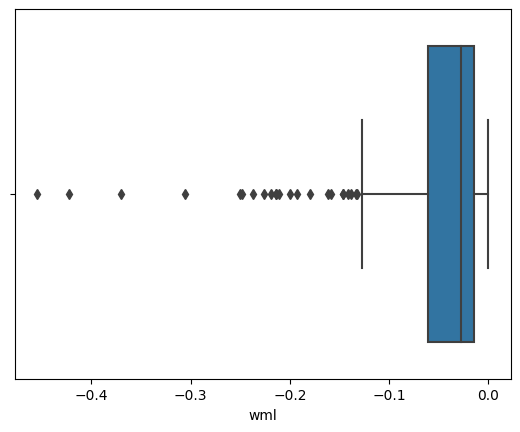

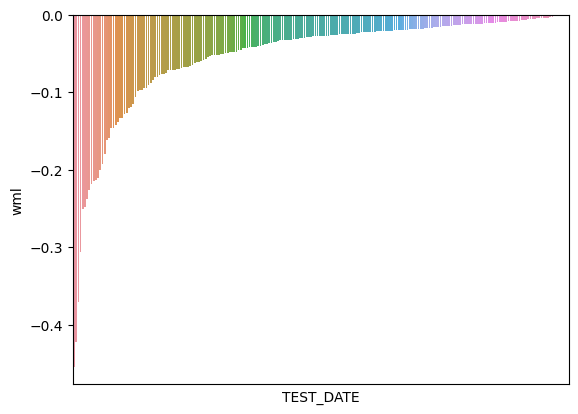

,count,mean,std,min,25%,50%,75%,max
wml,226.0,-0.052645,0.068858,-0.454349,-0.06123,-0.027247,-0.014313,-0.000183



--------------------------------------------------------------------------------


ACTUAL = 1 &  PRED = 0



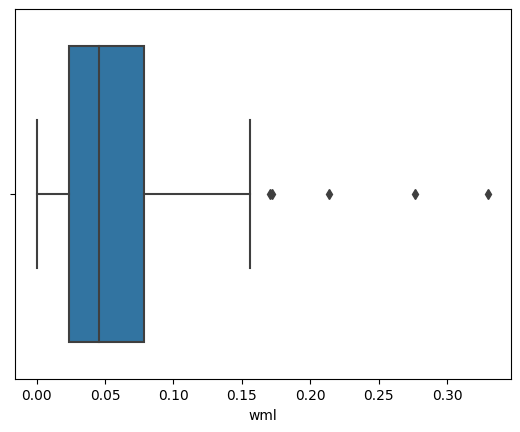

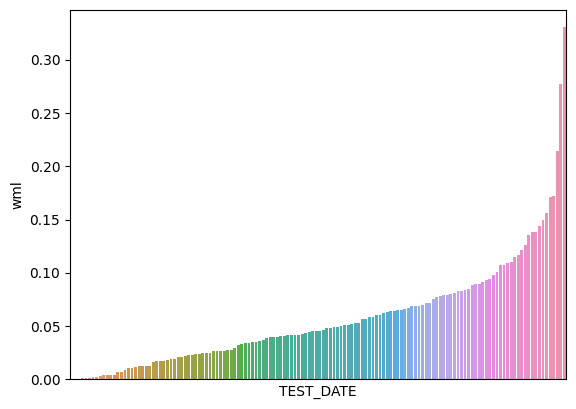

,count,mean,std,min,25%,50%,75%,max
wml,140.0,0.057477,0.050979,0.000577,0.023386,0.045389,0.078486,0.330163


In [48]:
RDF_A0_P1, RDF_A1_P0 = What_Pred(Expanding_RDF_Result, WML, 'RDF')

Sharpe Ratio : 0.60573

최근 누적 수익률

  2022년-12월 -> 38942.68
  2022년-11월 -> 38942.68
  2022년-10월 -> 38942.68
  2022년-09월 -> 34483.13
  2022년-08월 -> 31350.20

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2002년-09월 -> 66477.00
  2등 : 2002년-08월 -> 56210.19
  3등 : 2002년-07월 -> 56210.19
  4등 : 2002년-10월 -> 53637.00
  5등 : 2002년-06월 -> 53294.75
  6등 : 2002년-05월 -> 45827.12
  7등 : 2002년-04월 -> 45827.12
  8등 : 2009년-02월 -> 44255.25
  9등 : 2002년-02월 -> 39507.04
  10등 : 2009년-01월 -> 39406.25



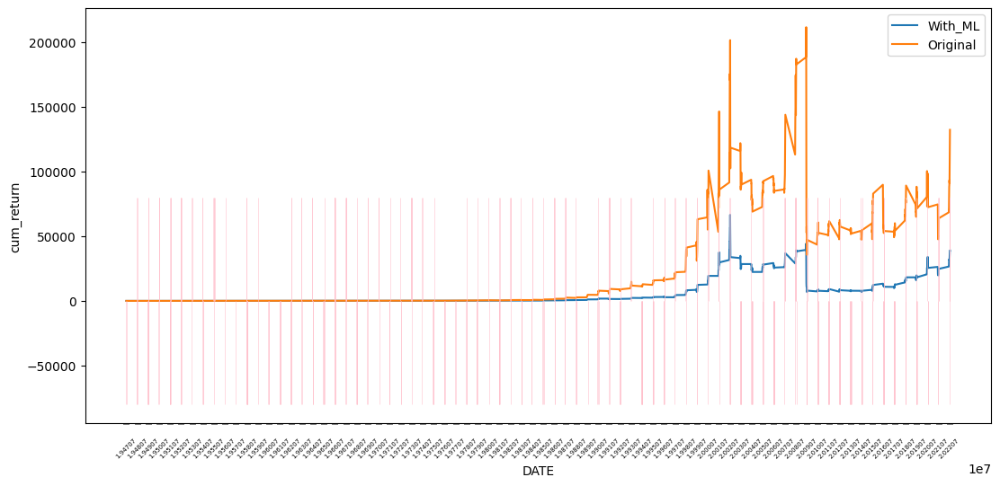

In [49]:
RDF_E_CUM_RETURN_static = cumm_return_by_dynamic(Expanding_RDF_Result,
                                                 WML,
                                                 'RDF_PRED_POS_WML',
                                                 RDF_A0_P1,
                                                 RDF_A1_P0,
                                                 plot=True)

Sharpe Ratio : 0.71022

최근 누적 수익률

  2022년-12월 -> 9191.82
  2022년-11월 -> 8740.31
  2022년-10월 -> 8568.88
  2022년-09월 -> 7811.17
  2022년-08월 -> 7376.22

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2009년-02월 -> 9244.87
  2등 : 2022년-12월 -> 9191.82
  3등 : 2022년-11월 -> 8740.31
  4등 : 2008년-11월 -> 8590.28
  5등 : 2022년-10월 -> 8568.88
  6등 : 2009년-01월 -> 8550.39
  7등 : 2008년-12월 -> 8417.44
  8등 : 2008년-10월 -> 7995.54
  9등 : 2008년-06월 -> 7901.25
  10등 : 2022년-09월 -> 7811.17



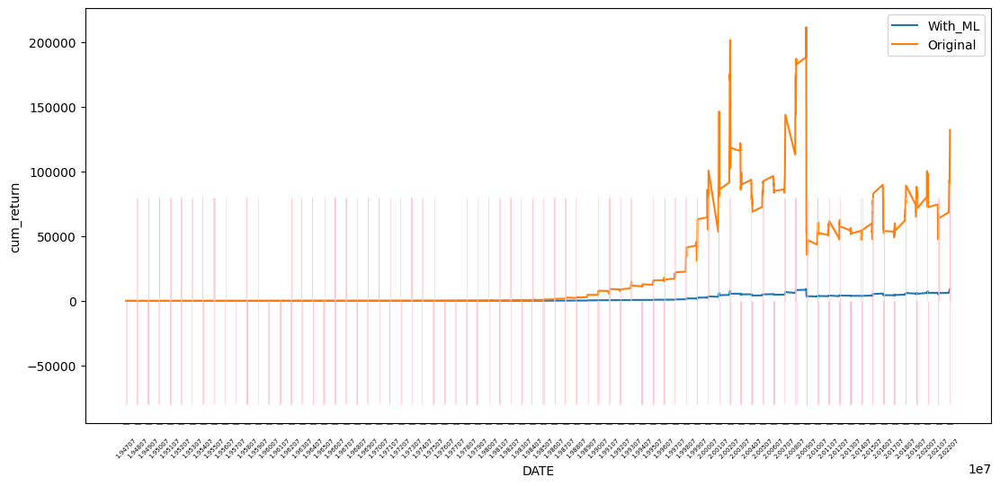

In [50]:
RDF_E_CUM_RETURN_dynamic = cumm_return_by_dynamic(Expanding_RDF_Result,
                                                 WML,
                                                 'RDF_PROB_POS_WML',
                                                 RDF_A0_P1,
                                                 RDF_A1_P0,
                                                 plot=True)

### Grdient Boosting

In [51]:
GBC_Param = {}
GBC = GradientBoostingClassifier(*GBC_Param, random_state=42)

**************************************************

GBC Model의 Rolling Expanding Window를 실행합니다

설정된 Model의 하이퍼파리미터 : 

   ccp_alpha : 0.0
   criterion : friedman_mse
   init : None
   learning_rate : 0.1
   loss : log_loss
   max_depth : 3
   max_features : None
   max_leaf_nodes : None
   min_impurity_decrease : 0.0
   min_samples_leaf : 1
   min_samples_split : 2
   min_weight_fraction_leaf : 0.0
   n_estimators : 100
   n_iter_no_change : None
   random_state : 42
   subsample : 1.0
   tol : 0.0001
   validation_fraction : 0.1
   verbose : 0
   warm_start : False

**************************************************


  0%|          | 0/906 [00:00<?, ?it/s]


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.40      0.26      0.32       316
         1.0       0.67      0.79      0.73       590

    accuracy                           0.61       906
   macro avg       0.54      0.53      0.52       906
weighted avg       0.58      0.61      0.58       906


accuracy : 0.608167770419426

precision : 0.6676176890156919

recall : 0.7932203389830509

F1-Score : 0.7250193648334625



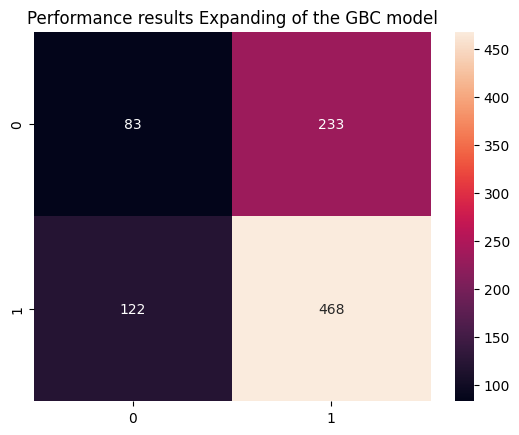


Feature Importance of the model



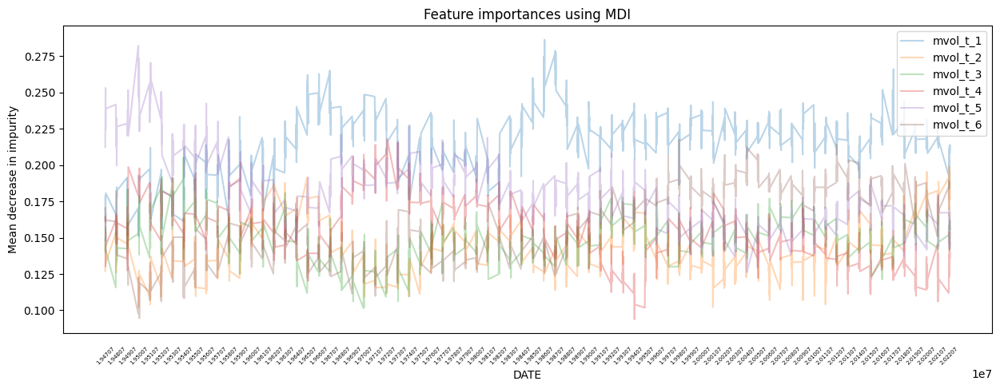

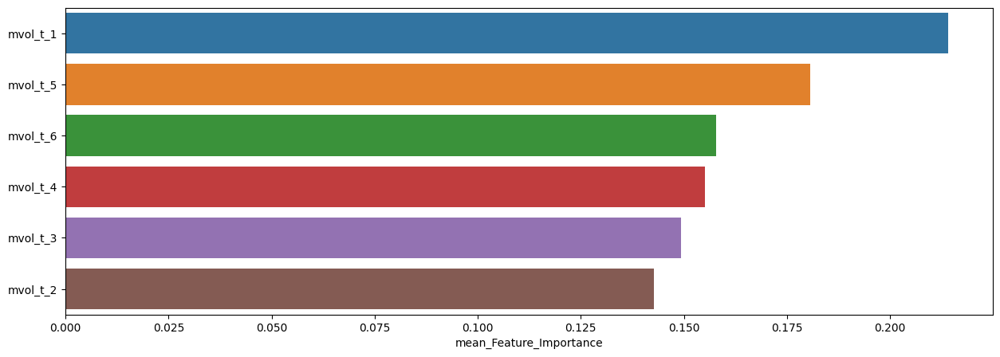

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,0.214206,0.286298,0.147525
mvol_t_5,0.180677,0.282266,0.126191
mvol_t_6,0.157774,0.217646,0.094523
mvol_t_4,0.155119,0.217986,0.093772
mvol_t_3,0.149407,0.205255,0.101436
mvol_t_2,0.142815,0.199082,0.102003


In [52]:
Expanding_GBC_Result = Roling_Windows(data=dynmom, # 사용할 데이터
                                      window_size=240, # window size (훈련 데이터 셋 크기)
                                      method='Expanding', # Rolling Winodw Method (Fixed or Expanding)
                                      model=GBC, # 사용할 모델
                                      model_name='GBC', # 사용한 모델 명
                                      plot=True, # 모델 성능 지표 시각화 여부
                                      plot_feature=True) # 모델의 변수 중요도 시각화 여부


**************************************************

DATE : 19470731 ~ 19660429

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.31      0.25      0.28        75
         1.0       0.66      0.72      0.69       151

    accuracy                           0.57       226
   macro avg       0.49      0.49      0.48       226
weighted avg       0.54      0.57      0.55       226


accuracy : 0.5663716814159292

precision : 0.6606060606060606

recall : 0.7218543046357616

F1-Score : 0.689873417721519



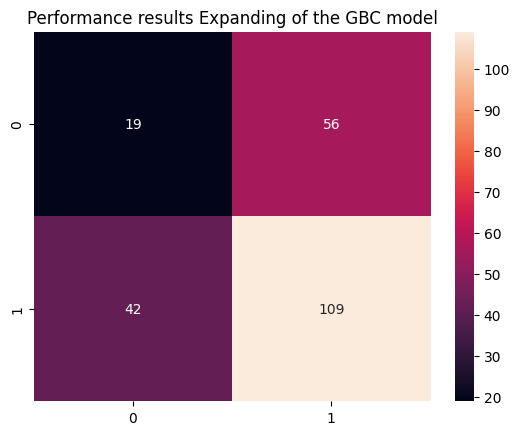


Feature Importance of the model



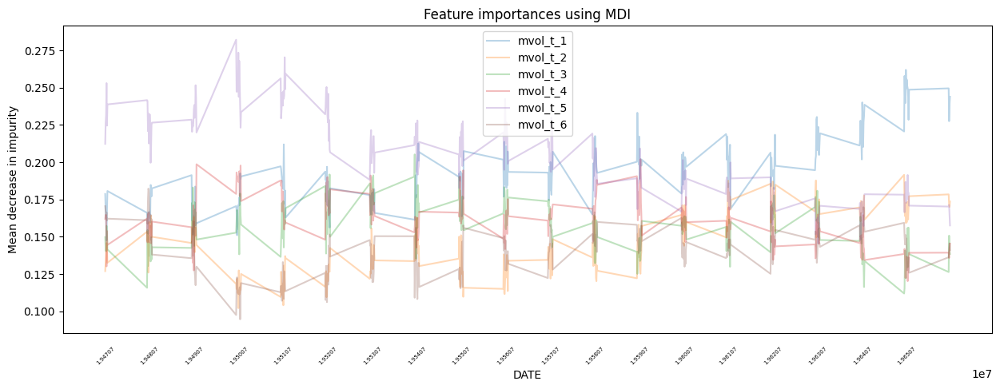

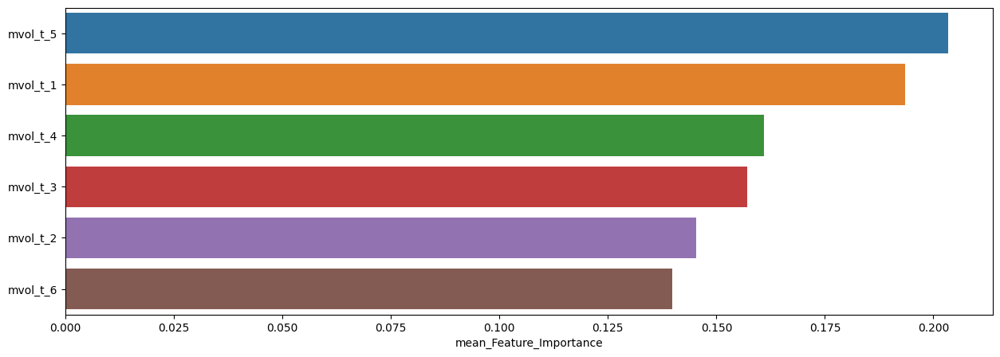

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_5,0.203476,0.282266,0.145445
mvol_t_1,0.193521,0.262023,0.147525
mvol_t_4,0.160940,0.201959,0.120125
mvol_t_3,0.157006,0.205255,0.111856
mvol_t_2,0.145324,0.191553,0.102003
mvol_t_6,0.139733,0.182272,0.094523



**************************************************

DATE : 19660531 ~ 19850228

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.51      0.35      0.41        75
         1.0       0.72      0.83      0.77       151

    accuracy                           0.67       226
   macro avg       0.61      0.59      0.59       226
weighted avg       0.65      0.67      0.65       226


accuracy : 0.672566371681416

precision : 0.72

recall : 0.8344370860927153

F1-Score : 0.7730061349693251



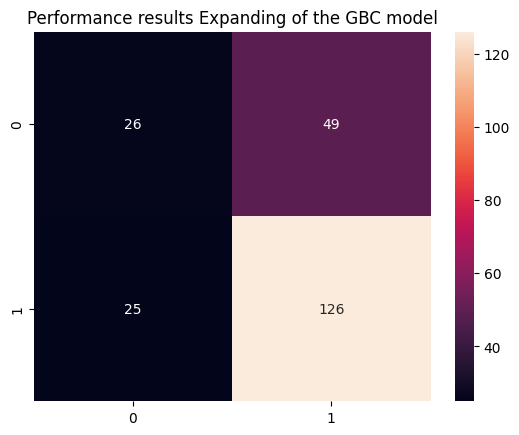


Feature Importance of the model



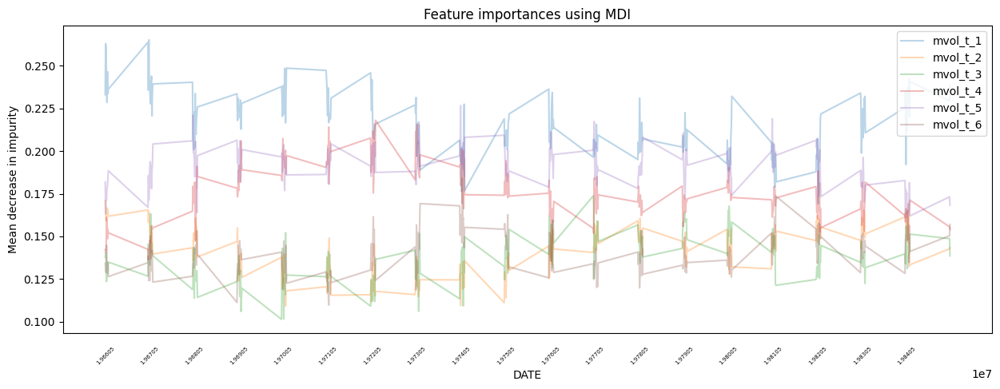

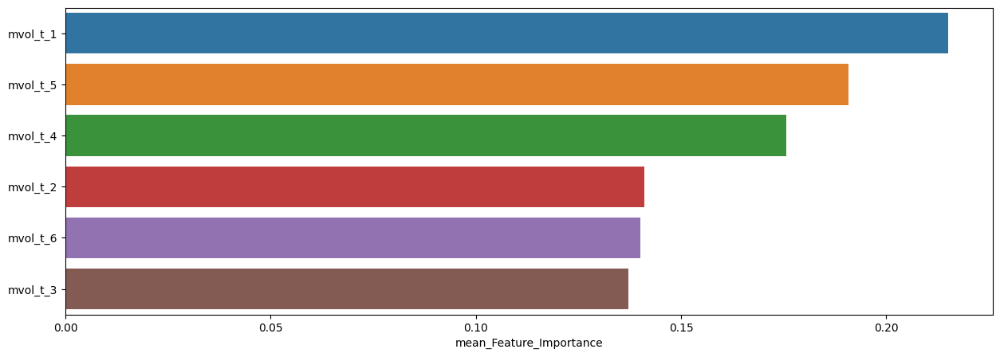

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,0.215165,0.265107,0.169128
mvol_t_5,0.190850,0.226607,0.161110
mvol_t_4,0.175573,0.217986,0.135588
mvol_t_2,0.141069,0.171028,0.109304
mvol_t_6,0.140109,0.184178,0.109837
mvol_t_3,0.137234,0.173779,0.101436



**************************************************

DATE : 19850329 ~ 20031231

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.40      0.26      0.31        70
         1.0       0.71      0.83      0.77       156

    accuracy                           0.65       226
   macro avg       0.56      0.54      0.54       226
weighted avg       0.62      0.65      0.63       226


accuracy : 0.6504424778761062

precision : 0.712707182320442

recall : 0.8269230769230769

F1-Score : 0.7655786350148367



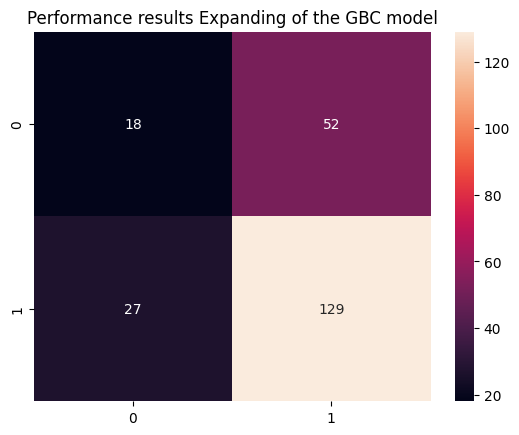


Feature Importance of the model



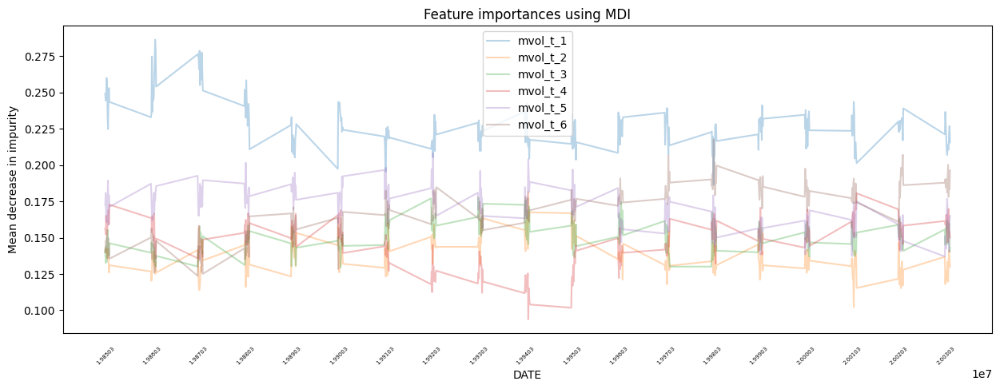

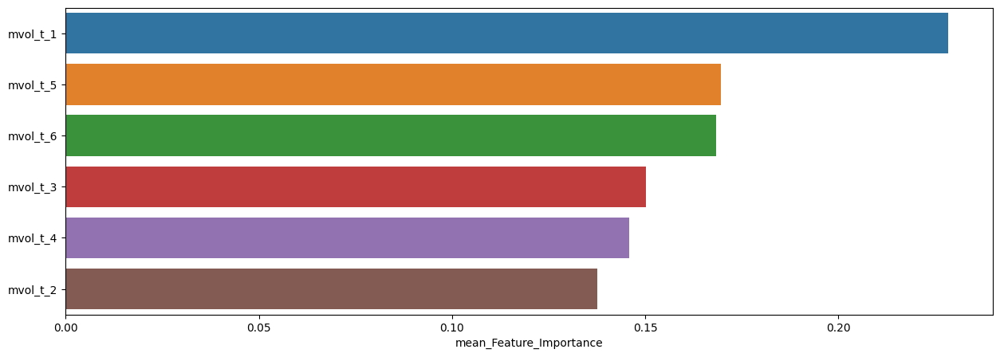

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,0.228447,0.286298,0.186318
mvol_t_5,0.169663,0.208079,0.137046
mvol_t_6,0.168238,0.217646,0.123629
mvol_t_3,0.150178,0.177521,0.129366
mvol_t_4,0.145823,0.180577,0.093772
mvol_t_2,0.137650,0.181577,0.102147



**************************************************

DATE : 20040130 ~ 20221230

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.42      0.21      0.28        96
         1.0       0.58      0.79      0.67       132

    accuracy                           0.54       228
   macro avg       0.50      0.50      0.47       228
weighted avg       0.51      0.54      0.50       228


accuracy : 0.543859649122807

precision : 0.5777777777777777

recall : 0.7878787878787878

F1-Score : 0.6666666666666666



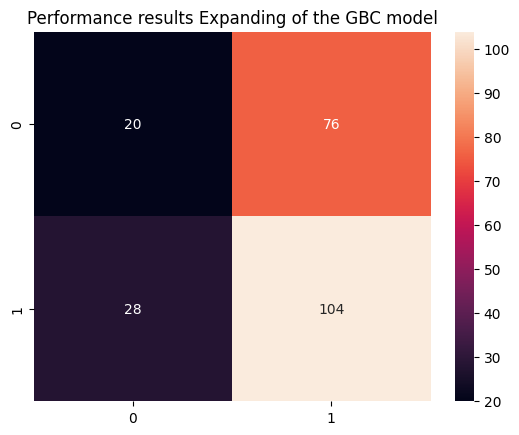


Feature Importance of the model



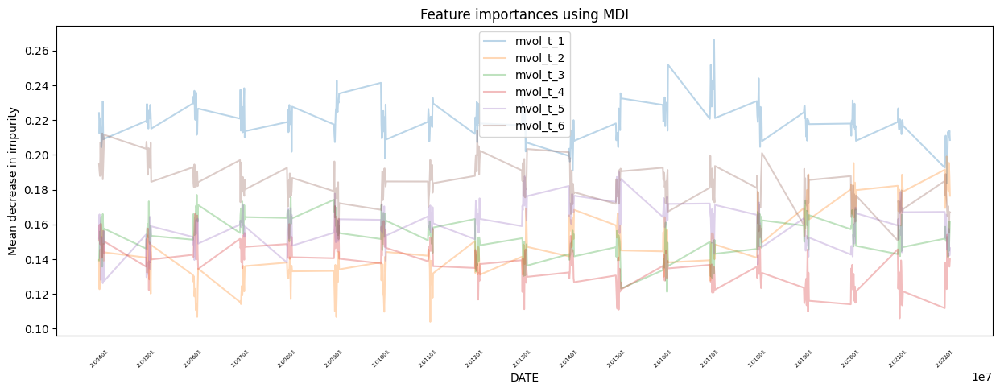

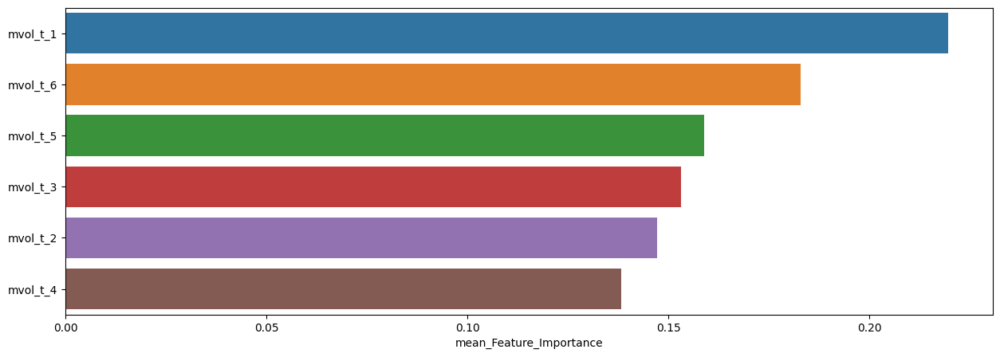

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,0.219643,0.266014,0.183705
mvol_t_6,0.182796,0.214193,0.150789
mvol_t_5,0.158913,0.190018,0.126191
mvol_t_3,0.153178,0.176974,0.121202
mvol_t_2,0.147179,0.199082,0.103978
mvol_t_4,0.138291,0.170503,0.106018


In [53]:
slice_feature_importance(Expanding_GBC_Result, # 모델 추론 결과 데이터
                         4, # 나눌 구간 수 (If None : 특정 구간 입력) 
                         'Expanding', # Rolling Windows Method
                         'GBC') # 모델 명


IQR 기준 WML 이상치 (Maximum 미만) 개수

Number of Outlier by IQR (Maximum) : 16
Maximum by IQR : 0.1670798809375
Max Outlier : 0.3301628157
Min Outlier : 0.1709176029

ACTUAL = PRED = 1



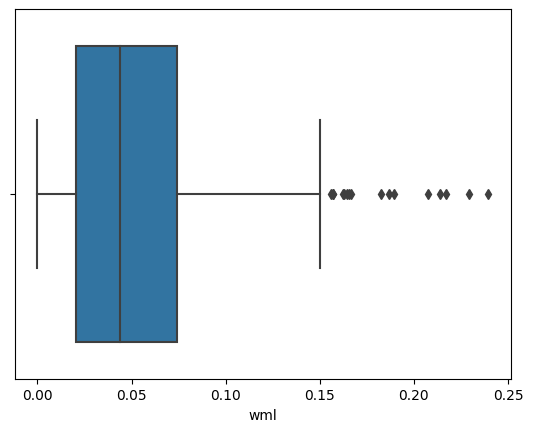

,count,mean,std,min,25%,50%,75%,max
wml,468.0,0.053515,0.043136,0.000007,0.020619,0.043888,0.074379,0.239571



--------------------------------------------------------------------------------


IQR 기준 WML 이상치 (Minimum 미만) 개수

Number of Outlier by IQR (Minimum) : 40
Minimun by IQR : -0.1267517369625
Max Outlier : -0.127277386
Min Outlier : -0.469903035

ACTUAL = PRED = 0



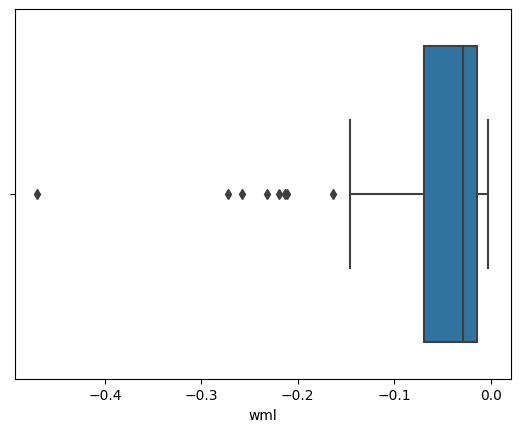

,count,mean,std,min,25%,50%,75%,max
wml,83.0,-0.060717,0.078065,-0.469903,-0.068906,-0.028629,-0.014213,-0.002394



--------------------------------------------------------------------------------


ACTUAL = 0 &  PRED = 1



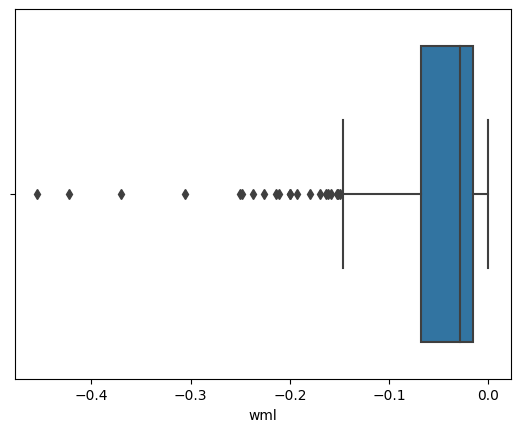

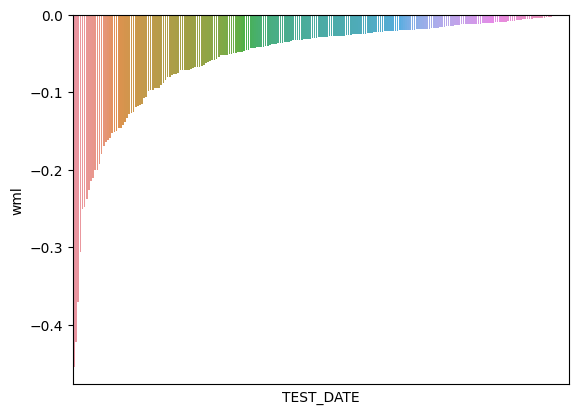

,count,mean,std,min,25%,50%,75%,max
wml,233.0,-0.054742,0.068749,-0.454349,-0.067824,-0.028532,-0.015103,-0.000132



--------------------------------------------------------------------------------


ACTUAL = 1 &  PRED = 0



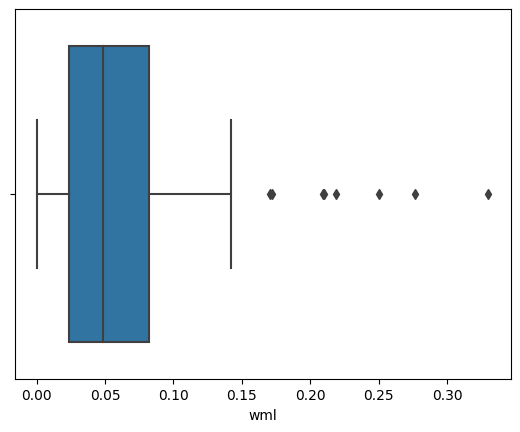

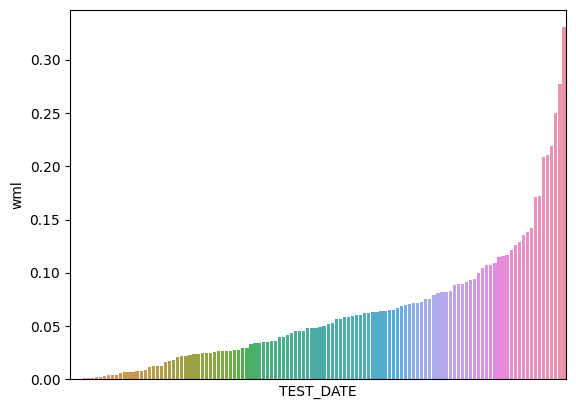

,count,mean,std,min,25%,50%,75%,max
wml,122.0,0.061906,0.058556,0.000577,0.023571,0.048756,0.081836,0.330163


In [54]:
GBC_A0_P1, GBC_A1_P0 = What_Pred(Expanding_GBC_Result, WML, 'GBC')

Sharpe Ratio : 0.68644

최근 누적 수익률

  2022년-12월 -> 26249.14
  2022년-11월 -> 23649.92
  2022년-10월 -> 22496.02
  2022년-09월 -> 22496.02
  2022년-08월 -> 20452.13

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2009년-02월 -> 37538.31
  2등 : 2002년-09월 -> 36766.81
  3등 : 2009년-01월 -> 33425.25
  4등 : 2008년-11월 -> 33207.23
  5등 : 2008년-12월 -> 32421.23
  6등 : 2002년-07월 -> 31088.42
  7등 : 2002년-08월 -> 31088.42
  8등 : 2001년-09월 -> 30793.52
  9등 : 2007년-12월 -> 30416.21
  10등 : 2008년-06월 -> 30282.13



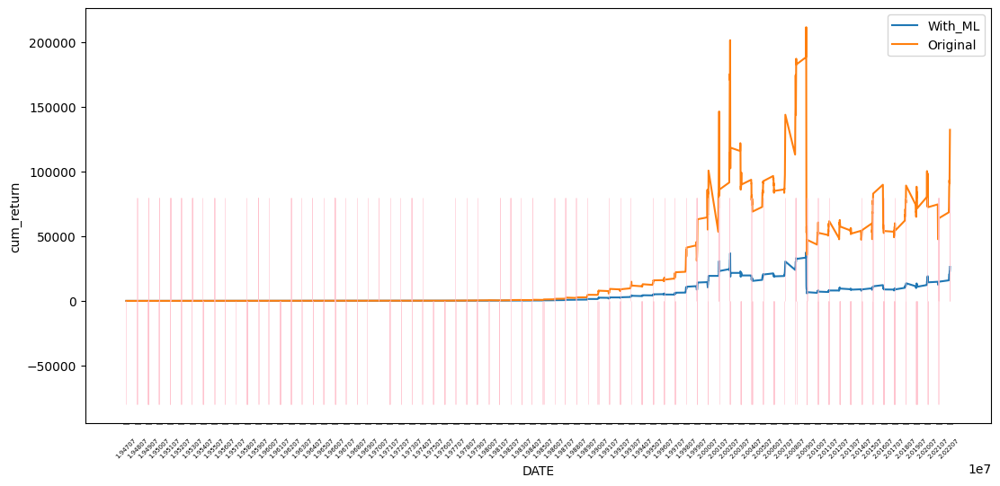

In [55]:
GBC_E_CUM_RETURN_static = cumm_return_by_dynamic(Expanding_GBC_Result,
                                                 WML,
                                                 'GBC_PRED_POS_WML',
                                                 GBC_A0_P1,
                                                 GBC_A1_P0,
                                                 plot=True)

Sharpe Ratio : 0.73552

최근 누적 수익률

  2022년-12월 -> 8258.14
  2022년-11월 -> 7644.64
  2022년-10월 -> 7450.53
  2022년-09월 -> 7059.04
  2022년-08월 -> 6661.36

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2009년-02월 -> 8793.57
  2등 : 2022년-12월 -> 8258.14
  3등 : 2008년-11월 -> 8074.94
  4등 : 2009년-01월 -> 8064.13
  5등 : 2008년-12월 -> 7914.81
  6등 : 2002년-09월 -> 7759.05
  7등 : 2022년-11월 -> 7644.64
  8등 : 2008년-06월 -> 7583.32
  9등 : 2008년-10월 -> 7496.46
  10등 : 2022년-10월 -> 7450.53



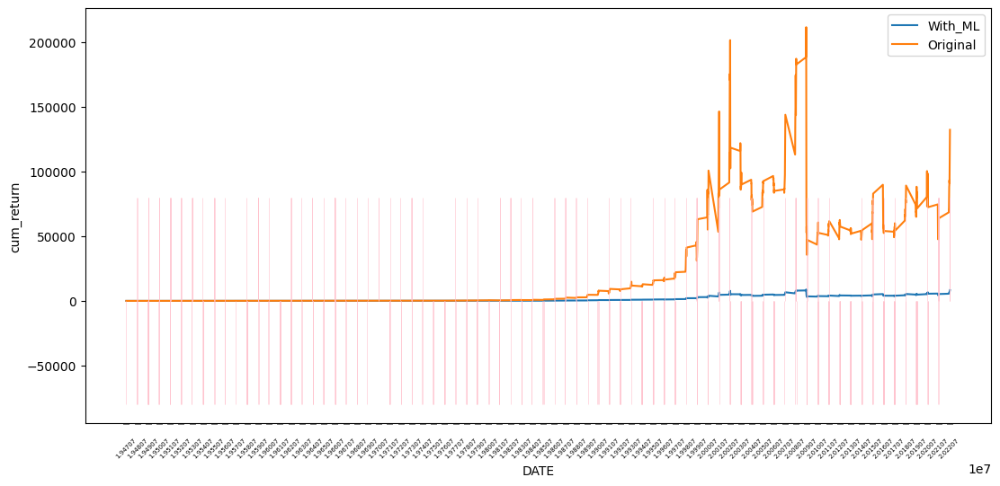

In [56]:
GBC_E_CUM_RETURN_dynamic = cumm_return_by_dynamic(Expanding_GBC_Result,
                                                  WML,
                                                  'GBC_PROB_POS_WML',
                                                  GBC_A0_P1,
                                                  GBC_A1_P0,
                                                  plot=True)

### XGB

In [57]:
XGB_Param = {}
XGB = XGBClassifier(**XGB_Param, random_state=42)

**************************************************

XGB Model의 Rolling Expanding Window를 실행합니다

설정된 Model의 하이퍼파리미터 : 

   objective : binary:logistic
   use_label_encoder : None
   base_score : None
   booster : None
   callbacks : None
   colsample_bylevel : None
   colsample_bynode : None
   colsample_bytree : None
   early_stopping_rounds : None
   enable_categorical : False
   eval_metric : None
   feature_types : None
   gamma : None
   gpu_id : None
   grow_policy : None
   importance_type : None
   interaction_constraints : None
   learning_rate : None
   max_bin : None
   max_cat_threshold : None
   max_cat_to_onehot : None
   max_delta_step : None
   max_depth : None
   max_leaves : None
   min_child_weight : None
   missing : nan
   monotone_constraints : None
   n_estimators : 100
   n_jobs : None
   num_parallel_tree : None
   predictor : None
   random_state : 42
   reg_alpha : None
   reg_lambda : None
   sampling_method : None
   scale_pos_weight : None
   subsample : No

  0%|          | 0/906 [00:00<?, ?it/s]


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.39      0.36      0.37       316
         1.0       0.67      0.71      0.69       590

    accuracy                           0.58       906
   macro avg       0.53      0.53      0.53       906
weighted avg       0.57      0.58      0.58       906


accuracy : 0.5838852097130243

precision : 0.6720516962843296

recall : 0.7050847457627119

F1-Score : 0.6881720430107527



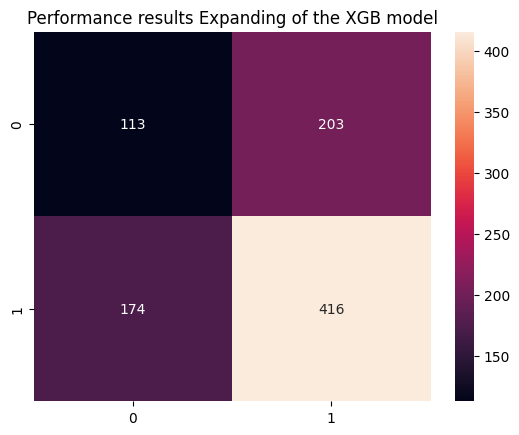


Feature Importance of the model



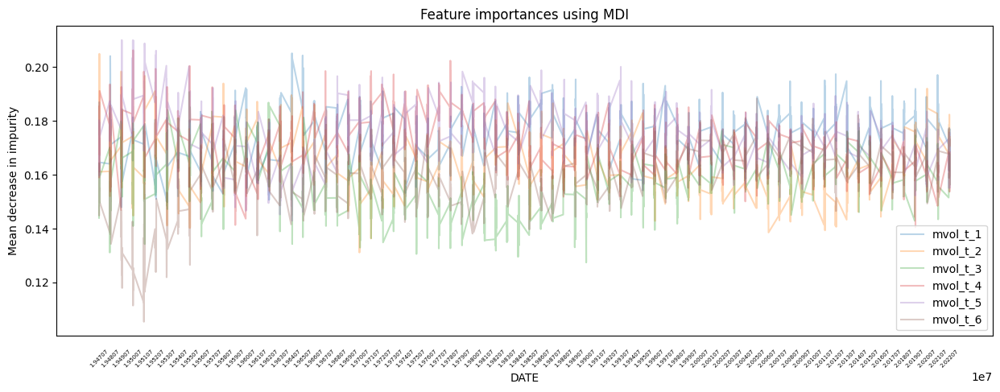

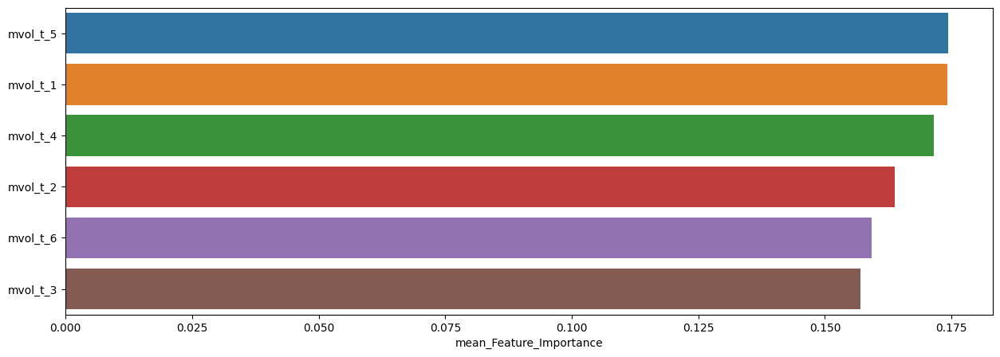

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_5,0.174404,0.210102,0.142914
mvol_t_1,0.174165,0.205174,0.147931
mvol_t_4,0.171499,0.206293,0.140441
mvol_t_2,0.163721,0.204986,0.131092
mvol_t_6,0.159239,0.188388,0.105341
mvol_t_3,0.156971,0.190783,0.127383


In [58]:
Expanding_XGB_Result = Roling_Windows(data=dynmom, # 사용할 데이터
                                  window_size=240, # window size (훈련 데이터 셋 크기)
                                  method='Expanding', # Rolling Winodw Method (Fixed or Expanding)
                                  model=XGB, # 사용할 모델
                                  model_name='XGB', # 사용한 모델 명
                                  plot=True, # 모델 성능 지표 시각화 여부
                                  plot_feature=True) # 모델의 변수 중요도 시각화 여부


**************************************************

DATE : 19470731 ~ 19660429

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.42      0.39      0.40        75
         1.0       0.71      0.74      0.72       151

    accuracy                           0.62       226
   macro avg       0.56      0.56      0.56       226
weighted avg       0.61      0.62      0.62       226


accuracy : 0.6194690265486725

precision : 0.7070063694267515

recall : 0.7350993377483444

F1-Score : 0.7207792207792207



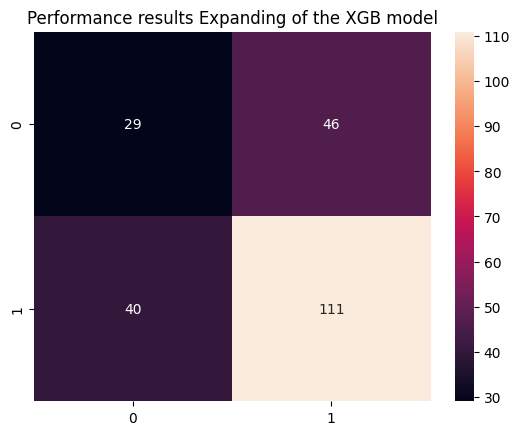


Feature Importance of the model



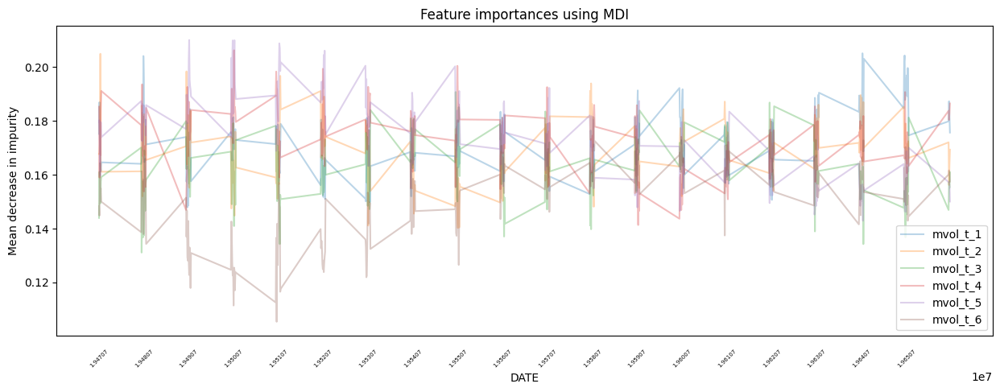

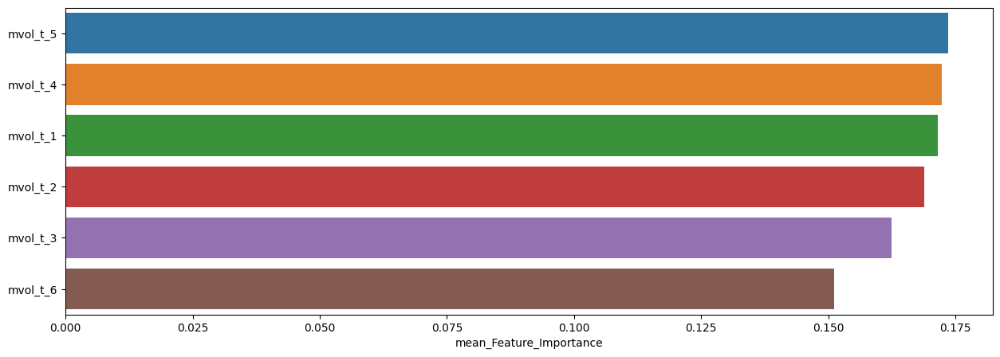

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_5,0.173628,0.210102,0.142914
mvol_t_4,0.172331,0.206293,0.141322
mvol_t_1,0.171607,0.205174,0.147931
mvol_t_2,0.168816,0.204986,0.140236
mvol_t_3,0.162415,0.190783,0.131072
mvol_t_6,0.151204,0.181493,0.105341



**************************************************

DATE : 19660531 ~ 19850228

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.39      0.39      0.39        75
         1.0       0.70      0.70      0.70       151

    accuracy                           0.60       226
   macro avg       0.54      0.54      0.54       226
weighted avg       0.60      0.60      0.60       226


accuracy : 0.5973451327433629

precision : 0.6973684210526315

recall : 0.7019867549668874

F1-Score : 0.6996699669966997



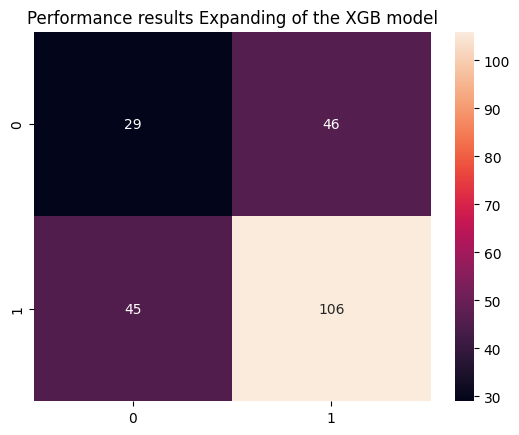


Feature Importance of the model



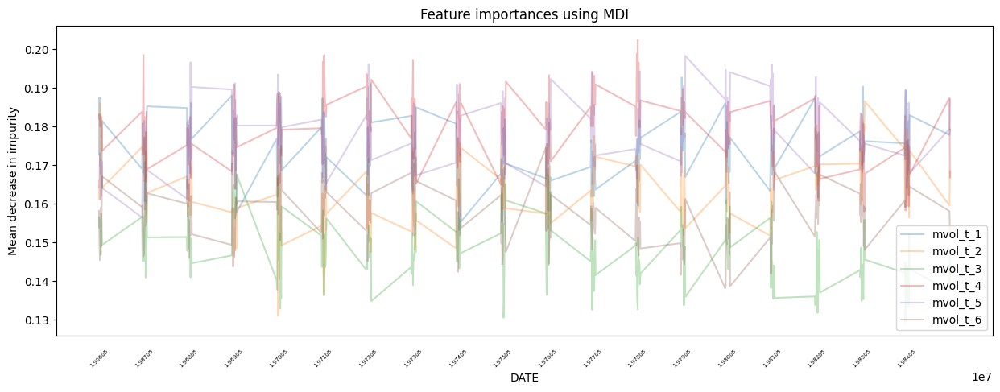

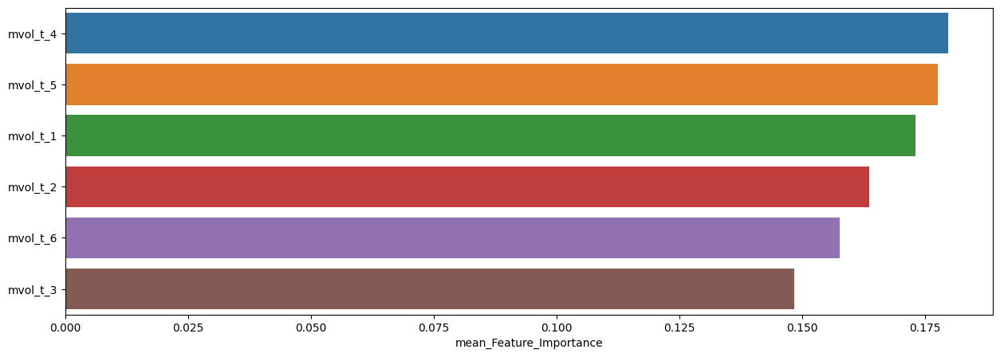

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_4,0.179760,0.202427,0.158063
mvol_t_5,0.177521,0.198377,0.156506
mvol_t_1,0.173091,0.192755,0.153215
mvol_t_2,0.163573,0.186630,0.131092
mvol_t_6,0.157680,0.182885,0.138116
mvol_t_3,0.148375,0.170847,0.129460



**************************************************

DATE : 19850329 ~ 20031231

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.41      0.40      0.40        70
         1.0       0.73      0.74      0.73       156

    accuracy                           0.63       226
   macro avg       0.57      0.57      0.57       226
weighted avg       0.63      0.63      0.63       226


accuracy : 0.6327433628318584

precision : 0.732484076433121

recall : 0.7371794871794872

F1-Score : 0.7348242811501596



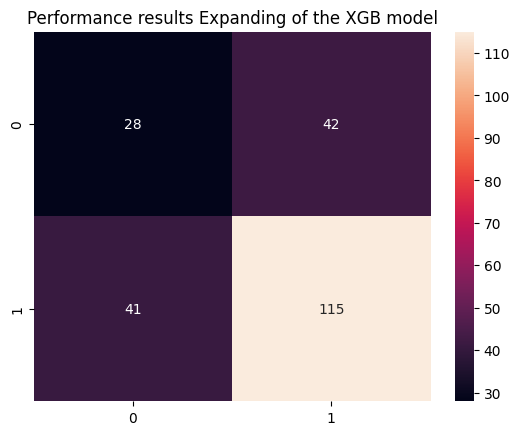


Feature Importance of the model



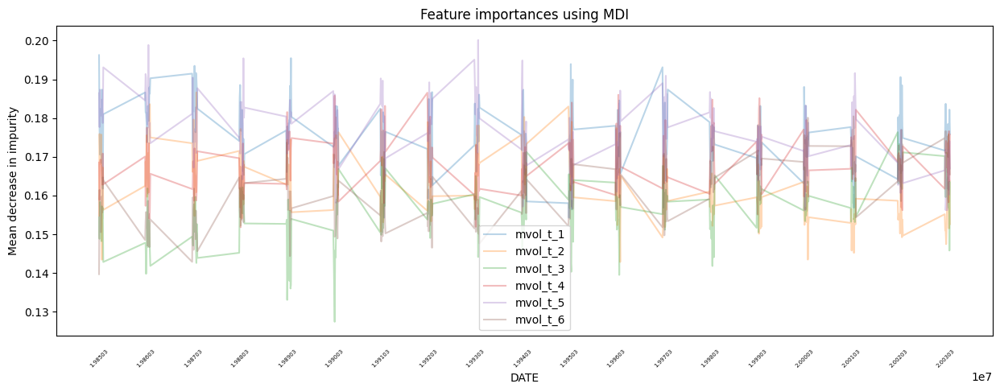

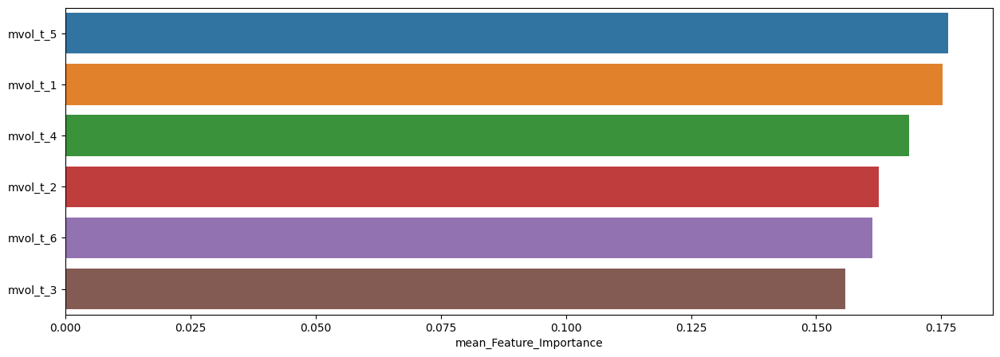

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_5,0.176444,0.200154,0.156168
mvol_t_1,0.175286,0.196257,0.154246
mvol_t_4,0.168653,0.186550,0.151810
mvol_t_2,0.162461,0.186618,0.142830
mvol_t_6,0.161316,0.180449,0.139673
mvol_t_3,0.155840,0.176347,0.127383



**************************************************

DATE : 20040130 ~ 20221230

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.36      0.28      0.32        96
         1.0       0.55      0.64      0.59       132

    accuracy                           0.49       228
   macro avg       0.45      0.46      0.45       228
weighted avg       0.47      0.49      0.47       228


accuracy : 0.4868421052631579

precision : 0.5490196078431373

recall : 0.6363636363636364

F1-Score : 0.5894736842105264



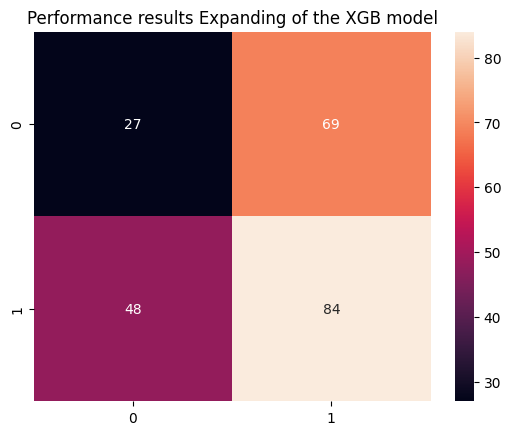


Feature Importance of the model



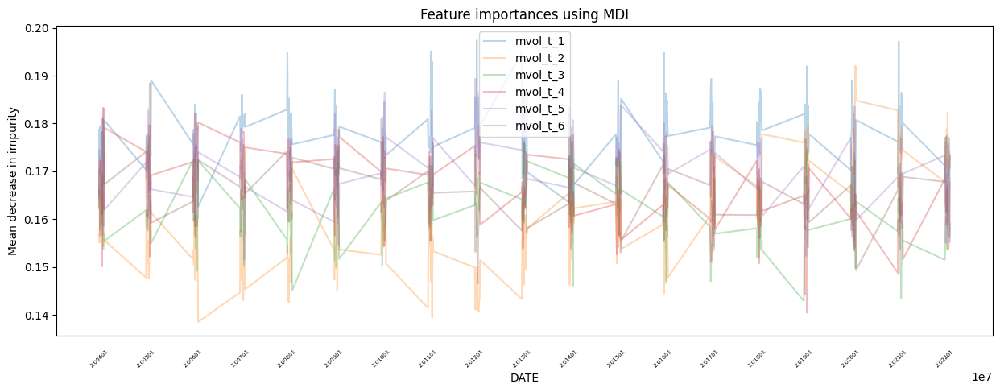

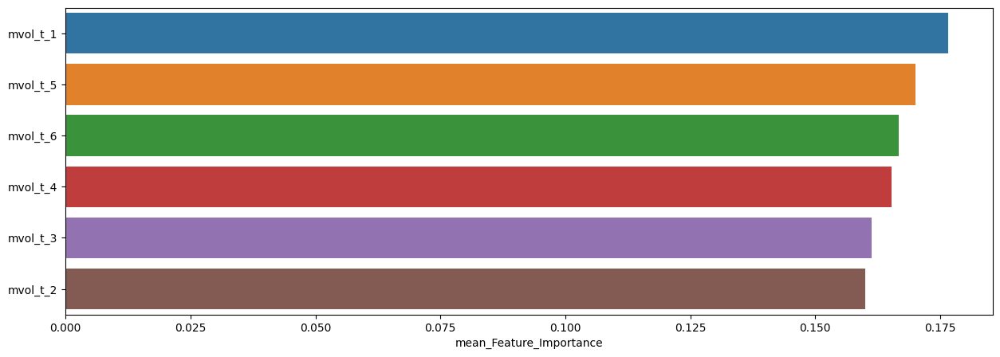

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,0.176655,0.197433,0.158542
mvol_t_5,0.170062,0.189340,0.151541
mvol_t_6,0.166692,0.188388,0.146498
mvol_t_4,0.165308,0.183286,0.140441
mvol_t_3,0.161220,0.176329,0.142882
mvol_t_2,0.160064,0.192072,0.138531


In [59]:
slice_feature_importance(Expanding_XGB_Result, # 모델 추론 결과 데이터
                         4, # 나눌 구간 수 (If None : 특정 구간 입력) 
                         'Expanding', # Rolling Windows Method
                         'XGB') # 모델 명


IQR 기준 WML 이상치 (Maximum 미만) 개수

Number of Outlier by IQR (Maximum) : 16
Maximum by IQR : 0.1670798809375
Max Outlier : 0.3301628157
Min Outlier : 0.1709176029

ACTUAL = PRED = 1



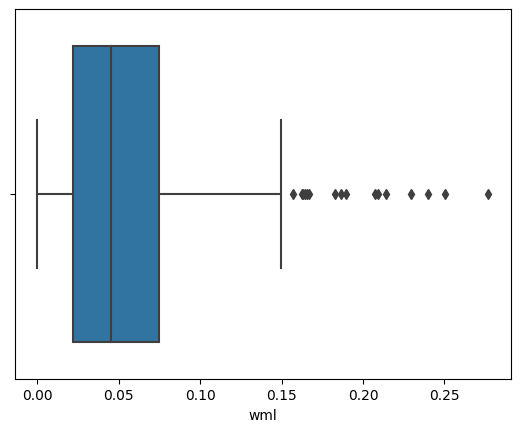

,count,mean,std,min,25%,50%,75%,max
wml,416.0,0.054488,0.045312,0.000007,0.021786,0.045009,0.074379,0.276912



--------------------------------------------------------------------------------


IQR 기준 WML 이상치 (Minimum 미만) 개수

Number of Outlier by IQR (Minimum) : 40
Minimun by IQR : -0.1267517369625
Max Outlier : -0.127277386
Min Outlier : -0.469903035

ACTUAL = PRED = 0



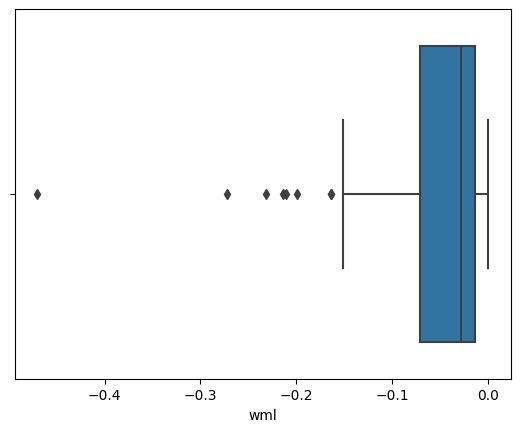

,count,mean,std,min,25%,50%,75%,max
wml,113.0,-0.05546,0.068653,-0.469903,-0.071461,-0.028629,-0.013911,-0.000132



--------------------------------------------------------------------------------


ACTUAL = 0 &  PRED = 1



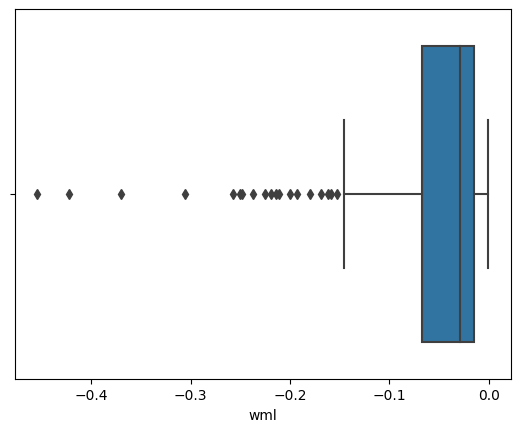

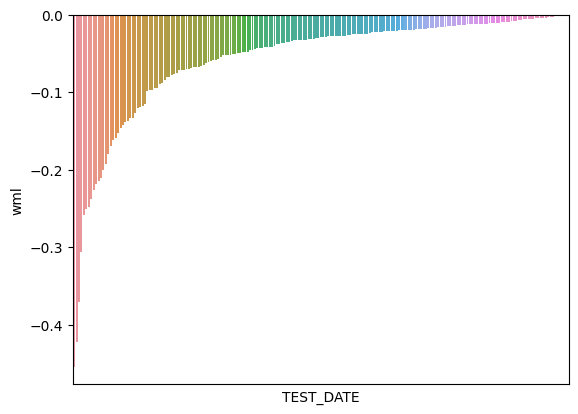

,count,mean,std,min,25%,50%,75%,max
wml,203.0,-0.056785,0.072796,-0.454349,-0.067737,-0.028532,-0.015196,-0.000506



--------------------------------------------------------------------------------


ACTUAL = 1 &  PRED = 0



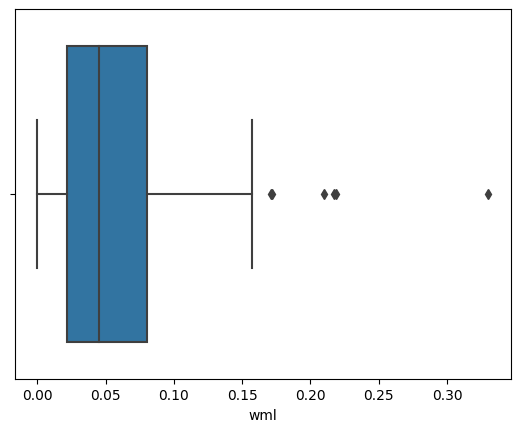

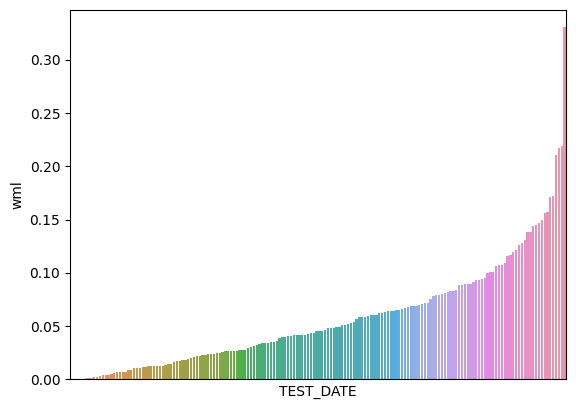

,count,mean,std,min,25%,50%,75%,max
wml,174.0,0.057071,0.050305,0.000128,0.0215,0.045349,0.080301,0.330163


In [60]:
XGB_A0_P1, XGB_A1_P0 = What_Pred(Expanding_XGB_Result, WML, 'XGB')

Sharpe Ratio : 0.65061

최근 누적 수익률

  2022년-12월 -> 9139.73
  2022년-11월 -> 8234.64
  2022년-10월 -> 8234.64
  2022년-09월 -> 7291.55
  2022년-08월 -> 7291.55

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2002년-09월 -> 21102.49
  2등 : 2001년-09월 -> 19429.85
  3등 : 2002년-08월 -> 17843.28
  4등 : 2002년-07월 -> 17843.28
  5등 : 2002년-10월 -> 17026.42
  6등 : 2002년-06월 -> 16917.77
  7등 : 2009년-02월 -> 16249.66
  8등 : 2001년-08월 -> 16092.54
  9등 : 2002년-02월 -> 15177.40
  10등 : 2008년-11월 -> 14819.93



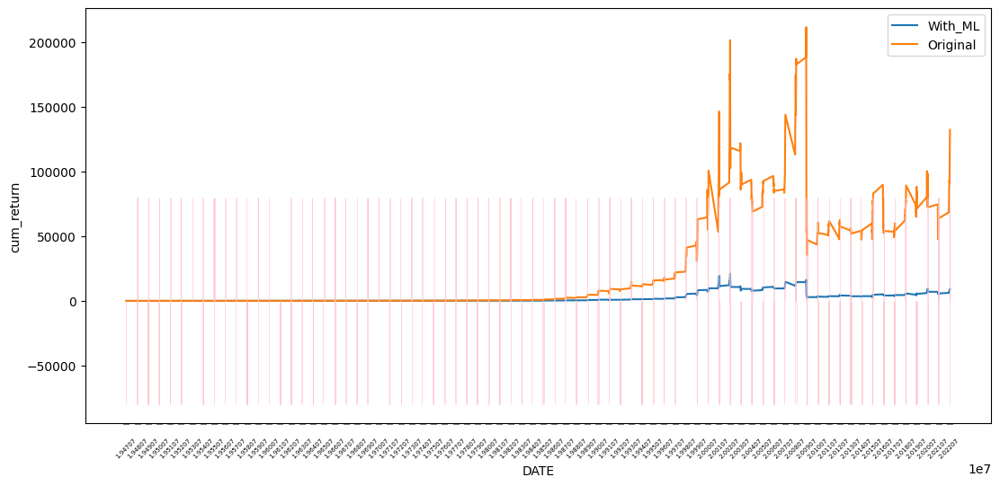

In [61]:
XGB_E_CUM_RETURN_static = cumm_return_by_dynamic(Expanding_XGB_Result,
                                                 WML,
                                                 'XGB_PRED_POS_WML',
                                                 XGB_A0_P1,
                                                 XGB_A1_P0,
                                                 plot=True)

Sharpe Ratio : 0.68069

최근 누적 수익률

  2022년-12월 -> 21573.05
  2022년-11월 -> 19855.21
  2022년-10월 -> 19388.63
  2022년-09월 -> 17794.69
  2022년-08월 -> 17067.64

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2009년-02월 -> 24339.99
  2등 : 2002년-09월 -> 22285.41
  3등 : 2008년-11월 -> 22197.96
  4등 : 2009년-01월 -> 22058.19
  5등 : 2008년-12월 -> 21773.61
  6등 : 2022년-12월 -> 21573.05
  7등 : 2008년-10월 -> 21038.80
  8등 : 2008년-09월 -> 20819.10
  9등 : 2008년-06월 -> 20313.55
  10등 : 2008년-07월 -> 19924.62



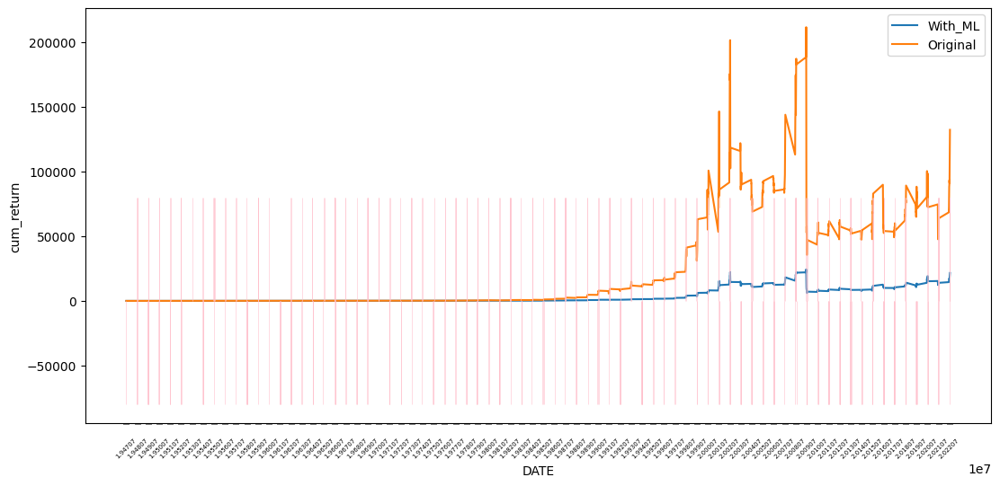

In [62]:
XGB_E_CUM_RETURN_dynamic = cumm_return_by_dynamic(Expanding_XGB_Result,
                                                 WML,
                                                 'XGB_PROB_POS_WML',
                                                 XGB_A0_P1,
                                                 XGB_A1_P0,
                                                 plot=True)

### LGBM

In [63]:
LGBM_param = {}
LGBM = LGBMClassifier(**LGBM_param, random_state=42)

**************************************************

LGBM Model의 Rolling Expanding Window를 실행합니다

설정된 Model의 하이퍼파리미터 : 

   boosting_type : gbdt
   class_weight : None
   colsample_bytree : 1.0
   importance_type : split
   learning_rate : 0.1
   max_depth : -1
   min_child_samples : 20
   min_child_weight : 0.001
   min_split_gain : 0.0
   n_estimators : 100
   n_jobs : -1
   num_leaves : 31
   objective : None
   random_state : 42
   reg_alpha : 0.0
   reg_lambda : 0.0
   silent : warn
   subsample : 1.0
   subsample_for_bin : 200000
   subsample_freq : 0

**************************************************


  0%|          | 0/906 [00:00<?, ?it/s]


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.40      0.35      0.37       316
         1.0       0.67      0.72      0.70       590

    accuracy                           0.59       906
   macro avg       0.54      0.53      0.54       906
weighted avg       0.58      0.59      0.58       906


accuracy : 0.5905077262693157

precision : 0.6740858505564388

recall : 0.7186440677966102

F1-Score : 0.6956521739130436



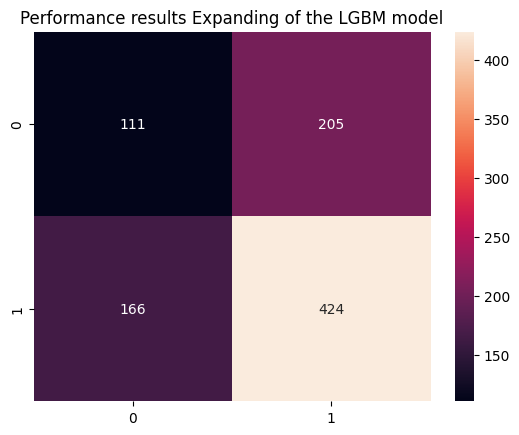


Feature Importance of the model



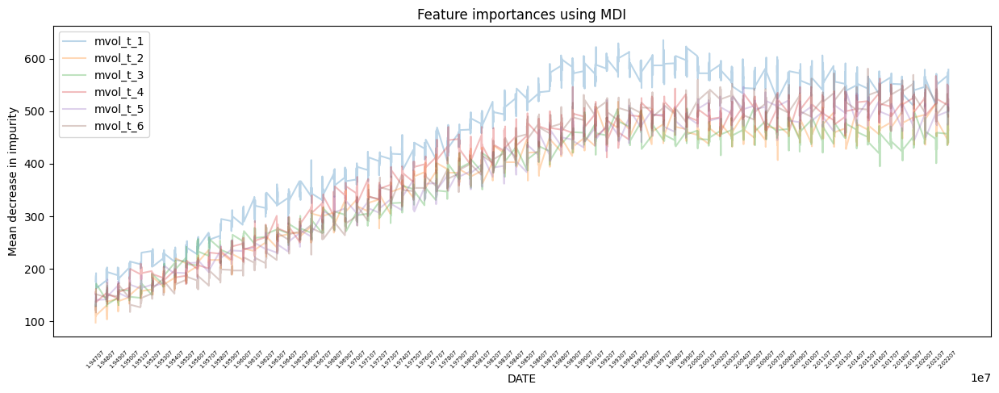

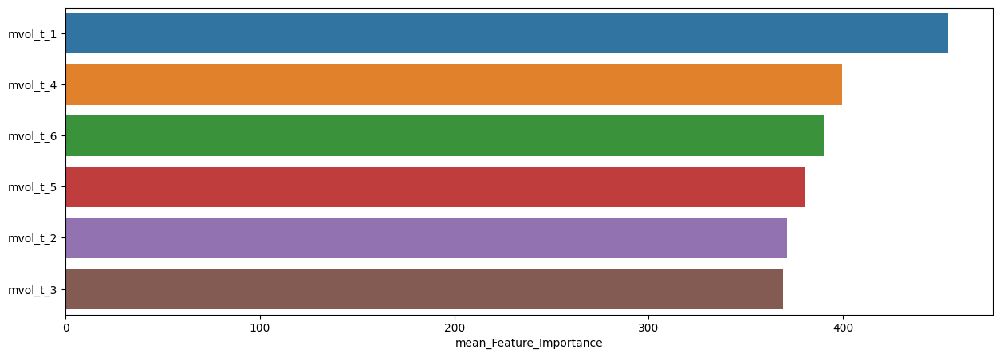

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,454.256071,635,163
mvol_t_4,399.496689,567,133
mvol_t_6,390.064018,581,117
mvol_t_5,380.326711,546,129
mvol_t_2,371.076159,518,98
mvol_t_3,369.008830,509,129


In [64]:
Expanding_LGBM_Result = Roling_Windows(data=dynmom, # 사용할 데이터
                                    window_size=240, # window size (훈련 데이터 셋 크기)
                                    method='Expanding', # Rolling Winodw Method (Fixed or Expanding)
                                    model=LGBM, # 사용할 모델
                                    model_name='LGBM', # 사용한 모델 명
                                    plot=True, # 모델 성능 지표 시각화 여부
                                    plot_feature=True) # 모델의 변수 중요도 시각화 여부


**************************************************

DATE : 19470731 ~ 19660429

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.37      0.33      0.35        75
         1.0       0.69      0.72      0.70       151

    accuracy                           0.59       226
   macro avg       0.53      0.53      0.53       226
weighted avg       0.58      0.59      0.59       226


accuracy : 0.5929203539823009

precision : 0.6855345911949685

recall : 0.7218543046357616

F1-Score : 0.7032258064516129



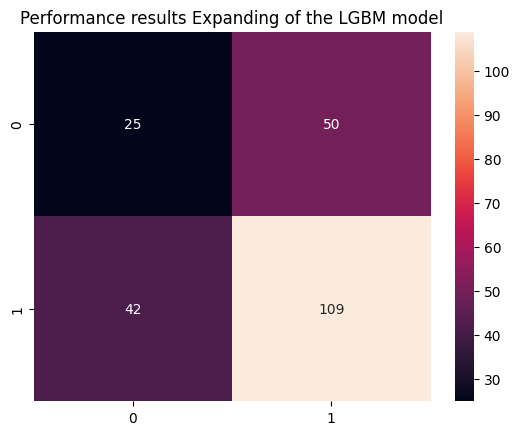


Feature Importance of the model



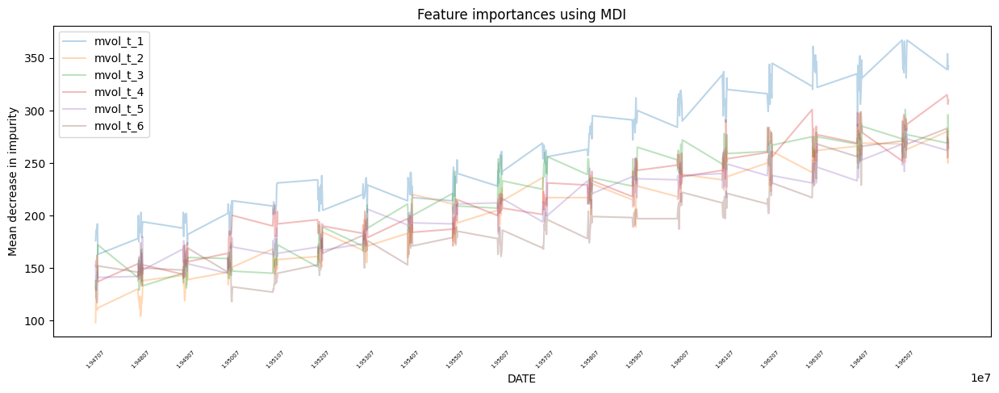

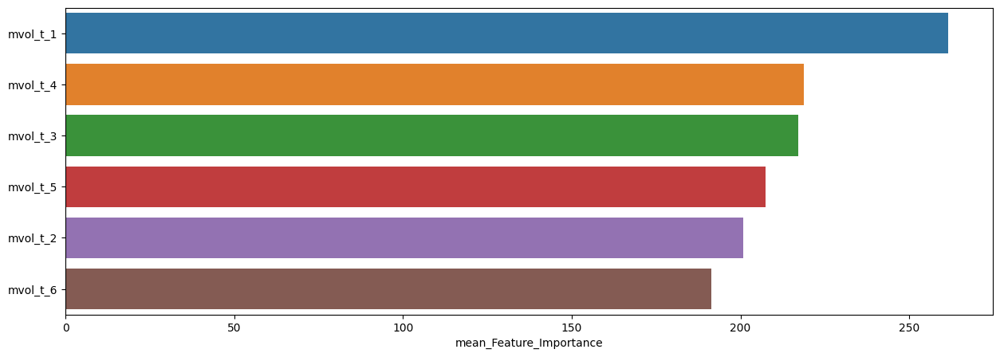

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,261.646018,367,163
mvol_t_4,218.721239,315,133
mvol_t_3,217.199115,301,129
mvol_t_5,207.415929,283,129
mvol_t_2,200.867257,281,98
mvol_t_6,191.464602,290,117



**************************************************

DATE : 19660531 ~ 19850228

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.41      0.40      0.40        75
         1.0       0.70      0.71      0.71       151

    accuracy                           0.61       226
   macro avg       0.55      0.55      0.55       226
weighted avg       0.60      0.61      0.61       226


accuracy : 0.6061946902654868

precision : 0.7039473684210527

recall : 0.7086092715231788

F1-Score : 0.7062706270627063



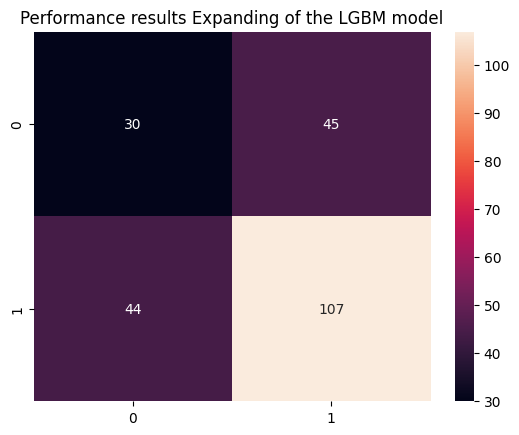


Feature Importance of the model



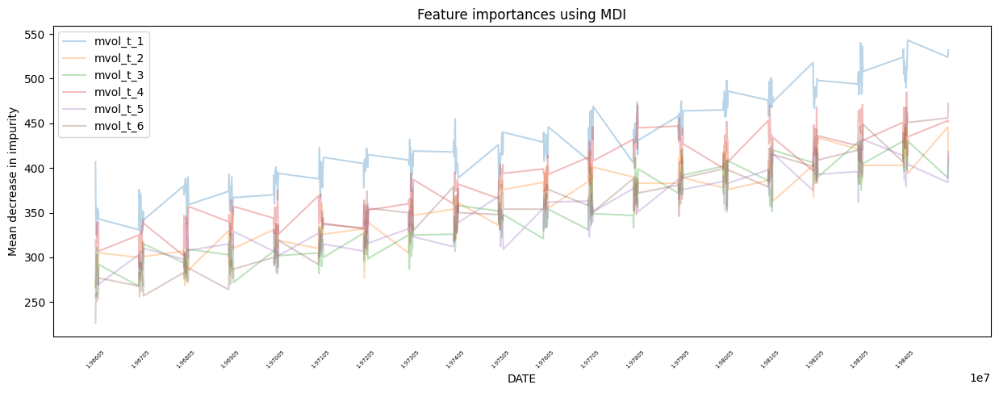

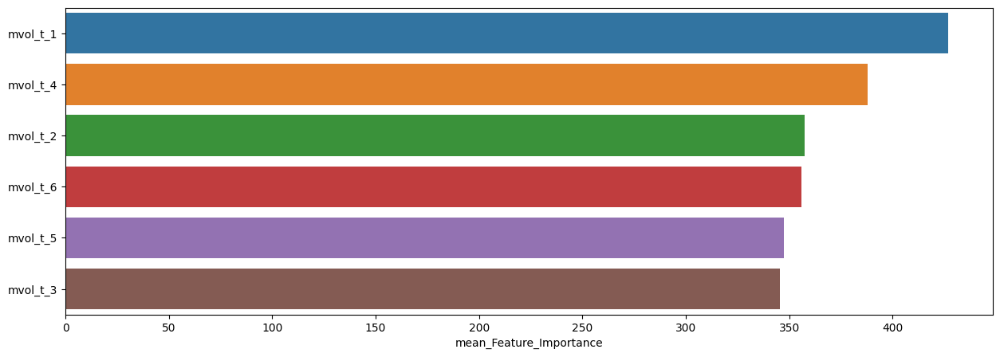

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,427.057522,543,325
mvol_t_4,388.057522,485,288
mvol_t_2,357.623894,446,266
mvol_t_6,356.075221,472,227
mvol_t_5,347.460177,432,256
mvol_t_3,345.544248,449,256



**************************************************

DATE : 19850329 ~ 20031231

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.42      0.39      0.40        70
         1.0       0.73      0.76      0.75       156

    accuracy                           0.65       226
   macro avg       0.58      0.57      0.58       226
weighted avg       0.64      0.65      0.64       226


accuracy : 0.6460176991150443

precision : 0.7345679012345679

recall : 0.7628205128205128

F1-Score : 0.7484276729559749



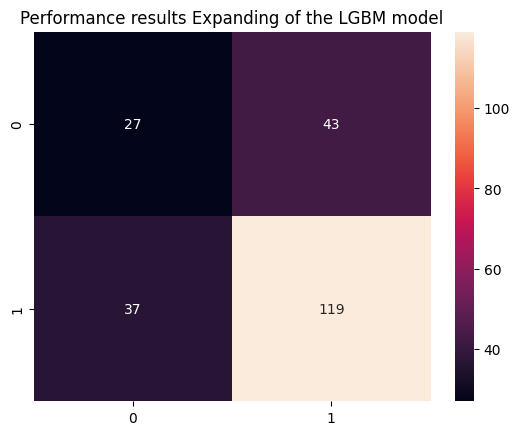


Feature Importance of the model



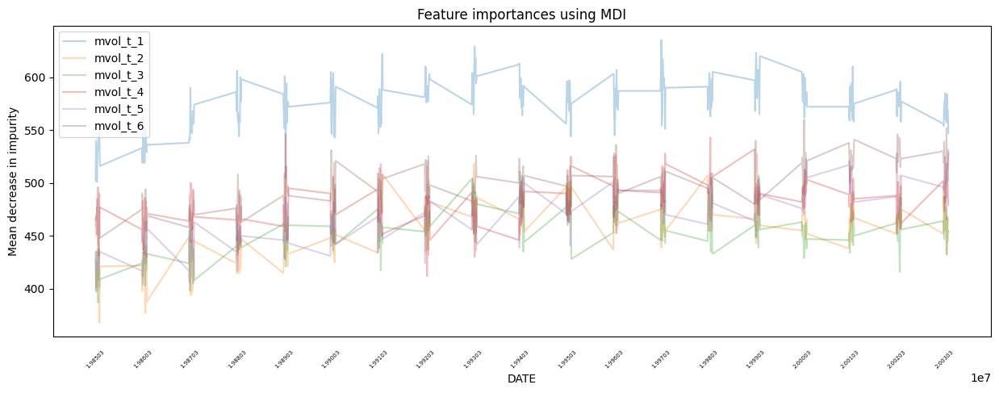

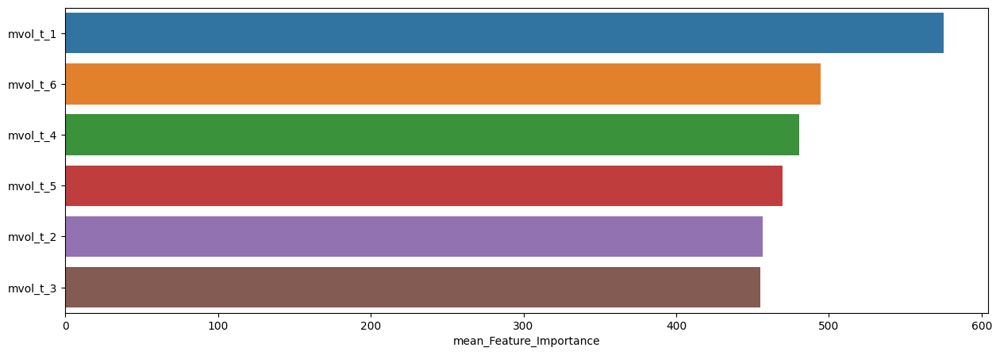

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,575.336283,635,501
mvol_t_6,494.663717,560,430
mvol_t_4,480.442478,546,412
mvol_t_5,469.893805,528,397
mvol_t_2,456.530973,518,368
mvol_t_3,455.287611,507,387



**************************************************

DATE : 20040130 ~ 20221230

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.40      0.30      0.35        96
         1.0       0.57      0.67      0.62       132

    accuracy                           0.52       228
   macro avg       0.49      0.49      0.48       228
weighted avg       0.50      0.52      0.50       228


accuracy : 0.5175438596491229

precision : 0.5705128205128205

recall : 0.6742424242424242

F1-Score : 0.6180555555555556



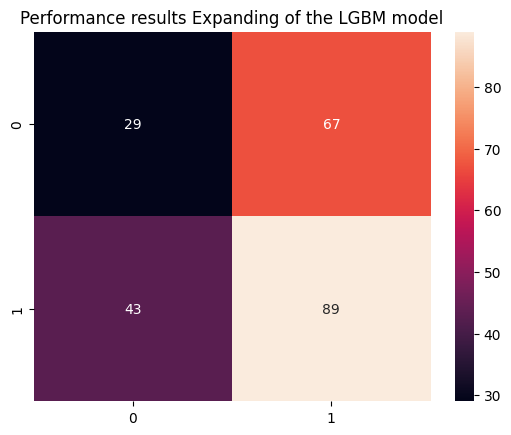


Feature Importance of the model



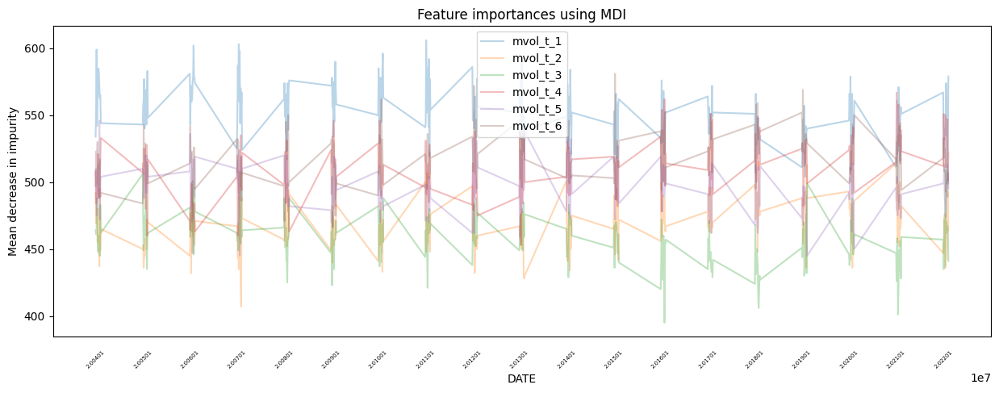

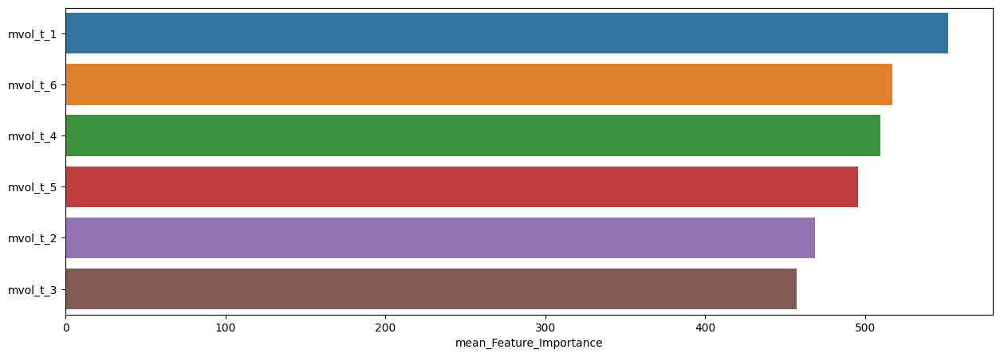

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,552.118421,606,499
mvol_t_6,516.929825,581,447
mvol_t_4,509.789474,567,453
mvol_t_5,495.517544,546,445
mvol_t_2,468.421053,518,407
mvol_t_3,457.223684,509,395


In [65]:
slice_feature_importance(Expanding_LGBM_Result, # 모델 추론 결과 데이터
                        4, # 나눌 구간 수 (If None : 특정 구간 입력) 
                        'Expanding', # Rolling Windows Method
                        'LGBM') # 모델 명


IQR 기준 WML 이상치 (Maximum 미만) 개수

Number of Outlier by IQR (Maximum) : 16
Maximum by IQR : 0.1670798809375
Max Outlier : 0.3301628157
Min Outlier : 0.1709176029

ACTUAL = PRED = 1



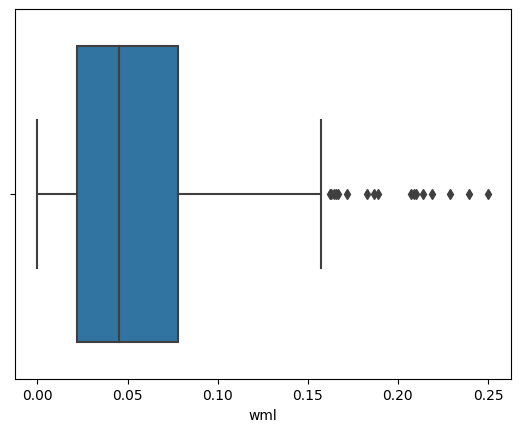

,count,mean,std,min,25%,50%,75%,max
wml,424.0,0.055822,0.046235,0.000007,0.021945,0.045319,0.077935,0.250175



--------------------------------------------------------------------------------


IQR 기준 WML 이상치 (Minimum 미만) 개수

Number of Outlier by IQR (Minimum) : 40
Minimun by IQR : -0.1267517369625
Max Outlier : -0.127277386
Min Outlier : -0.469903035

ACTUAL = PRED = 0



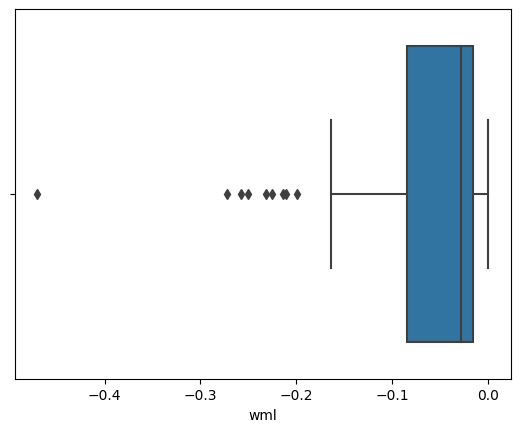

,count,mean,std,min,25%,50%,75%,max
wml,111.0,-0.061946,0.075139,-0.469903,-0.084753,-0.028971,-0.015839,-0.000132



--------------------------------------------------------------------------------


ACTUAL = 0 &  PRED = 1



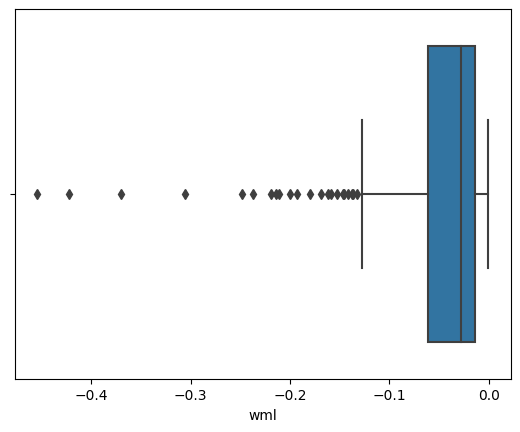

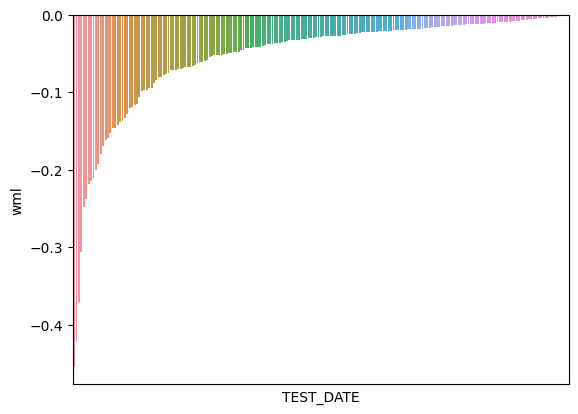

,count,mean,std,min,25%,50%,75%,max
wml,205.0,-0.05326,0.069025,-0.454349,-0.061666,-0.028115,-0.014203,-0.000506



--------------------------------------------------------------------------------


ACTUAL = 1 &  PRED = 0



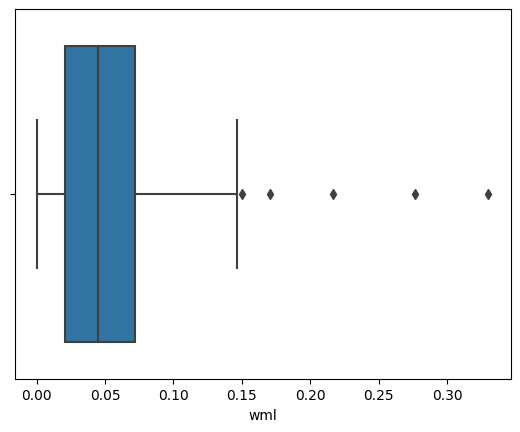

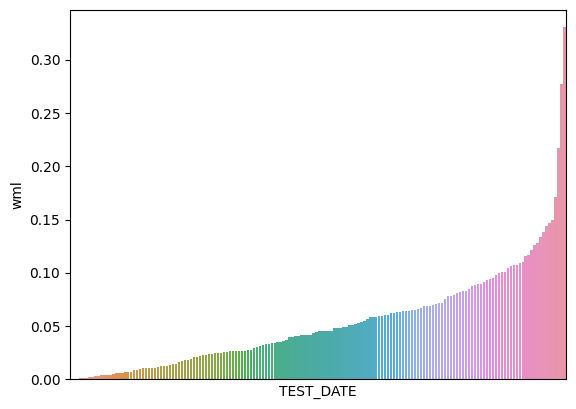

,count,mean,std,min,25%,50%,75%,max
wml,166.0,0.053788,0.048363,0.000577,0.021033,0.044623,0.072033,0.330163


In [66]:
LGBM_A0_P1, LGBM_A1_P0 = What_Pred(Expanding_LGBM_Result,
                                   WML,
                                   'LGBM')

Sharpe Ratio : 0.62278

최근 누적 수익률

  2022년-12월 -> 47612.95
  2022년-11월 -> 47612.95
  2022년-10월 -> 47612.95
  2022년-09월 -> 42160.55
  2022년-08월 -> 38330.12

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2020년-09월 -> 49232.54
  2등 : 2020년-08월 -> 49232.54
  3등 : 2020년-10월 -> 49062.90
  4등 : 2009년-02월 -> 48349.56
  5등 : 2022년-12월 -> 47612.95
  6등 : 2022년-10월 -> 47612.95
  7등 : 2022년-11월 -> 47612.95
  8등 : 2002년-09월 -> 46262.93
  9등 : 2008년-11월 -> 44095.68
  10등 : 2020년-07월 -> 43537.56



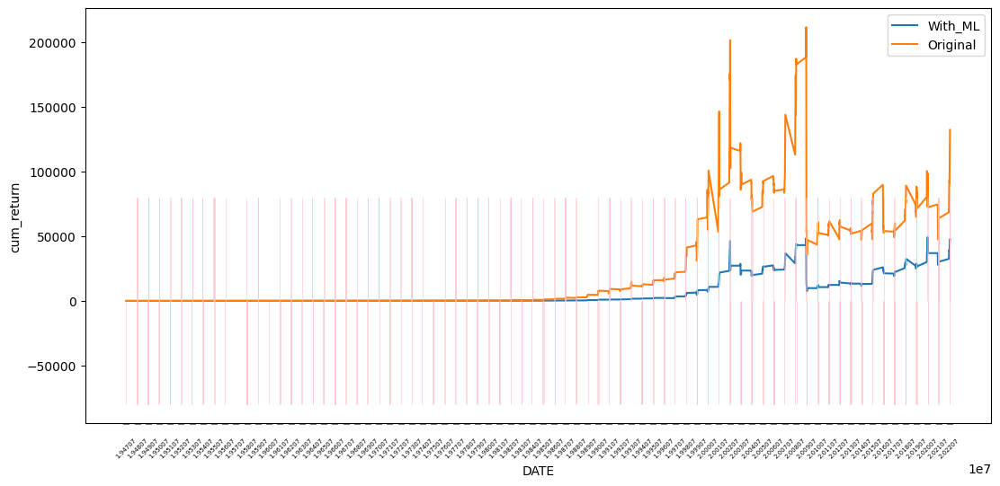

In [67]:
LGBM_E_CUM_RETURN_static = cumm_return_by_dynamic(Expanding_LGBM_Result, # 모델 추론 결과 데이터
                                                   WML, # 원본 데이터의 'wml' 데이터
                                                   'LGBM_PRED_POS_WML', # 모델 추론 결과 칼럼
                                                   LGBM_A0_P1,
                                                   LGBM_A1_P0,
                                                   plot=True) # 시각화 여부

Sharpe Ratio : 0.67179

최근 누적 수익률

  2022년-12월 -> 18360.59
  2022년-11월 -> 17457.74
  2022년-10월 -> 17213.80
  2022년-09월 -> 15433.98
  2022년-08월 -> 14694.97

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2009년-02월 -> 19647.05
  2등 : 2022년-12월 -> 18360.59
  3등 : 2008년-11월 -> 18195.49
  4등 : 2009년-01월 -> 18014.75
  5등 : 2008년-12월 -> 17846.25
  6등 : 2022년-11월 -> 17457.74
  7등 : 2022년-10월 -> 17213.80
  8등 : 2008년-10월 -> 17112.32
  9등 : 2008년-06월 -> 16991.60
  10등 : 2008년-09월 -> 16933.39



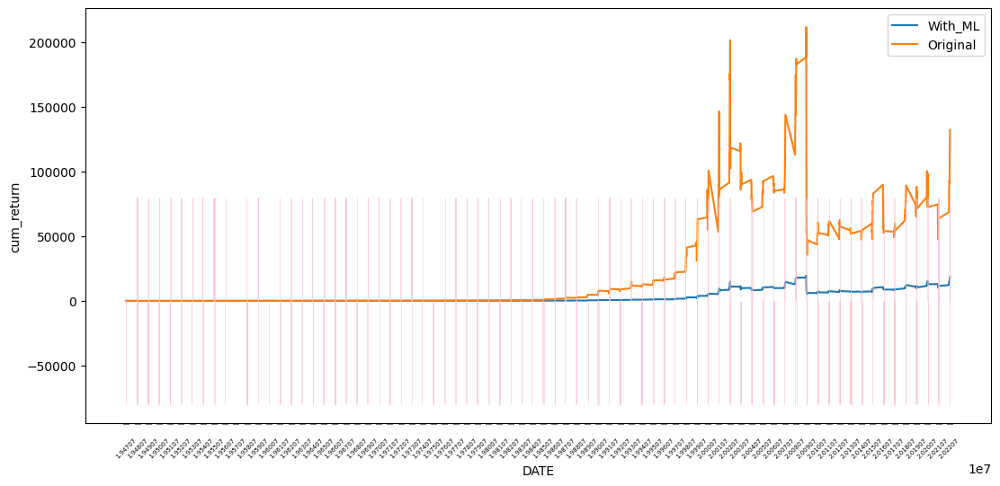

In [68]:
LGBM_E_CUM_RETURN_dynamic = cumm_return_by_dynamic(Expanding_LGBM_Result, # 모델 추론 결과 데이터
                                                   WML, # 원본 데이터의 'wml' 데이터
                                                   'LGBM_PROB_POS_WML', # 모델 추론 결과 칼럼
                                                   LGBM_A0_P1,
                                                   LGBM_A1_P0,
                                                   plot=True) # 시각화 여부

# Performance

## F1 - Score

RDF의 F1-Score : 0.7265563435776201
GBC의 F1-Score : 0.7023519870235198
XGB의 F1-Score : 0.7018121911037891
LGBM의 F1-Score : 0.7149837133550488



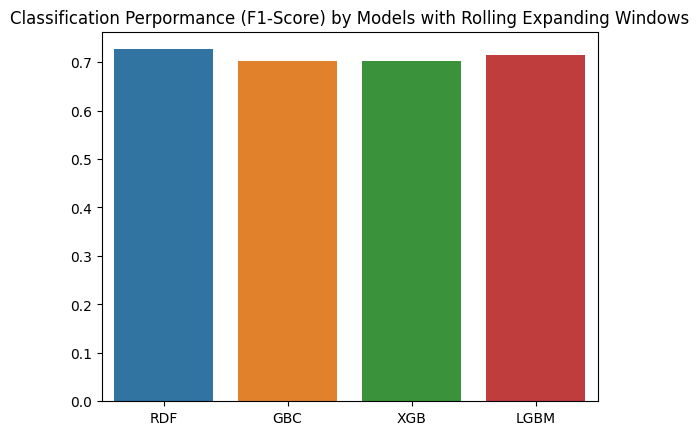

In [69]:
list_model = ['RDF', 'GBC', 'XGB', 'LGBM']
list_result = [Fixed_RDF_Result, Fixed_GBC_Result, Fixed_XGB_Result, Fixed_LGBM_Result]

list_f1 = []

for model, data in zip(list_model, list_result):
  F1 = f1_score(data['Actual_POS_WML'], data[f'{model}_PRED_POS_WML'])
  print(f'{model}의 F1-Score : {F1}')
  list_f1.append(F1)
print()

sns.barplot(x=list_model, y=list_f1)
plt.title('Classification Perpormance (F1-Score) by Models with Rolling Expanding Windows')
plt.show()

RDF의 F1-Score : 0.7109004739336493
GBC의 F1-Score : 0.7250193648334625
XGB의 F1-Score : 0.6881720430107527
LGBM의 F1-Score : 0.6956521739130436



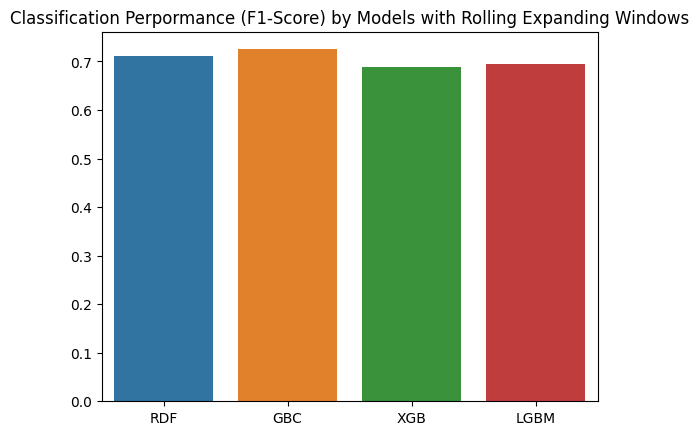

In [70]:
list_model = ['RDF', 'GBC', 'XGB', 'LGBM']
list_result = [Expanding_RDF_Result, Expanding_GBC_Result, Expanding_XGB_Result, Expanding_LGBM_Result]

list_f1 = []

for model, data in zip(list_model, list_result):
  F1 = f1_score(data['Actual_POS_WML'], data[f'{model}_PRED_POS_WML'])
  print(f'{model}의 F1-Score : {F1}')
  list_f1.append(F1)
print()

sns.barplot(x=list_model, y=list_f1)
plt.title('Classification Perpormance (F1-Score) by Models with Rolling Expanding Windows')
plt.show()

## Cum Return & Sharpe Ratio

In [71]:
R_WML = WML.loc[19470731:].copy()
CUM_WML = WML.loc[19470731:].copy()

CUM_WML['wml'] = (1 + CUM_WML.wml).cumprod() - 1
CUM_WML.columns = ['cum_return'] 

last_r = CUM_WML['cum_return'].values[-1]
w_S = (R_WML['wml'].mean()/R_WML['wml'].std()) * math.sqrt(12)

In [72]:
def compare_sharpe_ratio(list_model, list_result, list_cum, dynamic=True):

  print('{} Sharpe Ratio : {:0.4f}  최종 누적 수익률 : {}'.format('ORG', w_S, last_r))

  for model, data, cum in zip(list_model, list_result, list_cum):
    data['wml'] = WML.loc[19470731:]['wml']

    if dynamic == True:

      data[f'{model}_PROB_WML'] = data['wml'] * data[f'{model}_PROB_POS_WML']
      S = (data[f'{model}_PROB_WML'].mean()/data[f'{model}_PROB_WML'].std())*math.sqrt(12)

      C = list(cum['cum_return'])[-1]
      print('{} Sharpe Ratio : {:0.4f}  최종 누적 수익률 : {}'.format(model, S, C))

      sns.lineplot(data=cum, x=data.index, y='cum_return', alpha=0.7, label=model)

    else:

      data[f'{model}_PRED_WML'] = data['wml'] * data[f'{model}_PRED_POS_WML']
      S = (data[f'{model}_PRED_WML'].mean()/data[f'{model}_PRED_WML'].std())*math.sqrt(12)

      C = list(cum['cum_return'])[-1]
      print('{} Sharpe Ratio : {:0.4f}  최종 누적 수익률 : {}'.format(model, S, C))
      
      sns.lineplot(data=cum, x=data.index, y='cum_return', alpha=0.7, label=model)

  sns.lineplot(data=CUM_WML, x=CUM_WML.index, y='cum_return', alpha=0.7, label='ORG')
  plt.title('Sharpe Ratio & Cum Return by Model')
  plt.xticks([CUM_WML.index[i] for i in range(0,len(CUM_WML.index), 12)])
  plt.tick_params(axis='x',
                    direction='out',
                    labelrotation=45,
                    length=1,
                    pad=10,
                    labelsize=1,
                    width=0.1)
  plt.show()

### Rolling Fixed Windows

#### Static

ORG Sharpe Ratio : 0.7293  최종 누적 수익률 : 132103.15024526353
RDF Sharpe Ratio : 0.6960  최종 누적 수익률 : 18336.058689884812
GBC Sharpe Ratio : 0.6589  최종 누적 수익률 : 9582.613159366405
XGB Sharpe Ratio : 0.7139  최종 누적 수익률 : 19669.609335850575
LGBM Sharpe Ratio : 0.7457  최종 누적 수익률 : 37160.73808780365


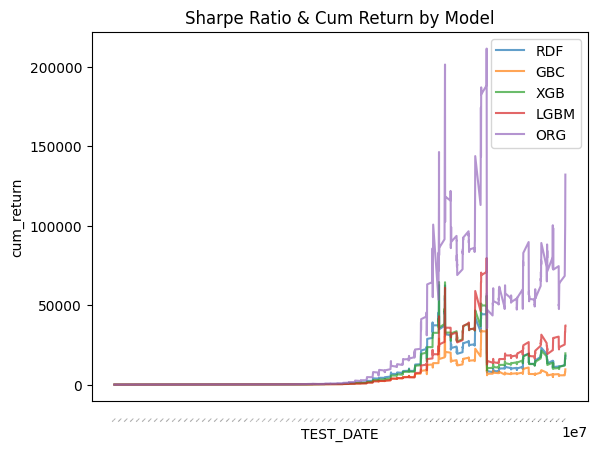

In [73]:
compare_sharpe_ratio(['RDF', 'GBC', 'XGB', 'LGBM'],
                     [Fixed_RDF_Result, Fixed_GBC_Result, Fixed_XGB_Result, Fixed_LGBM_Result],
                     [RDF_F_CUM_RETURN_static, GBC_F_CUM_RETURN_static, XGB_F_CUM_RETURN_static, LGBM_F_CUM_RETURN_static],
                     dynamic=False)

#### Dynamic

ORG Sharpe Ratio : 0.7293  최종 누적 수익률 : 132103.15024526353
RDF Sharpe Ratio : 0.7811  최종 누적 수익률 : 7260.900909361234
GBC Sharpe Ratio : 0.7382  최종 누적 수익률 : 7746.293873469884
XGB Sharpe Ratio : 0.7526  최종 누적 수익률 : 12838.213681553923
LGBM Sharpe Ratio : 0.8140  최종 누적 수익률 : 18334.071559465967


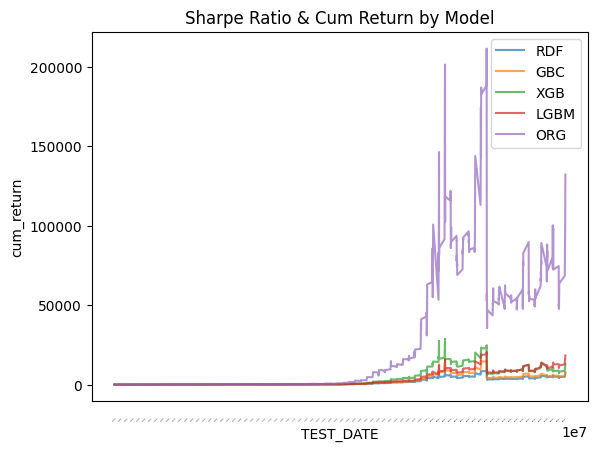

In [74]:
compare_sharpe_ratio(['RDF', 'GBC', 'XGB', 'LGBM'],
                     [Fixed_RDF_Result, Fixed_GBC_Result, Fixed_XGB_Result, Fixed_LGBM_Result],
                     [RDF_F_CUM_RETURN_dynamic, GBC_F_CUM_RETURN_dynamic, XGB_F_CUM_RETURN_dynamic, LGBM_F_CUM_RETURN_dynamic],
                     dynamic=True)

### Rolling Expanding Windows

#### Static

ORG Sharpe Ratio : 0.7293  최종 누적 수익률 : 132103.15024526353
RDF Sharpe Ratio : 0.7481  최종 누적 수익률 : 38942.67512336724
GBC Sharpe Ratio : 0.7217  최종 누적 수익률 : 26249.13972912783
XGB Sharpe Ratio : 0.6684  최종 누적 수익률 : 9139.732997583726
LGBM Sharpe Ratio : 0.7730  최종 누적 수익률 : 47612.95297537176


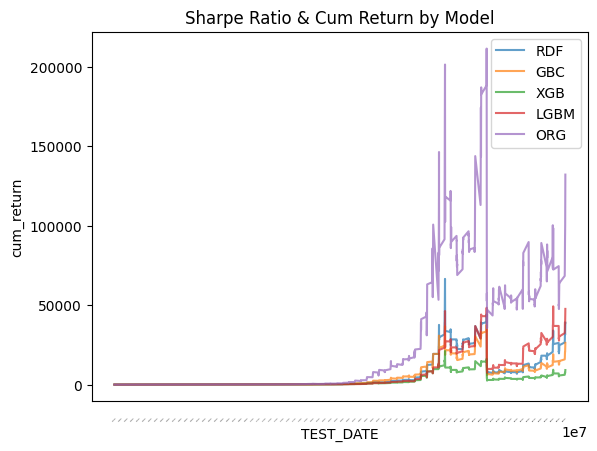

In [75]:
compare_sharpe_ratio(['RDF', 'GBC', 'XGB', 'LGBM'],
                     [Expanding_RDF_Result, Expanding_GBC_Result, Expanding_XGB_Result, Expanding_LGBM_Result],
                     [RDF_E_CUM_RETURN_static, GBC_E_CUM_RETURN_static, XGB_E_CUM_RETURN_static, LGBM_E_CUM_RETURN_static],
                     dynamic=False)

#### Dynamic

ORG Sharpe Ratio : 0.7293  최종 누적 수익률 : 132103.15024526353
RDF Sharpe Ratio : 0.8320  최종 누적 수익률 : 9191.824629703744
GBC Sharpe Ratio : 0.8085  최종 누적 수익률 : 8258.144540019995
XGB Sharpe Ratio : 0.8286  최종 누적 수익률 : 21573.050469508224
LGBM Sharpe Ratio : 0.8361  최종 누적 수익률 : 18360.592172428078


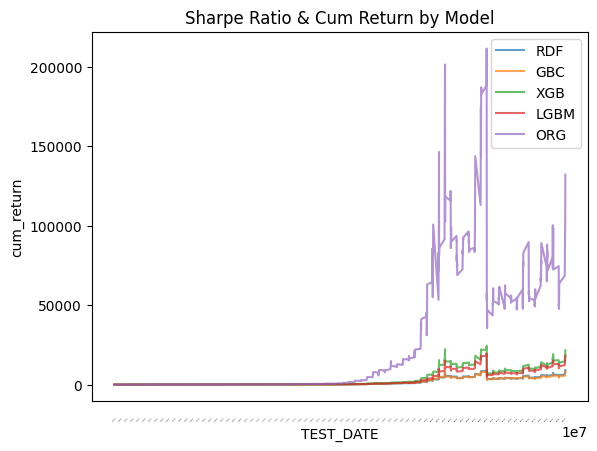

In [76]:
compare_sharpe_ratio(['RDF', 'GBC', 'XGB', 'LGBM'],
                     [Expanding_RDF_Result, Expanding_GBC_Result, Expanding_XGB_Result, Expanding_LGBM_Result],
                     [RDF_E_CUM_RETURN_dynamic, GBC_E_CUM_RETURN_dynamic, XGB_E_CUM_RETURN_dynamic, LGBM_E_CUM_RETURN_dynamic],
                     dynamic=True)